In [1]:
# !pip install -q gdown

import gdown
import os
import shutil
import zipfile
import pandas as pd
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
import cv2


# 1. Image Reading Module


In [2]:
file_id = "1HXH-6fVv3qplhXTOGJnBen2Tc_HRpGnI"
url = f"https://drive.google.com/uc?export=download&id={file_id}"
output = "data.zip"
gdown.download(url, output, quiet=False)


Downloading...
From (original): https://drive.google.com/uc?export=download&id=1HXH-6fVv3qplhXTOGJnBen2Tc_HRpGnI
From (redirected): https://drive.google.com/uc?export=download&id=1HXH-6fVv3qplhXTOGJnBen2Tc_HRpGnI&confirm=t&uuid=6a759def-a0a5-429c-bf59-1bec12d7640f
To: /kaggle/working/data.zip
100%|██████████| 642M/642M [00:02<00:00, 275MB/s] 


'data.zip'

In [3]:
if os.path.exists("data"):
    shutil.rmtree("data")

output = "data.zip"


with zipfile.ZipFile(output, 'r') as zip_ref:
    zip_ref.extractall("data")

extracted_files = os.listdir("data")
extracted_files


['Meta.csv',
 'Train.csv',
 'train',
 'Meta',
 'meta',
 'Test.csv',
 'test',
 'Test',
 'Train']

In [4]:
%cd data

train_folder = 'Train'
test_folder = 'Test'

train_files = os.listdir(train_folder)
print("Contents of the Train Folder:")
content = []

for file in train_files:
    content.append(file)

print(content)

test_files = os.listdir(test_folder)
count = 0
print("\nContents of the Test Folder:")
for file in test_files:
    if file.endswith('.png'):
        count+=1
count

/kaggle/working/data
Contents of the Train Folder:
['18', '21', '20', '38', '25', '19', '7', '13', '31', '16', '17', '2', '36', '15', '30', '14', '32', '26', '6', '41', '0', '29', '28', '8', '35', '3', '33', '9', '37', '4', '22', '40', '27', '34', '5', '11', '10', '1', '12', '42', '24', '23', '39']

Contents of the Test Folder:


12630

In [5]:
df1 = pd.read_csv('Train.csv')

class_ids = [0, 14, 17, 33, 13, 9, 25, 38]
filtered_df = df1[df1['ClassId'].isin(class_ids)]

sampled_df = filtered_df.groupby('ClassId').apply(lambda x: x.sample(n=100, random_state=42))

sampled_df = sampled_df.reset_index(drop=True)

sampled_df

/tmp/ipykernel_77/3834960850.py:6: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  sampled_df = filtered_df.groupby('ClassId').apply(lambda x: x.sample(n=100, random_state=42))


,Width,Height,Roi.X1,Roi.Y1,Roi.X2,Roi.Y2,ClassId,Path
0,29,30,6,6,24,25,0,Train/0/00000_00001_00000.png
1,56,54,5,5,50,49,0,Train/0/00000_00005_00022.png
2,69,70,7,6,63,64,0,Train/0/00000_00002_00024.png
3,60,64,5,6,55,59,0,Train/0/00000_00006_00019.png
4,27,26,6,5,22,21,0,Train/0/00000_00002_00000.png
...,...,...,...,...,...,...,...,...
795,31,30,6,5,26,25,38,Train/38/00038_00054_00005.png
796,63,70,5,7,58,64,38,Train/38/00038_00009_00027.png
797,46,50,5,5,41,45,38,Train/38/00038_00057_00016.png
798,53,52,6,6,47,47,38,Train/38/00038_00053_00029.png


In [6]:
df1 = pd.read_csv('Test.csv')
df1

,Width,Height,Roi.X1,Roi.Y1,Roi.X2,Roi.Y2,ClassId,Path
0,53,54,6,5,48,49,16,Test/00000.png
1,42,45,5,5,36,40,1,Test/00001.png
2,48,52,6,6,43,47,38,Test/00002.png
3,27,29,5,5,22,24,33,Test/00003.png
4,60,57,5,5,55,52,11,Test/00004.png
...,...,...,...,...,...,...,...,...
12625,42,41,5,6,37,36,12,Test/12625.png
12626,50,51,6,5,45,46,33,Test/12626.png
12627,29,29,6,6,24,24,6,Test/12627.png
12628,48,49,5,6,43,44,7,Test/12628.png


In [7]:
images_by_class = {}

for class_id in class_ids:
    class_images = []
    class_df = sampled_df[sampled_df['ClassId'] == class_id]
    for image_path in class_df['Path']:
        try:
            img = Image.open(image_path)
            class_images.append(img)
        except Exception as e:
            print(f"Error loading image {image_path}: {e}")
    
    images_by_class[class_id] = class_images

print('Read all images')

Read all images


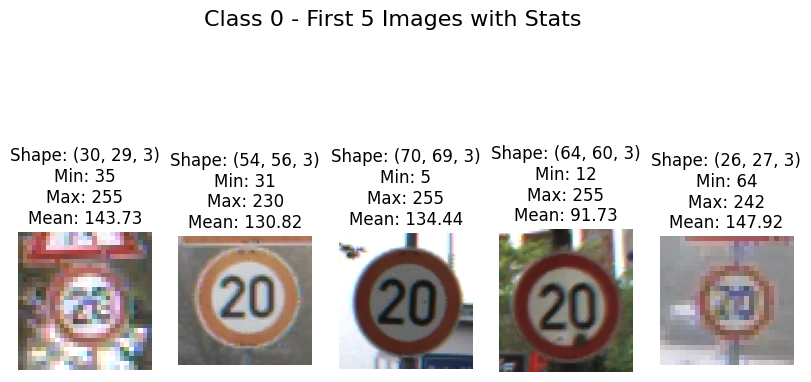

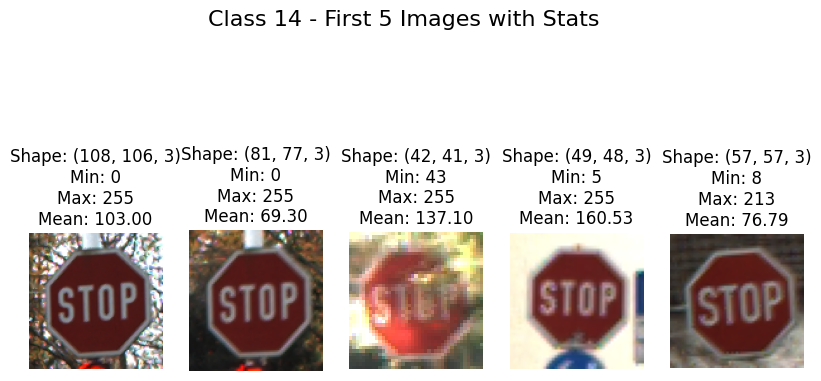

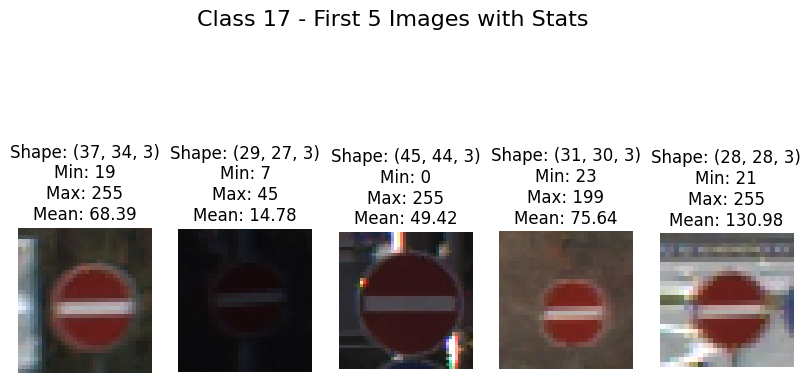

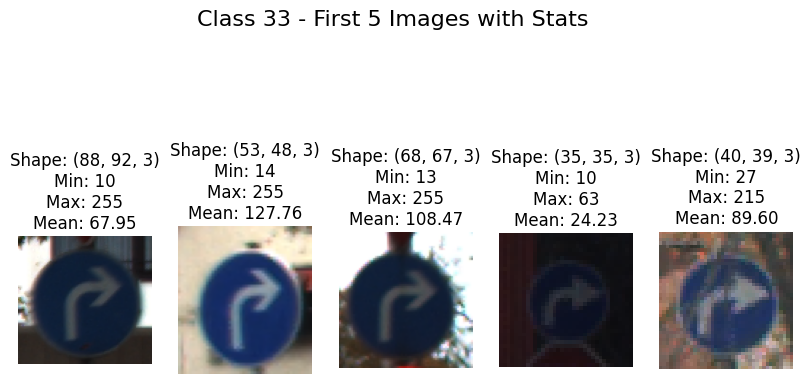

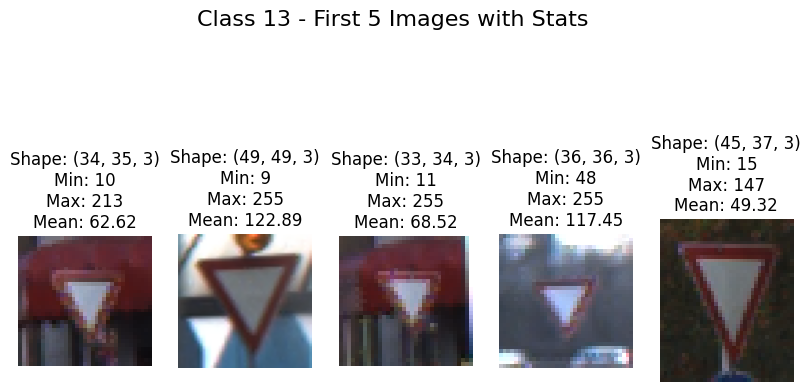

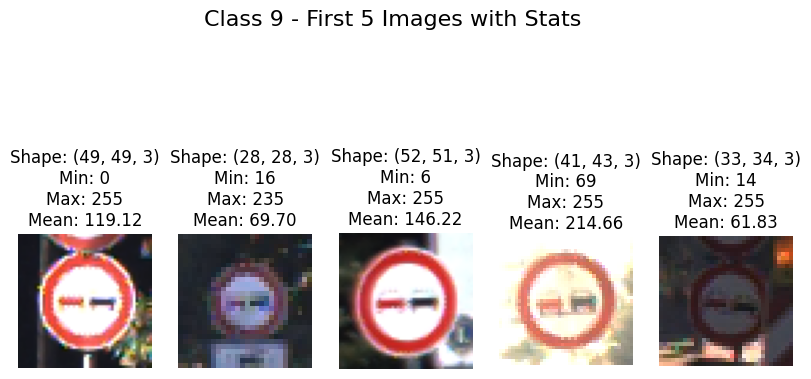

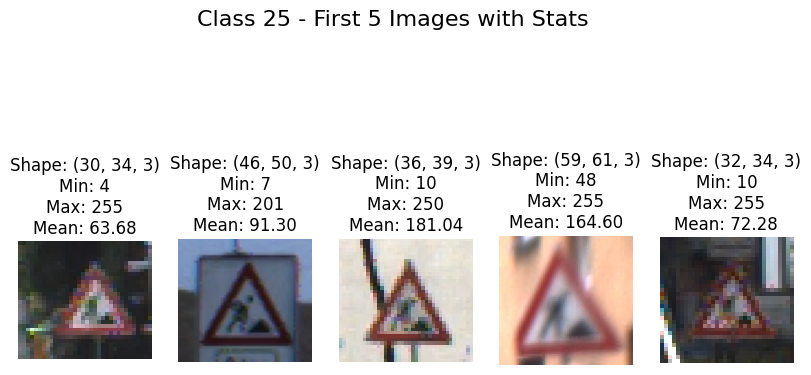

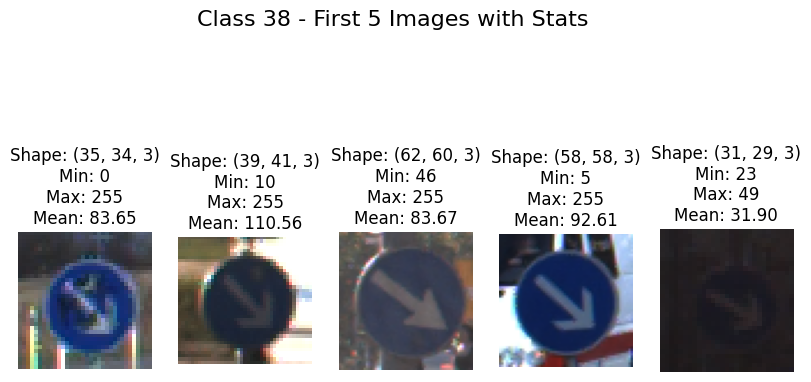

In [8]:
def get_image_stats(img_array):
    """Get basic statistics about an image"""
    if img_array is None:
        return None
    return {
        'shape': img_array.shape,
        'min': np.min(img_array),
        'max': np.max(img_array),
        'mean': np.mean(img_array),
        'dtype': img_array.dtype
    }

image_stats_by_class = {}

for class_id, class_images in images_by_class.items():
    class_stats = []
    plt.figure(figsize=(10, 6))
    
    for i, img in enumerate(class_images[:5]):
    
        img_array = np.array(img)
        
        stats = get_image_stats(img_array)
        class_stats.append(stats)
        
        plt.subplot(1, 5, i+1)
        plt.imshow(img_array)
        plt.axis('off')
        
        plt.title(f"Shape: {stats['shape']}\nMin: {stats['min']}\nMax: {stats['max']}\nMean: {stats['mean']:.2f}")
    
    image_stats_by_class[class_id] = class_stats
    
    plt.suptitle(f"Class {class_id} - First 5 Images with Stats", fontsize=16)
    plt.show()

# 2. Filter Implementation

### 🟦 Mean Filter
The **Mean Filter** is a smoothing technique used to reduce noise in an image by averaging the pixel values in a defined neighborhood. It replaces each pixel with the average of its surrounding pixels.

In the code below, a kernel of size `kernel_size x kernel_size` is created where each value is equal, summing to 1. The image is padded using reflection to handle borders, then for each pixel (and channel if colored), the average of neighboring values is computed using the kernel. This smooths sharp variations in intensity, effectively reducing noise.


In [9]:
def mean_filter(image, kernel_size=3):
    pad = kernel_size // 2
    if len(image.shape) == 2:
        padded = np.pad(image, pad, mode='reflect')
        filtered = np.zeros_like(image)
        kernel = np.ones((kernel_size, kernel_size)) / (kernel_size ** 2)
        
        for i in range(image.shape[0]):
            for j in range(image.shape[1]):
                neighborhood = padded[i:i+kernel_size, j:j+kernel_size]
                filtered[i,j] = np.sum(neighborhood * kernel)
    else: 
        padded = np.pad(image, ((pad, pad), (pad, pad), (0, 0)), mode='reflect')
        filtered = np.zeros_like(image)
        kernel = np.ones((kernel_size, kernel_size)) / (kernel_size ** 2)
        
        for channel in range(3):
            for i in range(image.shape[0]):
                for j in range(image.shape[1]):
                    neighborhood = padded[i:i+kernel_size, j:j+kernel_size, channel]
                    filtered[i,j,channel] = np.sum(neighborhood * kernel)
    
    return filtered.astype(np.uint8)

### 🟦 Gaussian Filter  
The **Gaussian Filter** is a smoothing filter that reduces image noise and detail using a weighted average, where central pixels have more influence than distant ones. It's ideal for blurring while preserving edges better than the mean filter.

In the code above, a Gaussian kernel is generated using the Gaussian function, where `sigma` controls the spread (smoothness). The image is padded and then convolved with this kernel for each pixel. For color images, the process is repeated for each channel separately, producing a softly blurred result.


In [10]:
def gaussian_filter(image, kernel_size=5, sigma=1.0):
    def gaussian_kernel(size, sigma):
        kernel = np.zeros((size, size))
        k = size // 2
        for i in range(-k, k+1):
            for j in range(-k, k+1):
                kernel[i+k, j+k] = np.exp(-(i**2 + j**2)/(2*sigma**2))
        return kernel / np.sum(kernel)
    
    pad = kernel_size // 2
    kernel = gaussian_kernel(kernel_size, sigma)
    
    if len(image.shape) == 2:
        padded = np.pad(image, pad, mode='reflect')
        filtered = np.zeros_like(image)
        for i in range(image.shape[0]):
            for j in range(image.shape[1]):
                filtered[i,j] = np.sum(padded[i:i+kernel_size, j:j+kernel_size] * kernel)
    else:
        padded = np.pad(image, ((pad, pad), (pad, pad), (0, 0)), mode='reflect')
        filtered = np.zeros_like(image)
        for channel in range(3):
            for i in range(image.shape[0]):
                for j in range(image.shape[1]):
                    filtered[i,j,channel] = np.sum(padded[i:i+kernel_size, j:j+kernel_size, channel] * kernel)
    
    return filtered.astype(np.uint8)

### 🟦 Median Filter  
The **Median Filter** is a non-linear filter used to remove salt-and-pepper noise by replacing each pixel with the median value of its surrounding neighborhood. Unlike mean filters, it preserves edges while effectively reducing noise.

In this code, the image is padded to handle borders, then a sliding window (of size `kernel_size`) collects neighborhood pixel values. The median of these values is computed and assigned to the central pixel. For color images, this is done independently for each channel, ensuring smoother results without blurring edges.


In [11]:
def median_filter(image, kernel_size=3):
    pad = kernel_size // 2
    if len(image.shape) == 2: 
        padded = np.pad(image, pad, mode='reflect')
        filtered = np.zeros_like(image)
        for i in range(image.shape[0]):
            for j in range(image.shape[1]):
                filtered[i,j] = np.median(padded[i:i+kernel_size, j:j+kernel_size])
    else: 
        padded = np.pad(image, ((pad, pad), (pad, pad), (0, 0)), mode='reflect')
        filtered = np.zeros_like(image)
        for channel in range(3):
            for i in range(image.shape[0]):
                for j in range(image.shape[1]):
                    filtered[i,j,channel] = np.median(padded[i:i+kernel_size, j:j+kernel_size, channel])
    
    return filtered.astype(np.uint8)

### 🟦 Adaptive Median Filter  
The **Adaptive Median Filter** is an advanced noise-reduction technique designed to handle varying noise densities. It adjusts the window size dynamically and preserves edges better than standard median filtering.

In this code, for each pixel, a small window (starting at 3×3) is expanded up to `max_window_size` until the median lies between the minimum and maximum values. If the pixel value lies between those bounds, it’s kept; otherwise, it’s replaced by the median. This adaptiveness allows better handling of high-intensity noise like salt-and-pepper.


In [12]:
def adaptive_median_filter(image, max_window_size=7):
    pad = max_window_size // 2
    filtered = np.zeros_like(image)
    padded = np.pad(image, ((pad, pad), (pad, pad)), mode='reflect')
    
    for i in range(image.shape[0]):
        for j in range(image.shape[1]):
            window_size = 3
            while window_size <= max_window_size:
                window = padded[i:i+window_size, j:j+window_size]
                z_min = np.min(window)
                z_max = np.max(window)
                z_med = np.median(window)
                z_xy = image[i,j]
                
                if z_min < z_med < z_max:
                    if z_min < z_xy < z_max:
                        filtered[i,j] = z_xy
                    else:
                        filtered[i,j] = z_med
                    break
                else:
                    window_size += 2
            else:
                filtered[i,j] = z_med
    
    return filtered.astype(np.uint8)

### 🟦 Unsharp Masking  
**Unsharp Masking** is a sharpening technique that enhances image details by amplifying edges. It works by subtracting a blurred version of the image to create a mask, which is then added back to the original image.

In this code, a Gaussian filter blurs the image, and the difference between the original and blurred image (the high-frequency components) forms the mask. This mask is scaled by `alpha` and added back to the original image to emphasize edges and fine details, producing a sharper output.


In [13]:
def unsharp_masking(image, kernel_size=5, sigma=1.0, alpha=1.5):
    blurred = gaussian_filter(image, kernel_size, sigma)
    
    mask = image.astype(np.float32) - blurred.astype(np.float32)
    
    sharpened = image.astype(np.float32) + alpha * mask
    sharpened = np.clip(sharpened, 0, 255).astype(np.uint8)
    
    return sharpened

### 🟦 High Boost Filtering  
**High Boost Filtering** is an enhancement technique that sharpens an image by adding a scaled version of the high-frequency details (edges) back to the original image, amplifying the contrast and fine details.

In this code, a blurred version of the image is obtained using a Gaussian filter. The mask is calculated by subtracting the blurred image from the original, which isolates the high-frequency details. This mask is then scaled by a factor `k` and added back to the original image, producing a boosted, sharper result.


In [14]:
def high_boost_filter(image, kernel_size=5, sigma=1.0, k=1.5):
    blurred = gaussian_filter(image, kernel_size, sigma)
    mask = image.astype(np.float32) - blurred.astype(np.float32)
    boosted = image.astype(np.float32) + k * mask
    boosted = np.clip(boosted, 0, 255).astype(np.uint8)
    return boosted

### 🟦 Filters Comparison and Application  
This script applies various filters (Mean, Gaussian, Median, and Adaptive Median) to images from different classes and displays the results for comparison.

1. **`display_filters_comparison`**: This function visualizes the original image alongside its filtered versions. It arranges the images in a grid layout and shows each filter's name as the title. The function handles both grayscale and RGB images, adjusting the display accordingly.
   
2. **`apply_filters_on_class_images`**: This function iterates over the images of different classes, applies the specified filters (`mean_filter`, `gaussian_filter`, `median_filter`, and `adaptive_median_filter`), and then passes the original and filtered images to `display_filters_comparison` for visualization.

By calling `apply_filters_on_class_images`, the filters are applied to a sample of images, and the results are displayed side by side for easy comparison of their effects.


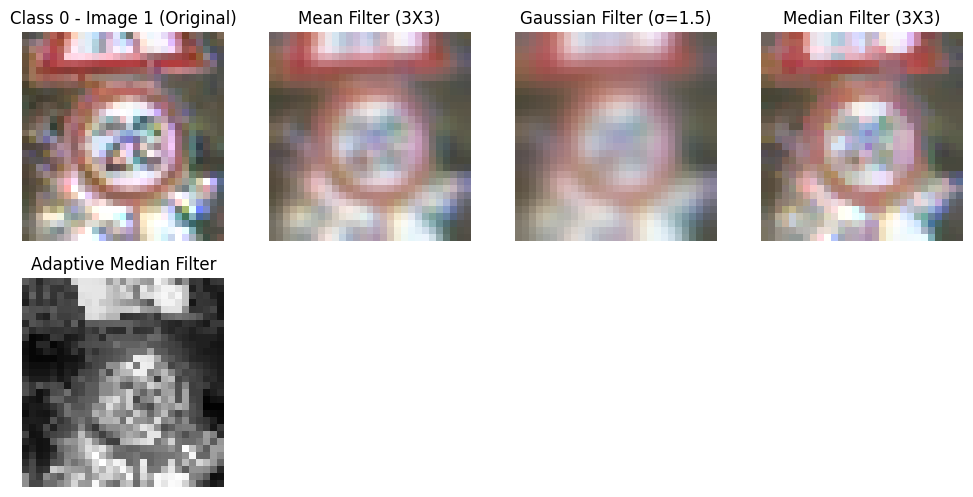

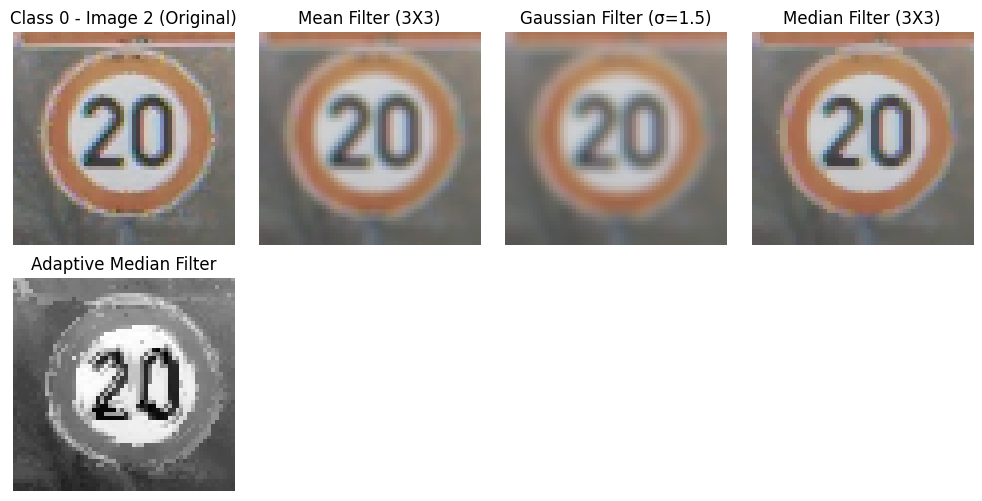

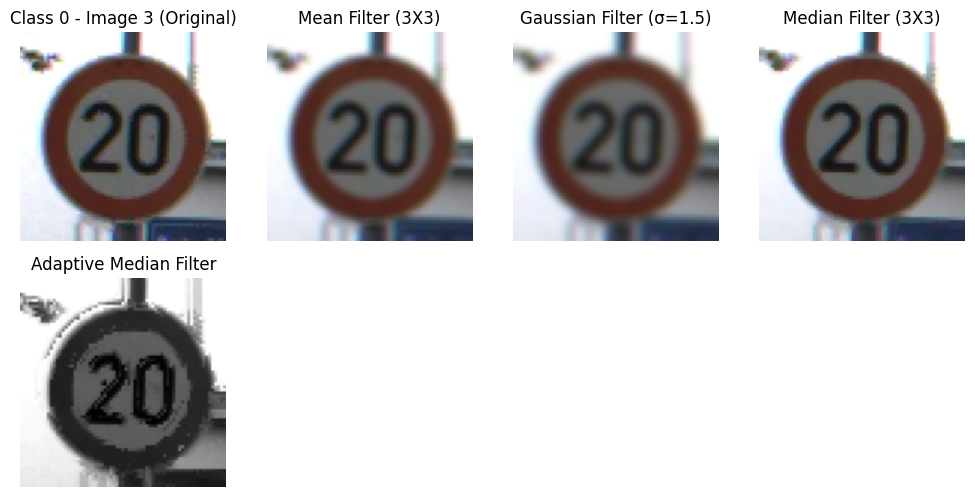

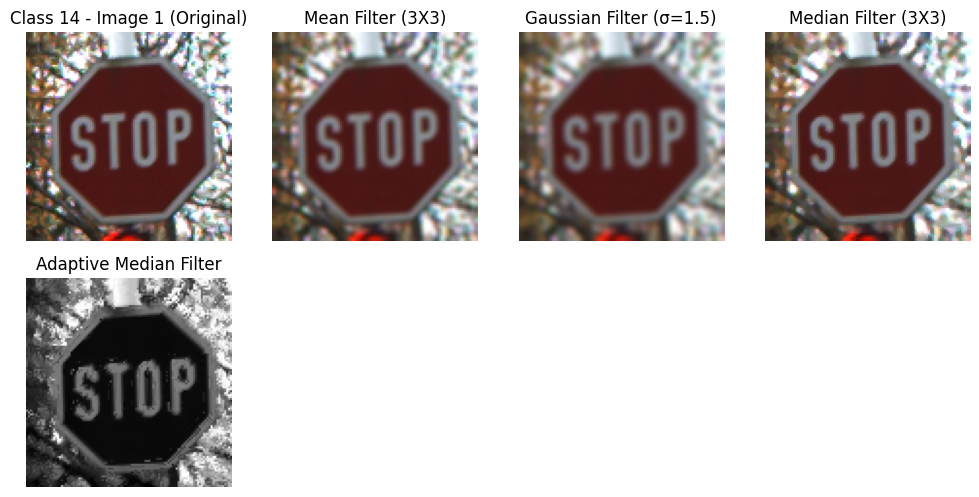

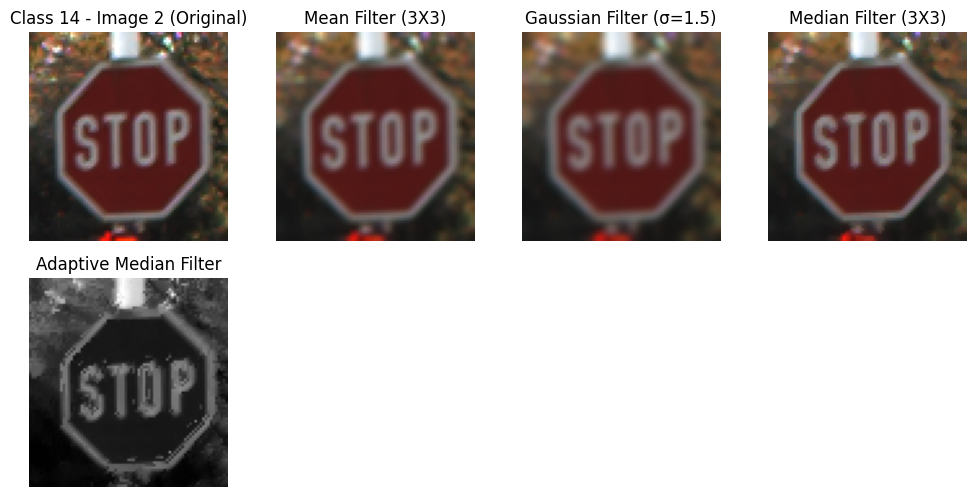

...

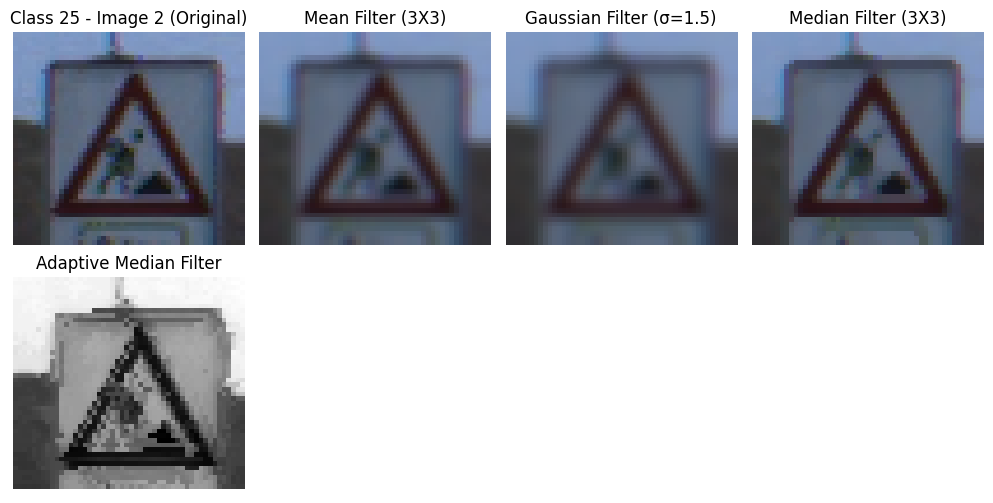

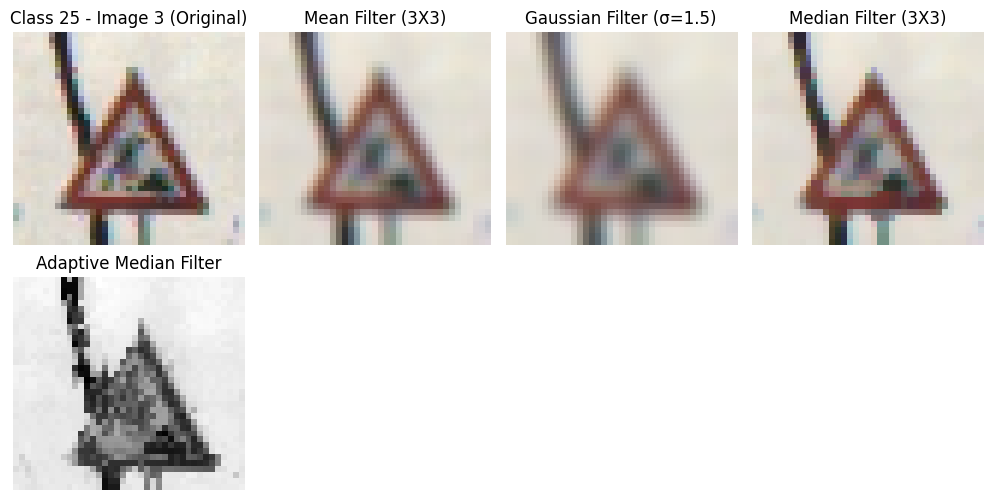

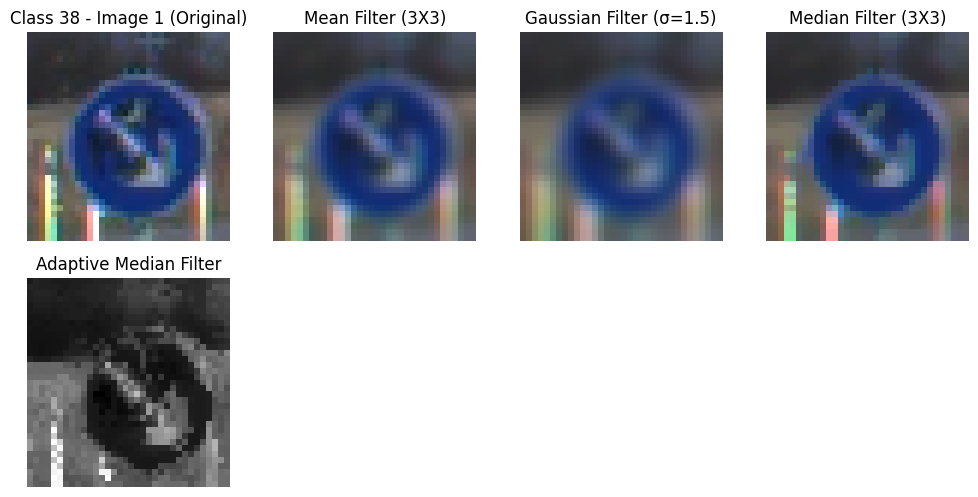

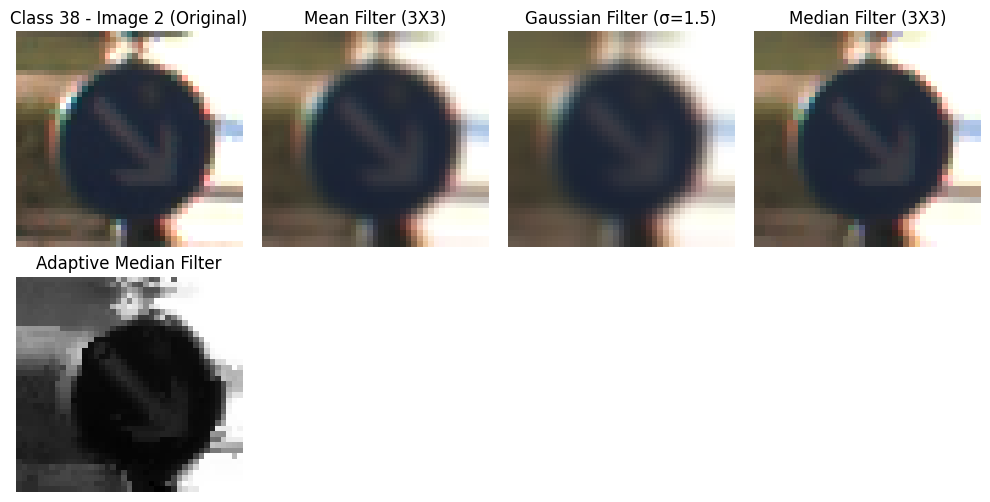

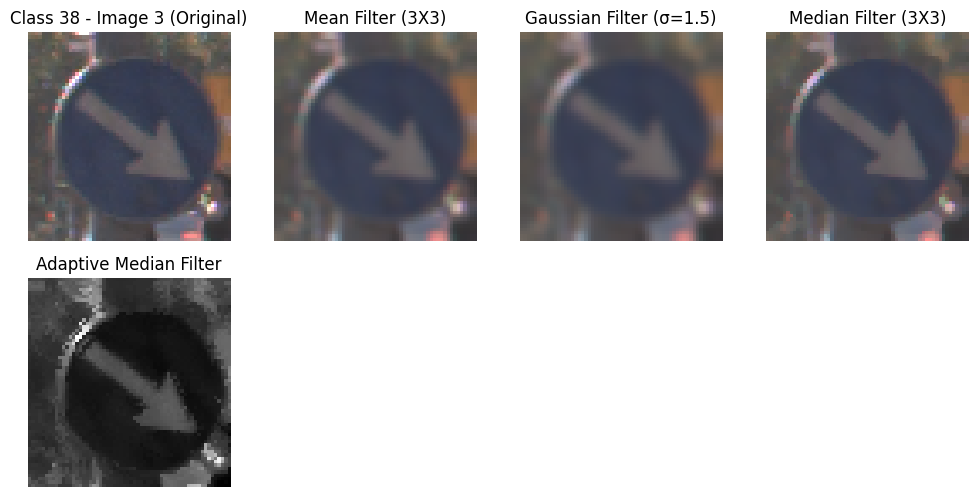

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image

def display_filters_comparison(original, filtered_images, filter_names, class_id, image_index):
    num_filters = len(filtered_images)
    num_cols = 3
    num_rows = (num_filters + 1 + num_cols - 1) // num_cols
    
    plt.figure(figsize=(10, 5*num_rows))
    
    plt.subplot(4, 4, 1)
    plt.imshow(original)
    plt.title(f'Class {class_id} - Image {image_index + 1} (Original)')
    plt.axis('off')
    
    for i, (filt_img, name) in enumerate(zip(filtered_images, filter_names), 1):
        plt.subplot(4, 4, i+1)
        
        if len(filt_img.shape) == 2:
            plt.imshow(filt_img, cmap='gray')
        else:
            plt.imshow(filt_img)
            
        plt.title(name)
        plt.axis('off')
    
    for i in range(num_filters + 2, num_rows * num_cols + 1):
        plt.subplot(4, 4, i)
        plt.axis('off')
    
    plt.tight_layout()
    plt.show()

def apply_filters_on_class_images(images_by_class, class_ids, filter_functions):
    filter_names = ['Mean Filter (3X3)', 'Gaussian Filter (σ=1.5)', 'Median Filter (3X3)', 'Adaptive Median Filter']
    
    for class_id in class_ids:
        class_images = images_by_class[class_id]
        
        for image_index, img in enumerate(class_images[:3]):
            img_rgb = np.array(img.convert('RGB'))
            img_gray = np.array(img.convert('L'))
            
            filtered_images = [
                mean_filter(img_rgb),
                gaussian_filter(img_rgb, sigma=1.5),
                median_filter(img_rgb),
                adaptive_median_filter(img_gray)
            ]
            
            display_filters_comparison(img_rgb, filtered_images, filter_names, class_id, image_index)

apply_filters_on_class_images(images_by_class, class_ids, [mean_filter, gaussian_filter, median_filter, adaptive_median_filter])


### 🟦 Concept of Color Space Conversion and Segmentation  

1. **Color Space Conversion (RGB to HSV)**  
   The RGB (Red, Green, Blue) color space represents colors based on the combination of three primary colors. However, RGB is not always ideal for tasks like color-based segmentation. The **HSV (Hue, Saturation, Value)** color space, on the other hand, is more aligned with human perception, making it easier to isolate colors for tasks like object detection or segmentation.

   - **Hue (H)** represents the color itself (angle in the color wheel from 0° to 360°).
   - **Saturation (S)** measures the intensity or purity of the color.
   - **Value (V)** indicates the brightness of the color.

   The function `rgb_to_hsv_manual` implements this conversion by calculating the hue based on which RGB component is the highest, and then computing the saturation and value using the max and min values of the RGB components.

2. **Color-Based Segmentation**  
   After converting an image to HSV, segmentation involves isolating specific colors, like red or blue, based on their hue ranges. By defining thresholds for Hue, Saturation, and Value, we can create a binary mask that highlights pixels of a particular color. The function `segment_signs` applies these thresholds to detect either red or blue colors.

   - For red, two ranges of hue are used: one close to 0° (red) and another close to 360° (also red). A similar approach is used for other colors, adjusting hue values accordingly.
   
3. **Post-Processing the Mask**  
   After obtaining the initial mask, there may be noise due to small isolated regions that are incorrectly classified as the target color. The function `post_process_mask` improves the mask by checking each pixel’s neighborhood. If a pixel has fewer than 3 white neighbors in its 3x3 neighborhood, it's considered noise and set to black.

4. **Visualization**  
   The final step is to visualize the results using `visualize_segmentation`. It shows the original image, the HSV color space version of the image, the initial mask, and the processed mask in a 2x2 grid layout. This helps to visually compare the effectiveness of segmentation before and after post-processing.

### Use Case  
This approach is useful in scenarios where we need to segment specific colors in images, such as traffic sign recognition or detecting objects with distinct colors (e.g., red or blue). The HSV space makes it easier to isolate colors under varying lighting conditions compared to the RGB space.


In [16]:
def rgb_to_hsv_manual(rgb_img):
    rgb = rgb_img / 255.0
    r, g, b = rgb[:,:,0], rgb[:,:,1], rgb[:,:,2]
    
    cmax = np.maximum.reduce([r, g, b])
    cmin = np.minimum.reduce([r, g, b])
    delta = cmax - cmin

    h = np.zeros_like(cmax)
    mask = delta != 0

    idx = (cmax == r) & mask
    h[idx] = (60 * ((g[idx] - b[idx]) / delta[idx]) % 360)

    idx = (cmax == g) & mask
    h[idx] = (60 * ((b[idx] - r[idx]) / delta[idx]) + 120)

    idx = (cmax == b) & mask
    h[idx] = (60 * ((r[idx] - g[idx]) / delta[idx]) + 240)

    s = np.zeros_like(cmax)
    s[cmax != 0] = delta[cmax != 0] / cmax[cmax != 0]

    v = cmax

    hsv = np.stack([h, s, v], axis=2)
    return hsv

def segment_signs(hsv_img, color='red'):
    h, s, v = hsv_img[:,:,0], hsv_img[:,:,1], hsv_img[:,:,2]
    
    if color == 'red':
        mask1 = (h >= 0) & (h <= 15) & (s >= 0.4) & (v >= 0.3)
        mask2 = (h >= 345) & (h <= 360) & (s >= 0.4) & (v >= 0.3)
        mask = mask1 | mask2
    elif color == 'blue':
        mask = (h >= 100) & (h <= 130) & (s >= 0.4) & (v >= 0.3)
    else:
        raise ValueError("Color must be 'red' or 'blue'")
    
    return mask.astype(np.uint8) * 255

def post_process_mask(mask):
    padded_mask = np.pad(mask, pad_width=1, mode='constant', constant_values=0)
    processed = mask.copy()
    
    h, w = mask.shape
    
    for i in range(1, h+1):
        for j in range(1, w+1):
            if padded_mask[i, j] == 255:
                neighbors = padded_mask[i-1:i+2, j-1:j+2]
                white_count = np.sum(neighbors == 255)
                if white_count <= 2:
                    processed[i-1, j-1] = 0
    return processed

def visualize_segmentation(original, hsv, mask, processed_mask, color, class_id, image_index):
    plt.figure(figsize=(15, 10))
    
    plt.subplot(2, 2, 1)
    plt.imshow(original)
    plt.title(f'Original Image (Class {class_id}, Img {image_index})')
    plt.axis('off')
    
    plt.subplot(2, 2, 2)
    plt.imshow(hsv)
    plt.title('HSV Color Space')
    plt.axis('off')
    
    plt.subplot(2, 2, 3)
    plt.imshow(mask, cmap='gray')
    plt.title(f'Initial {color} Mask')
    plt.axis('off')
    
    plt.subplot(2, 2, 4)
    plt.imshow(processed_mask, cmap='gray')
    plt.title(f'Processed {color} Mask')
    plt.axis('off')
    
    plt.tight_layout()
    plt.show()

Processing class: 0


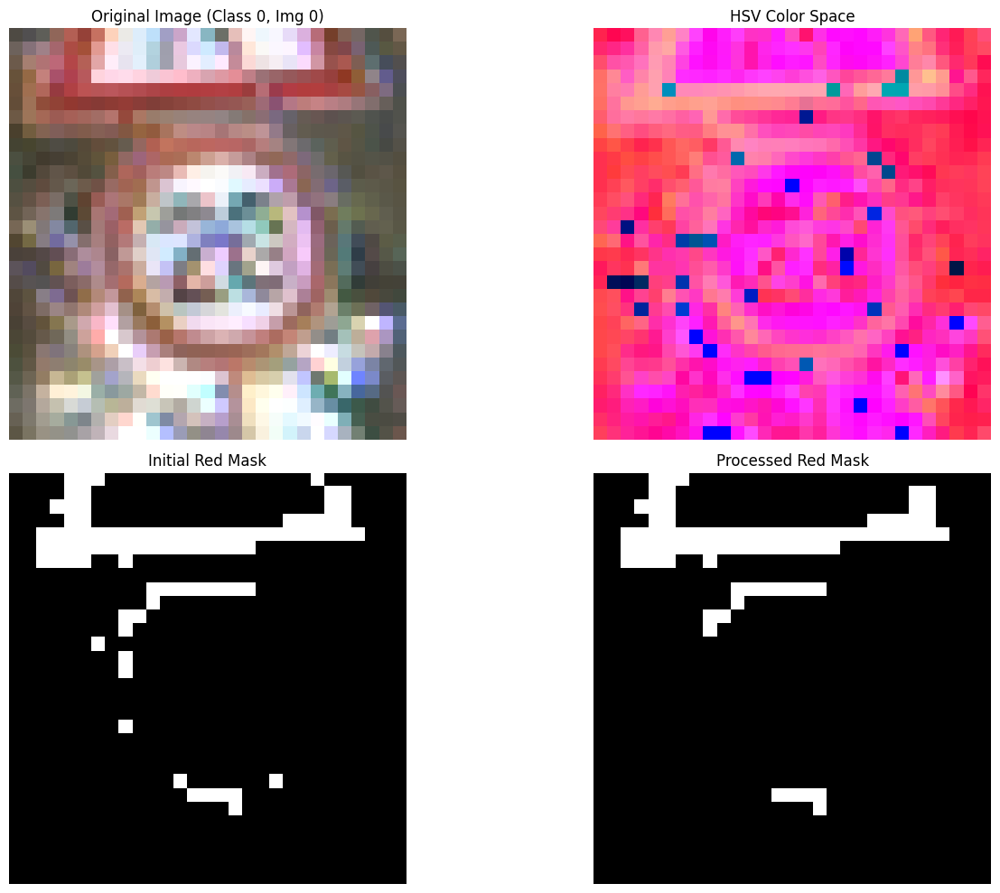

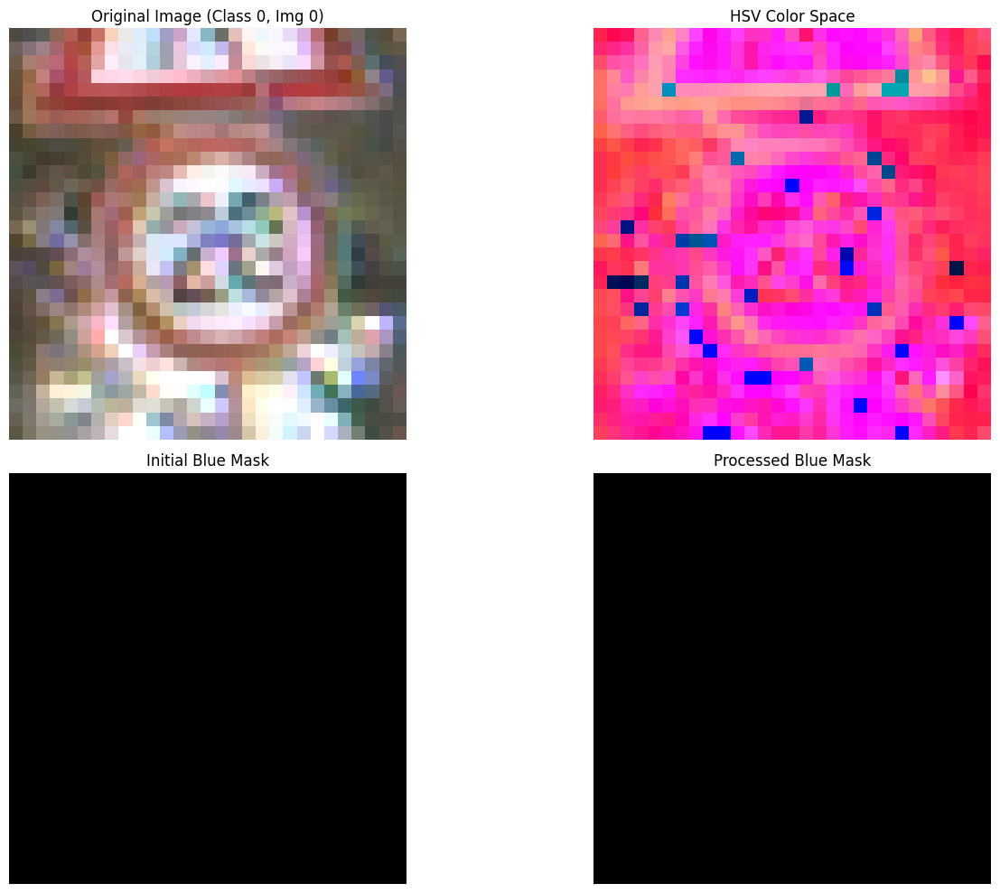

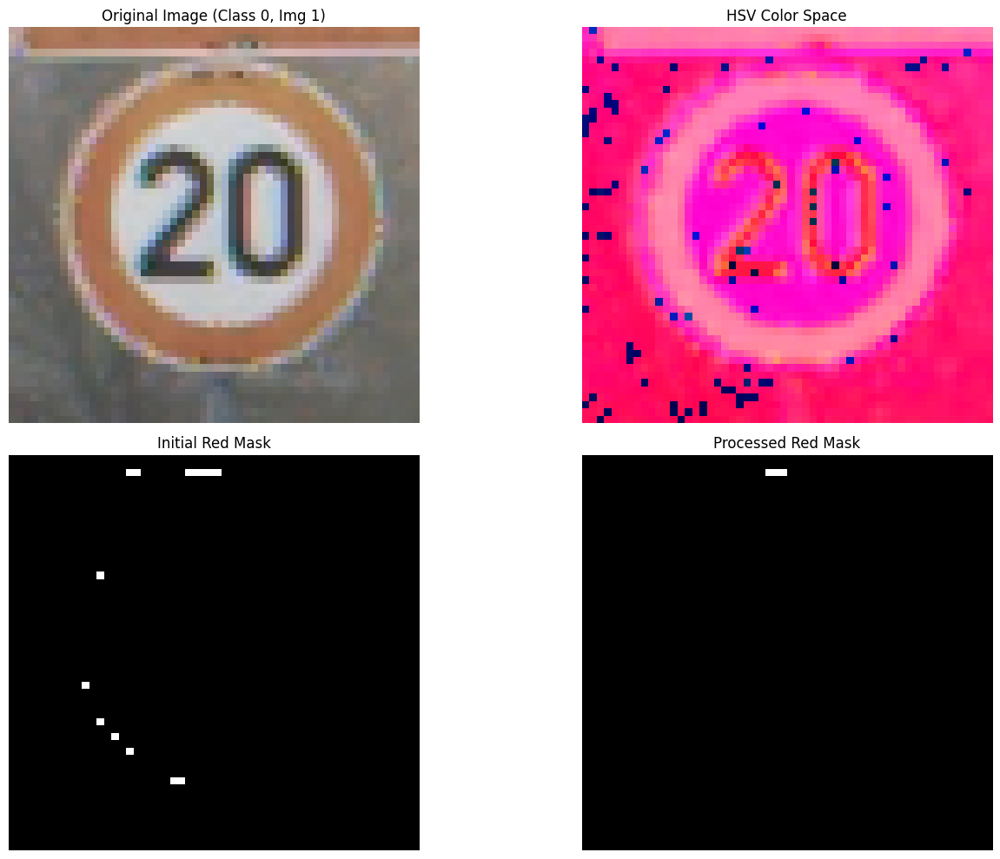

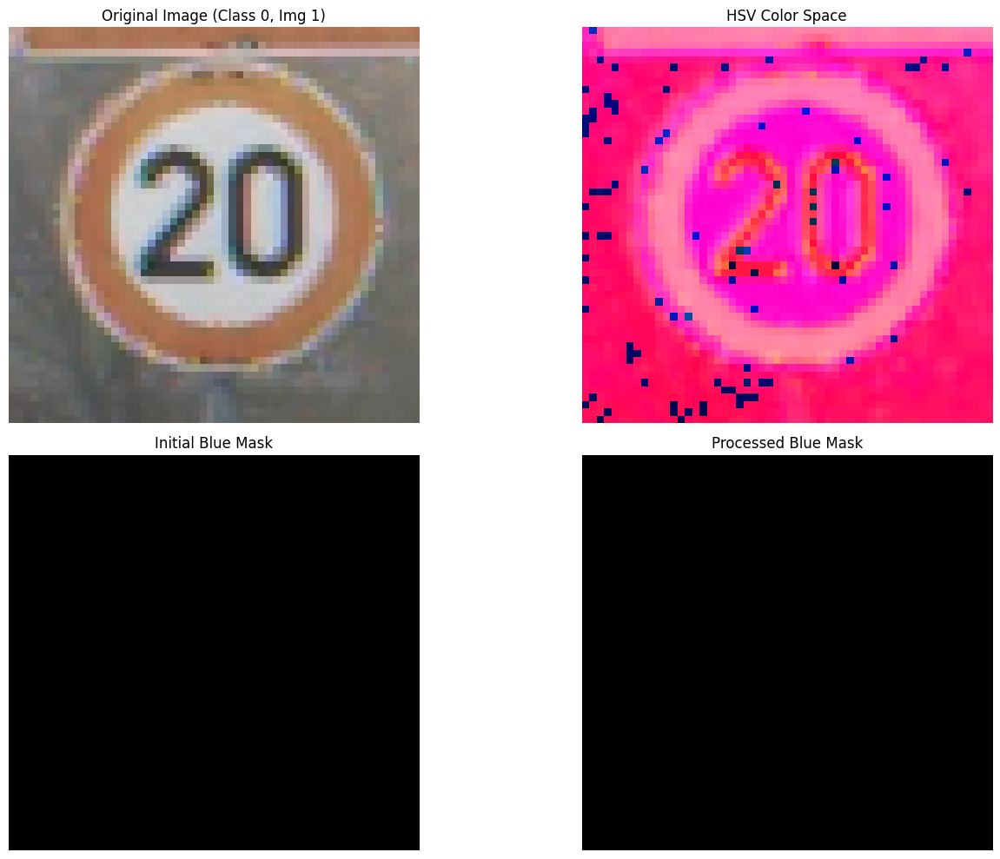

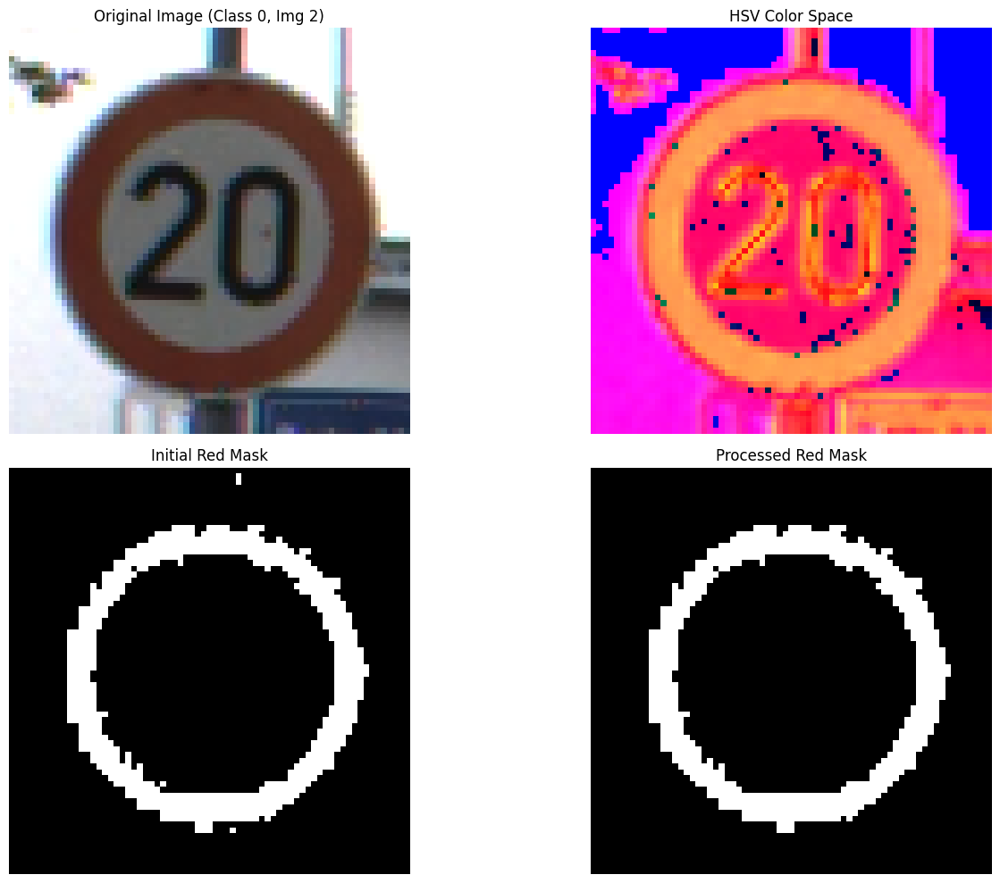

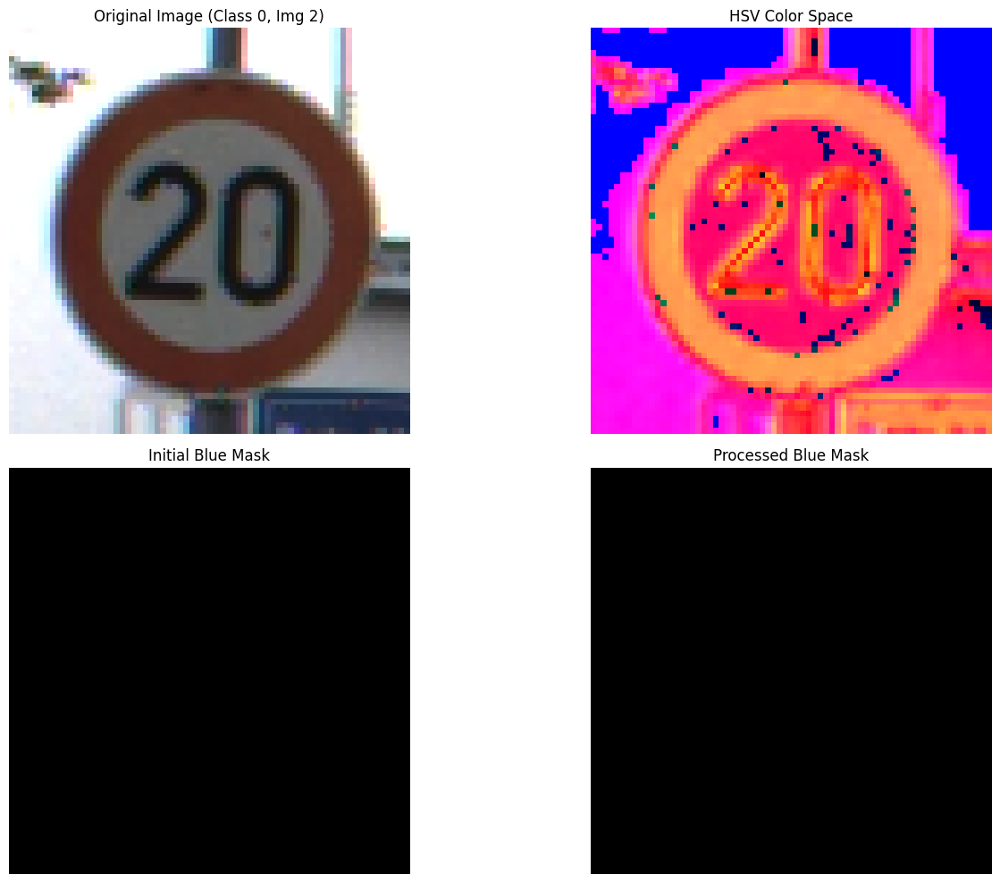

Processing class: 14


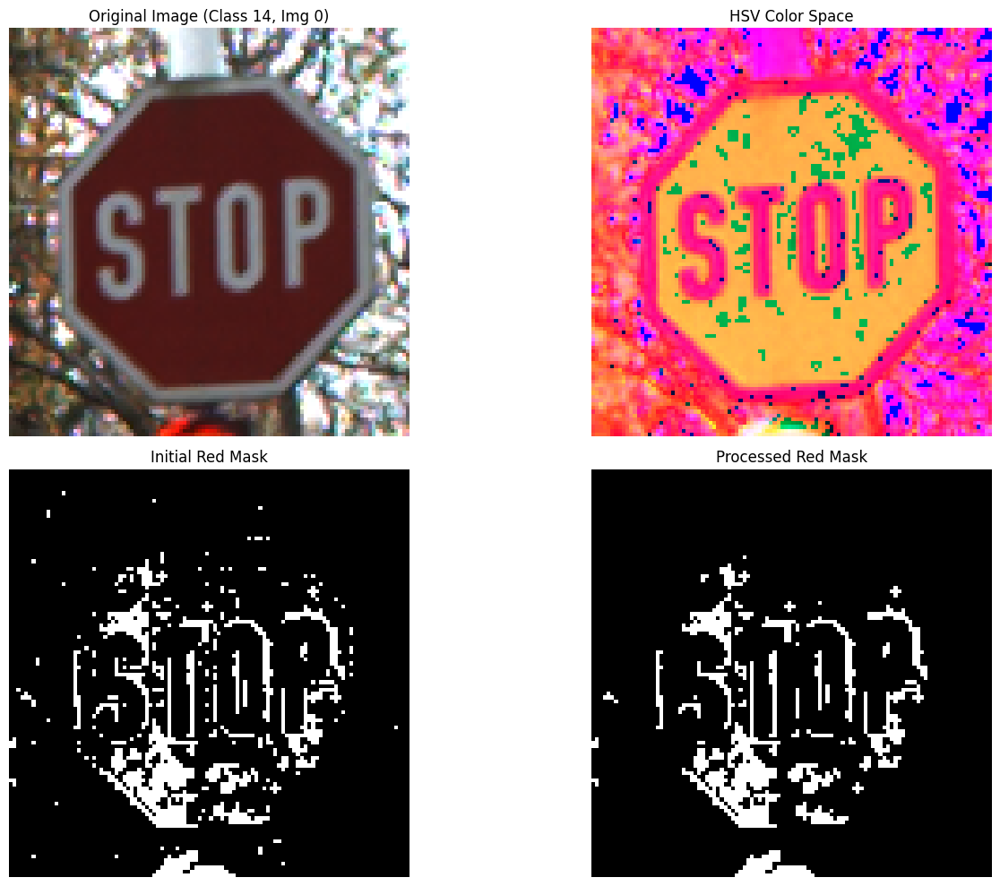

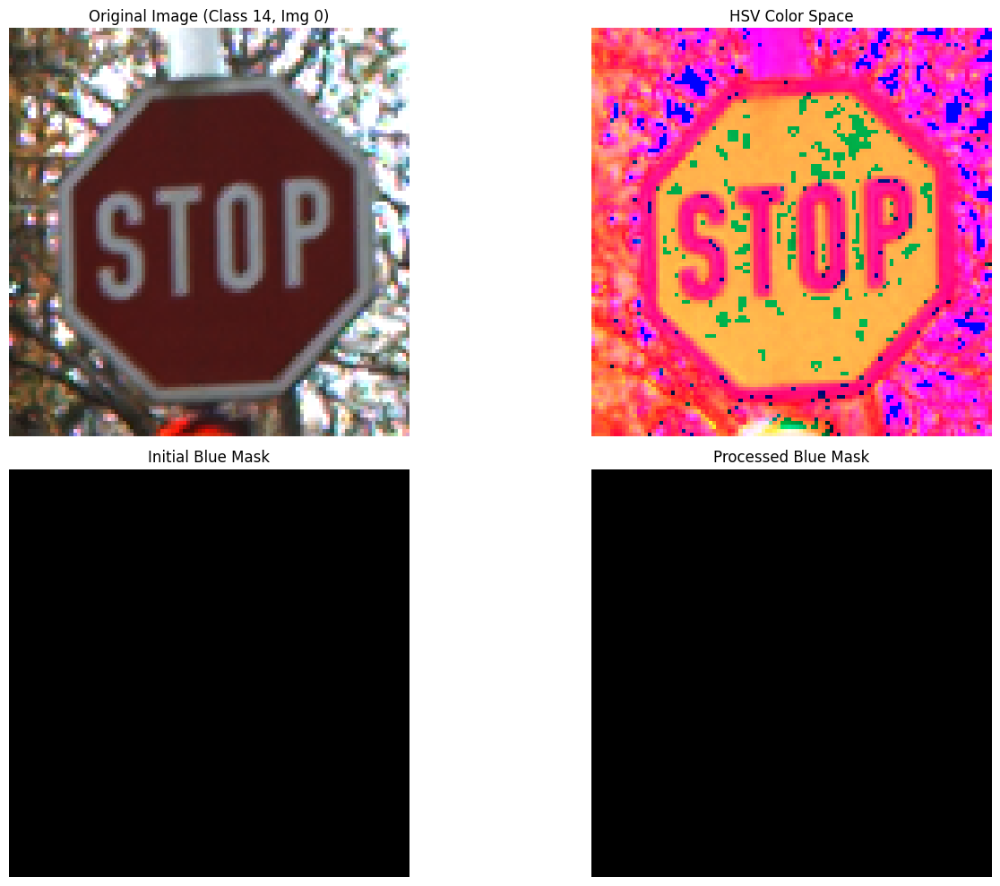

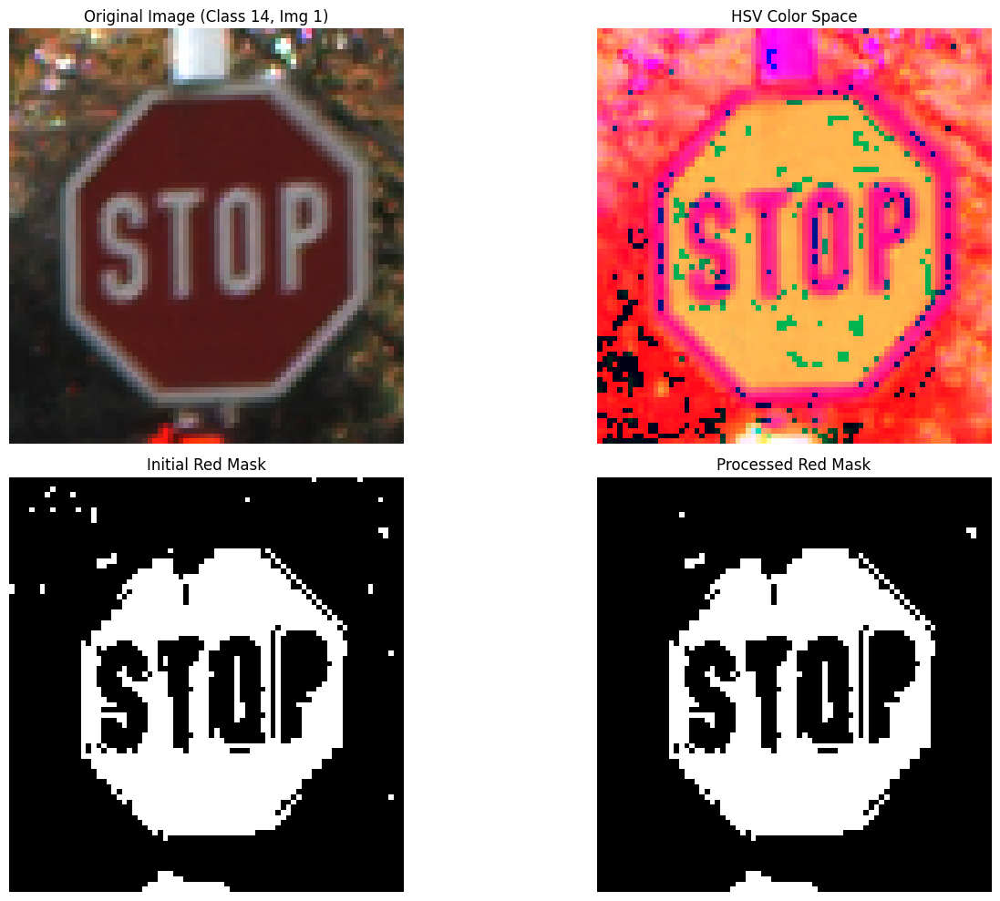

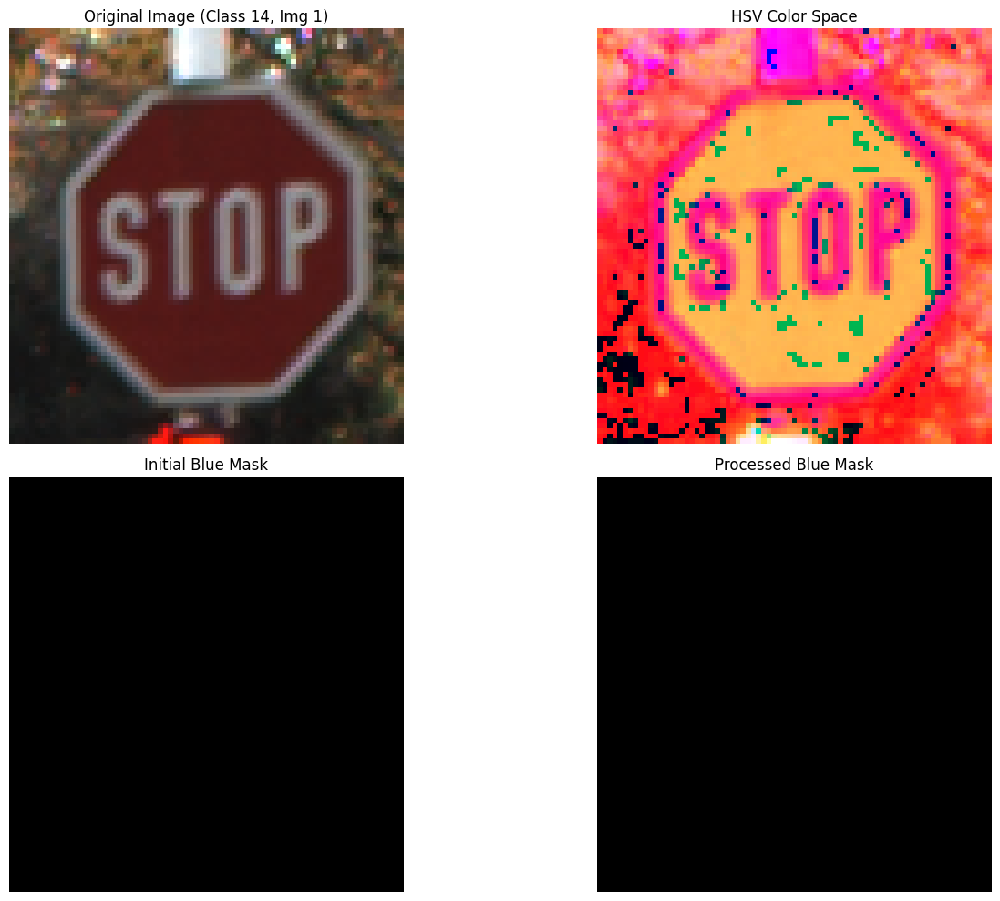

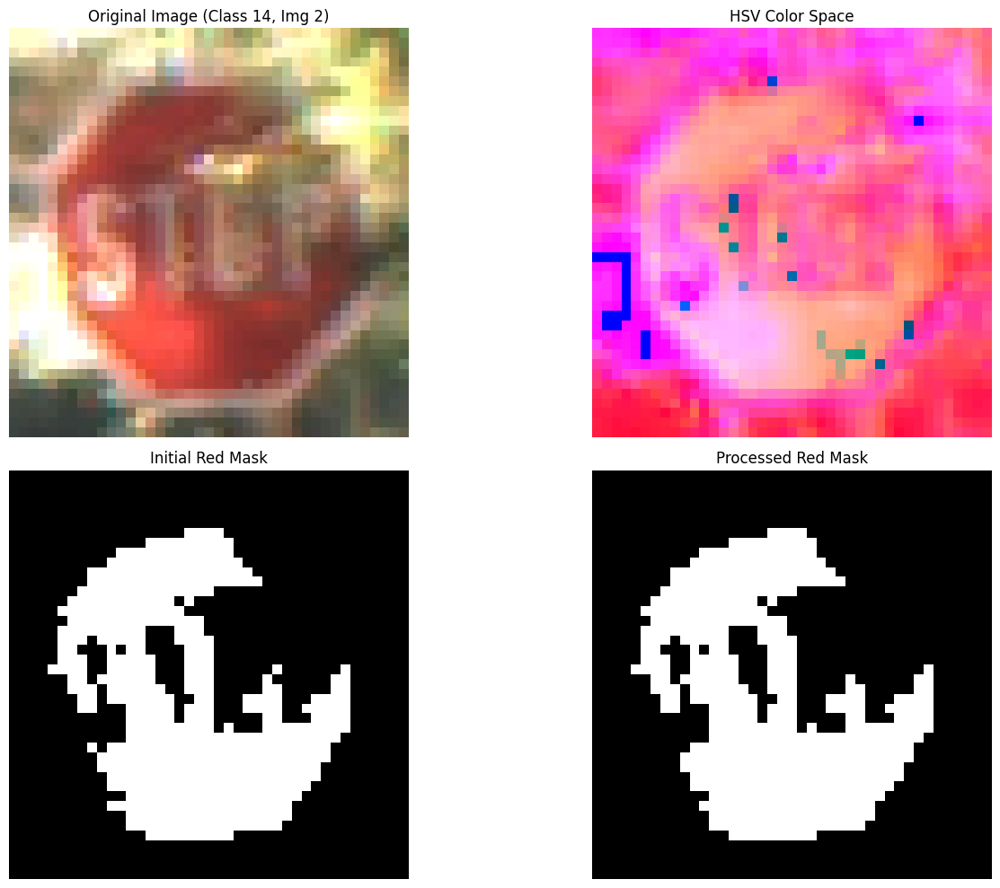

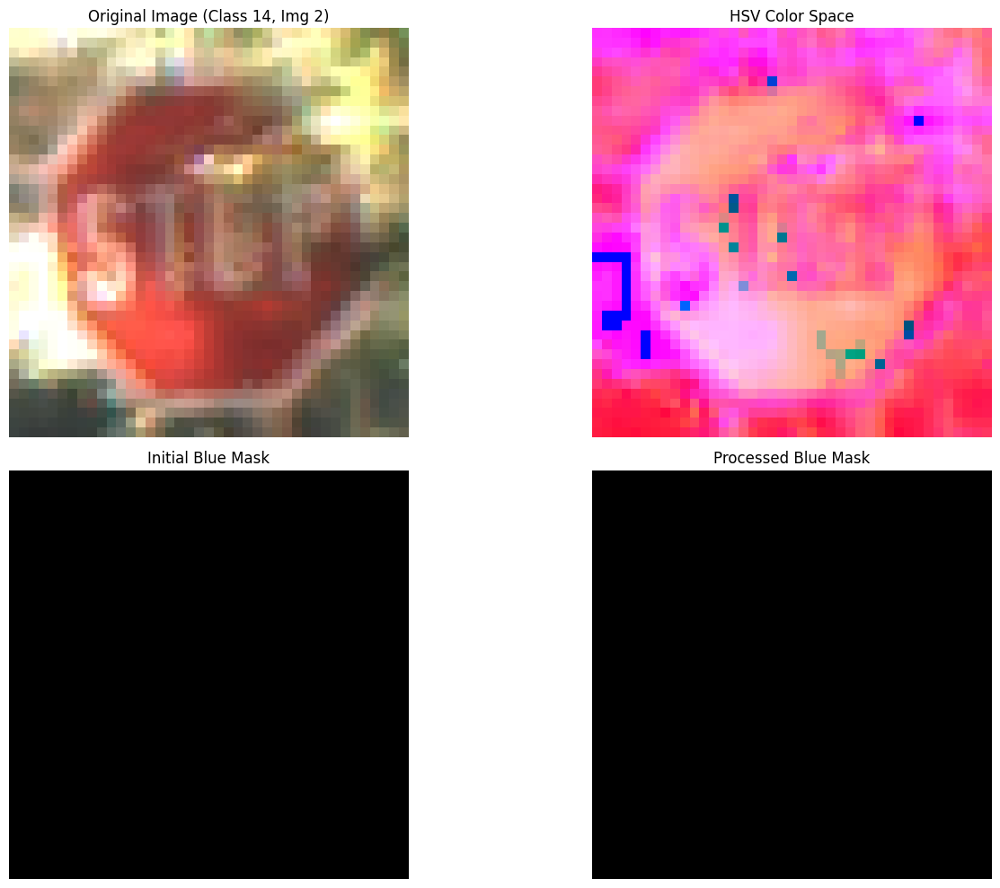

Processing class: 17


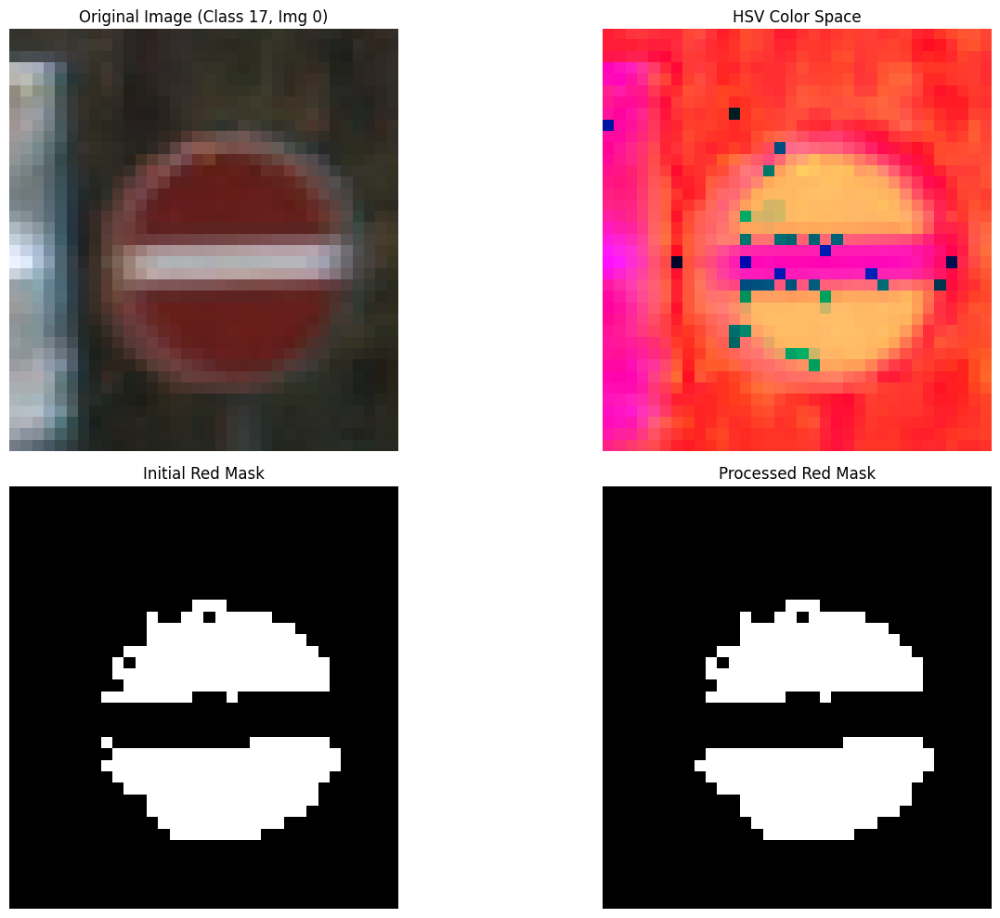

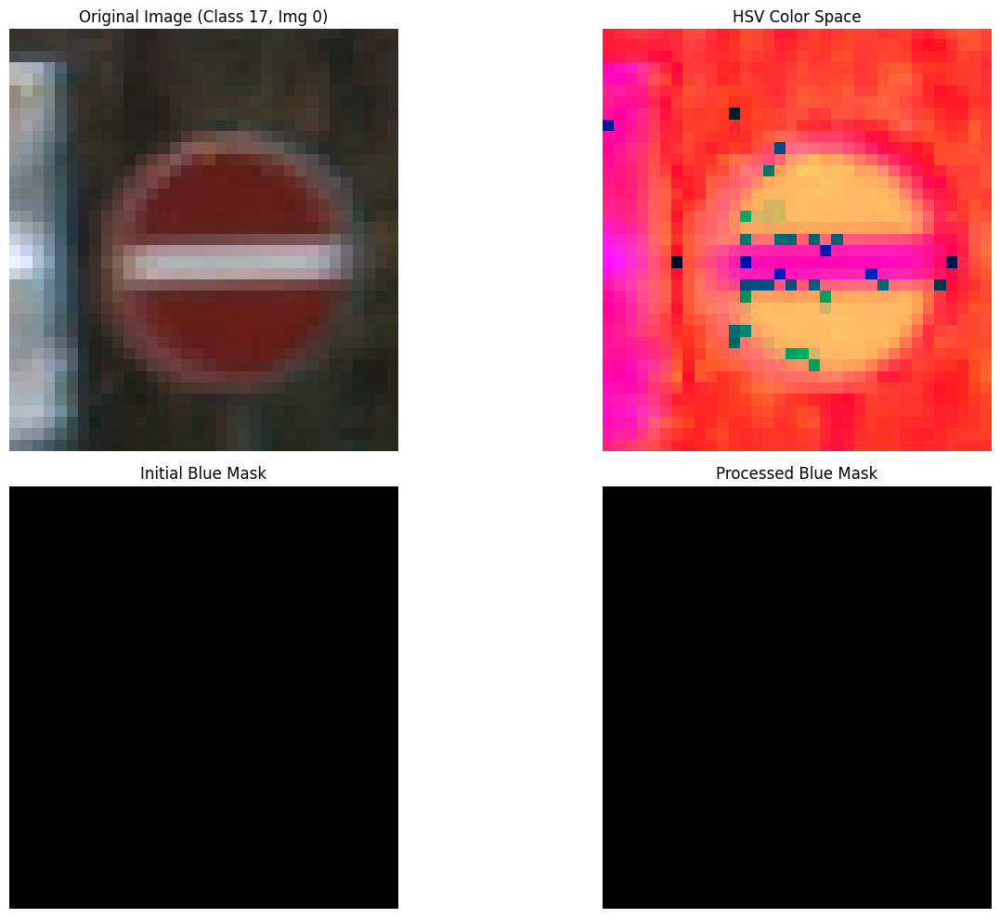

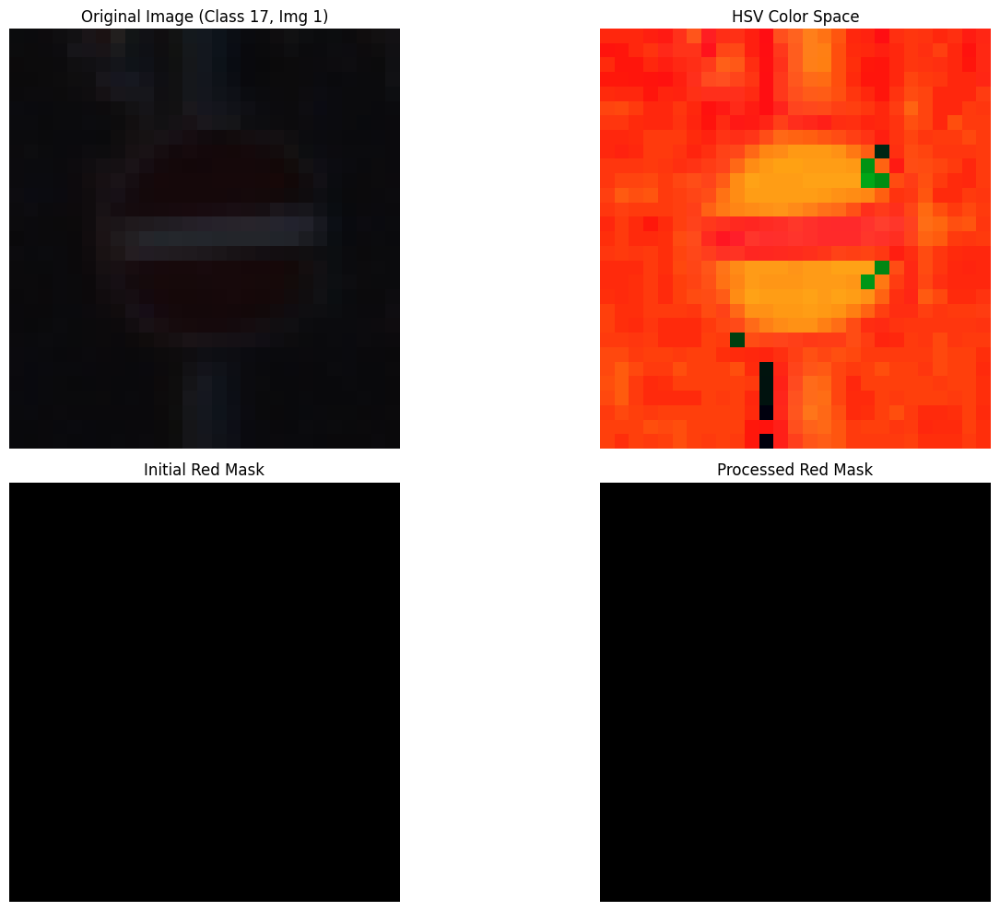

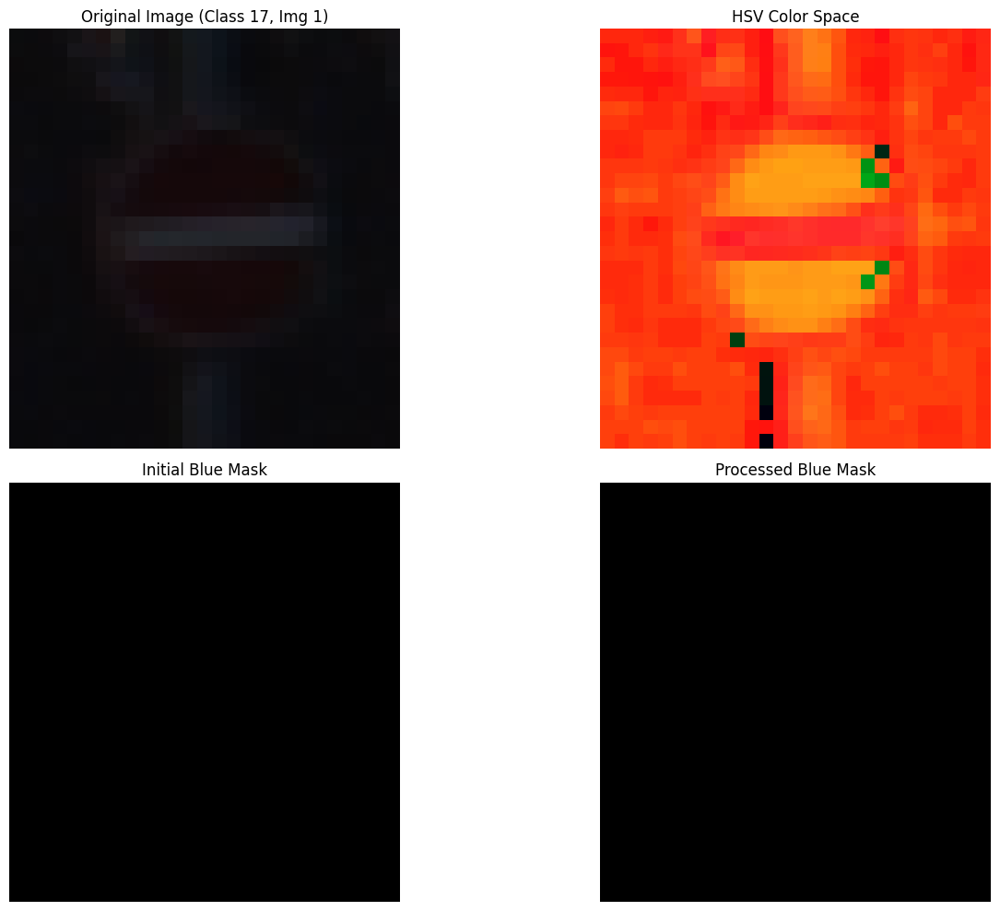

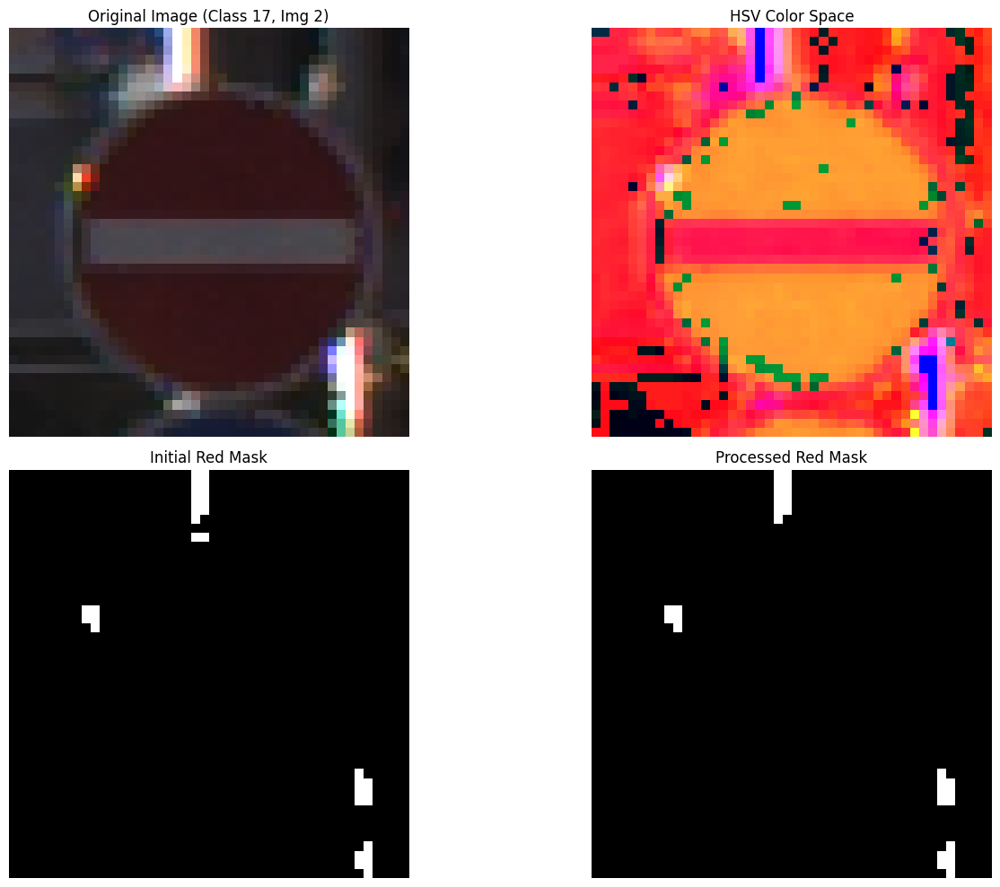

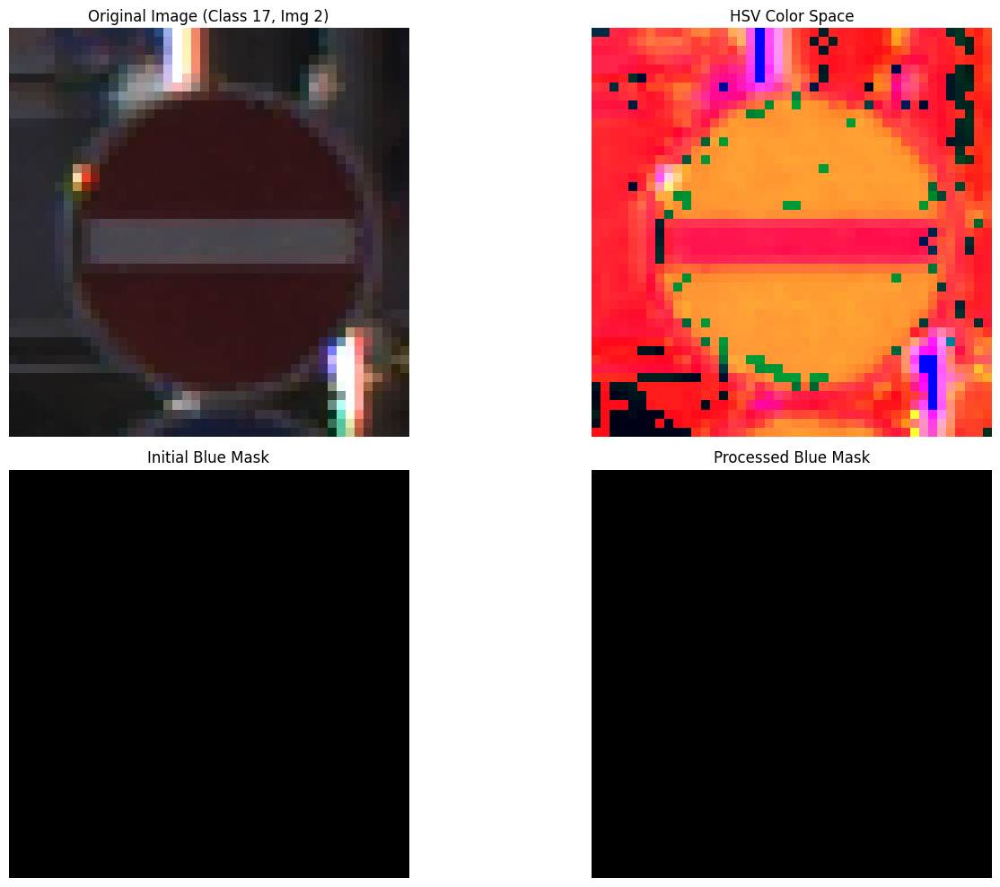

Processing class: 33


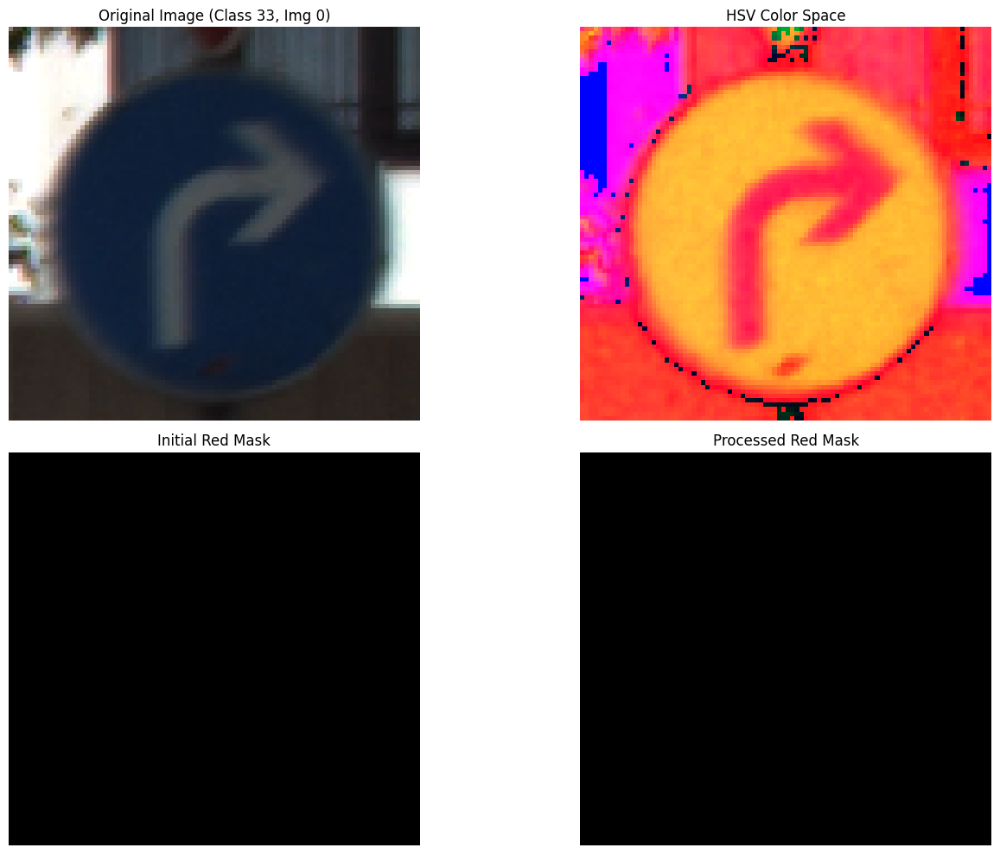

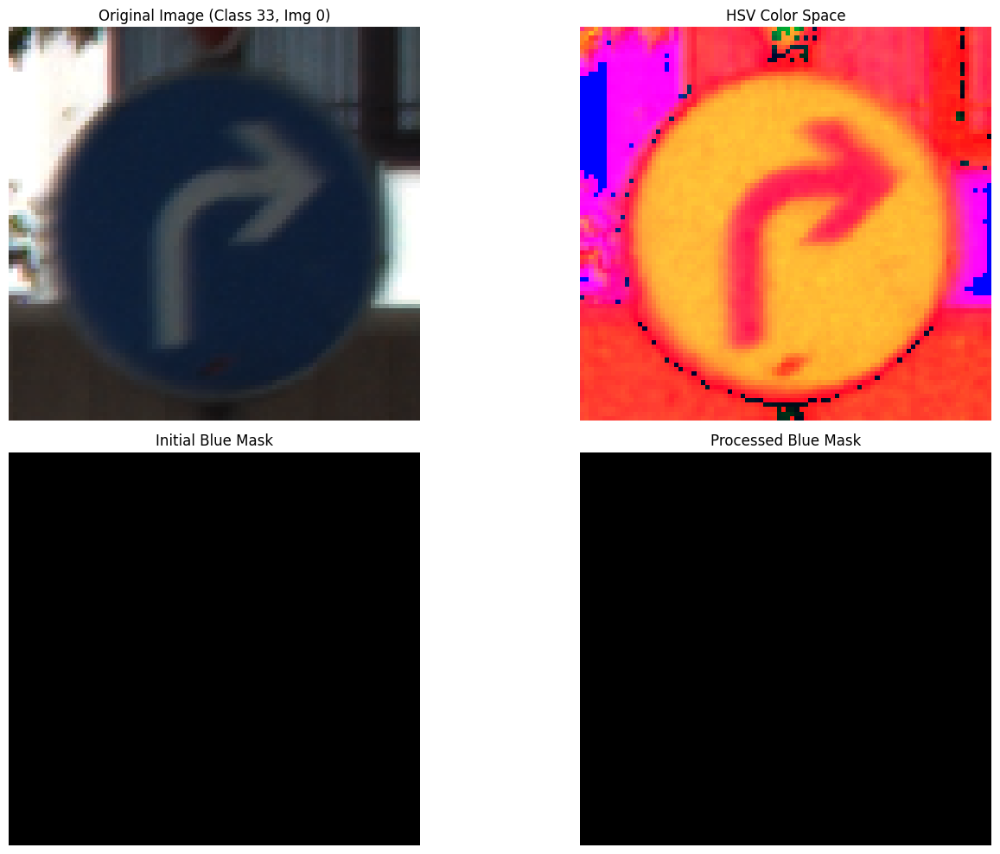

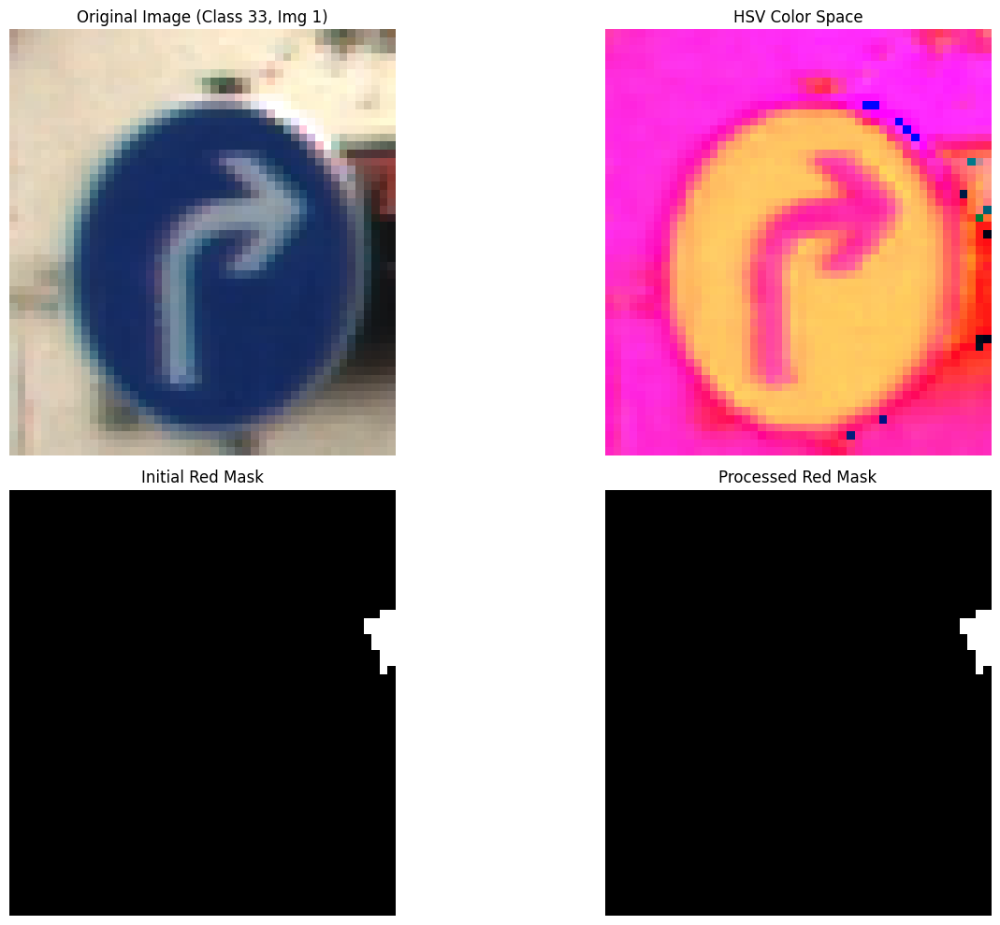

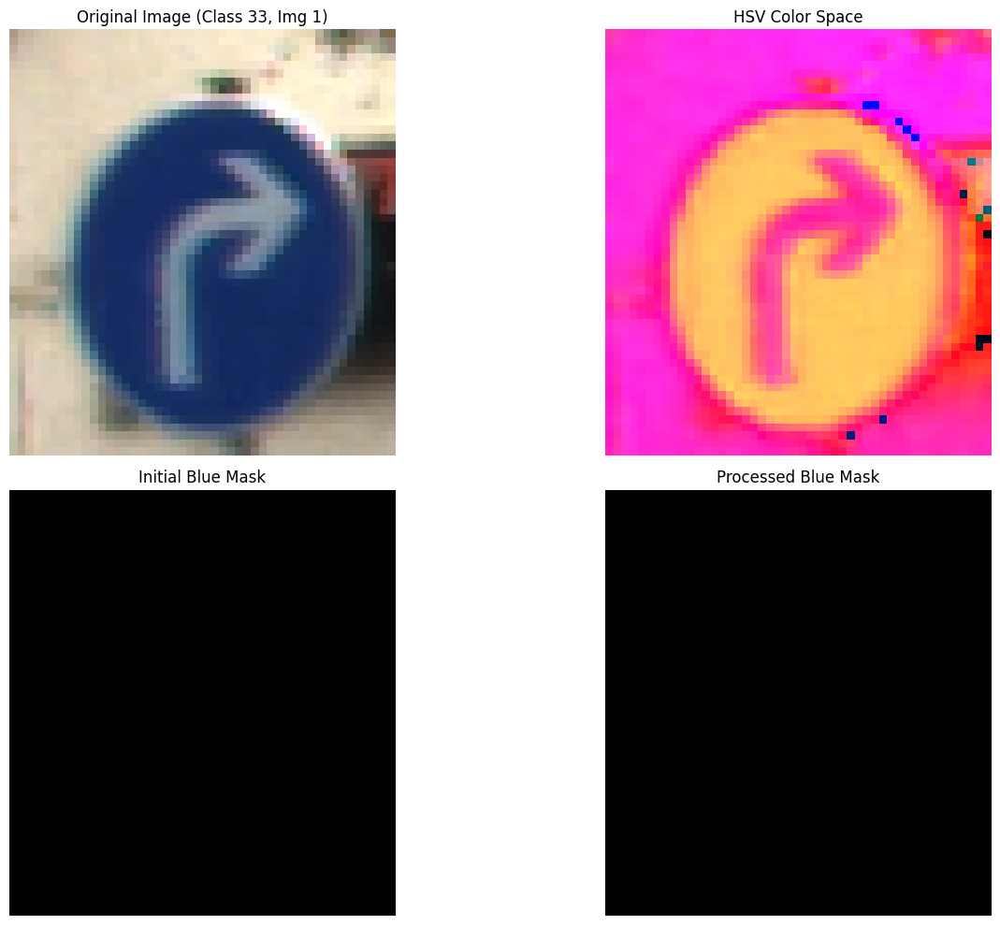

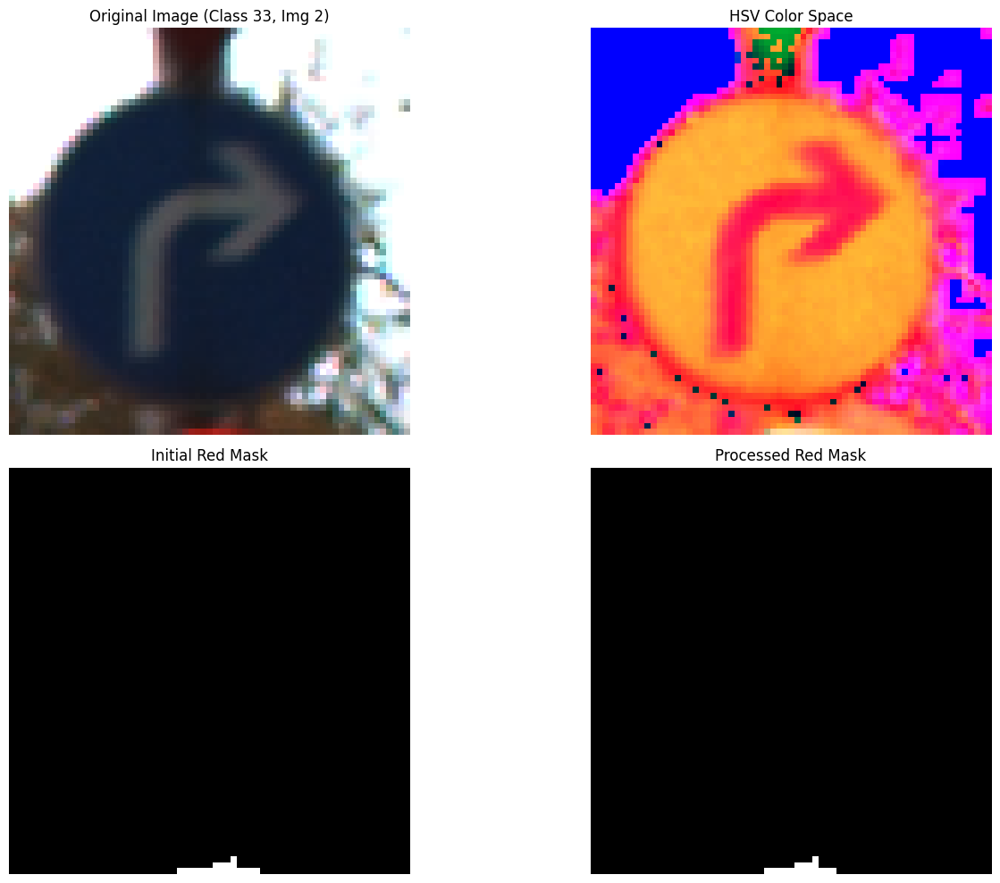

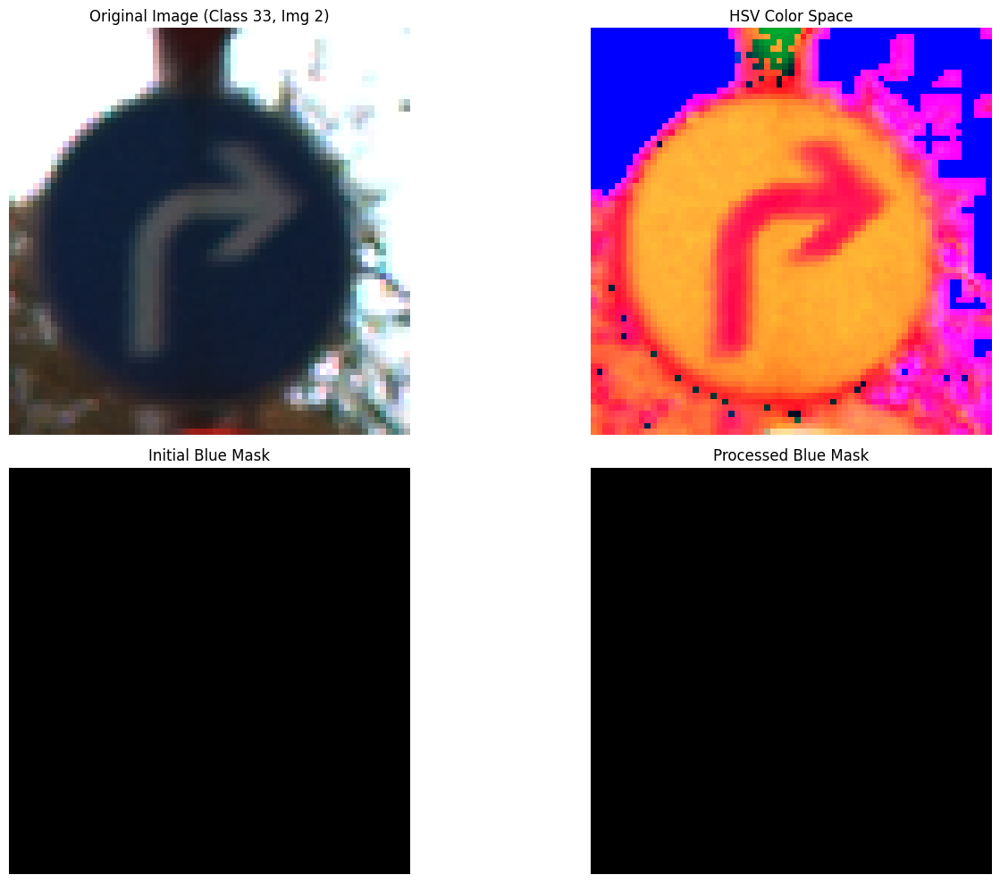

Processing class: 13


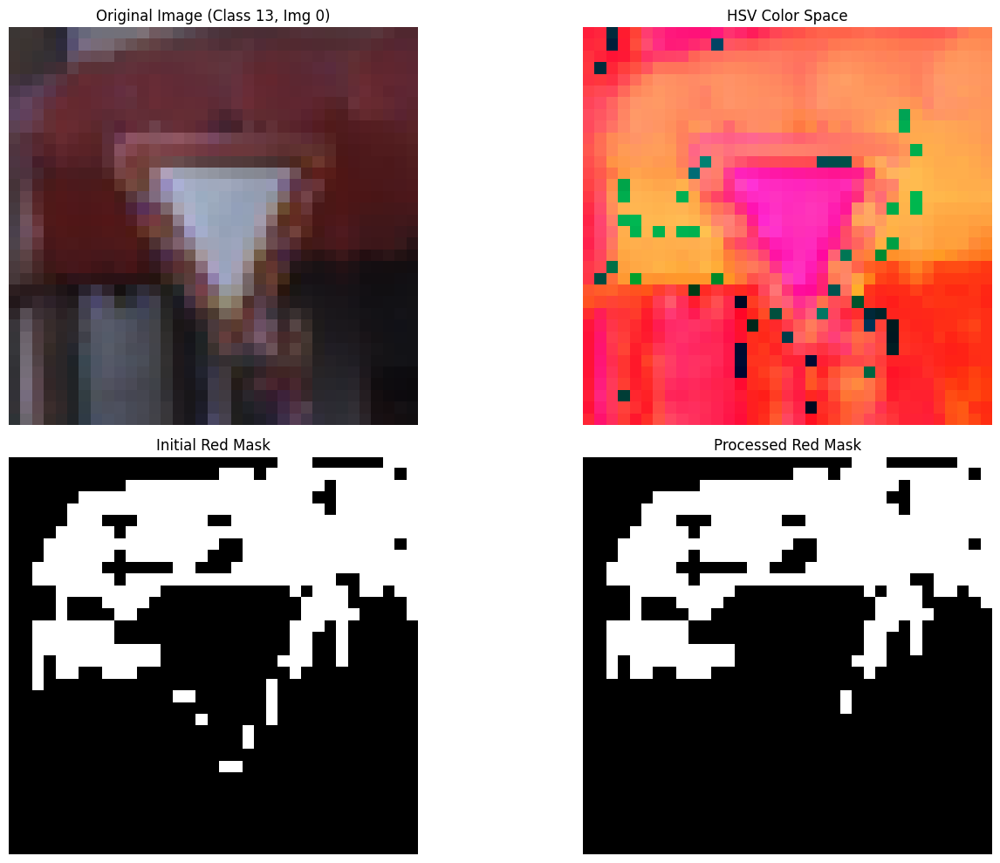

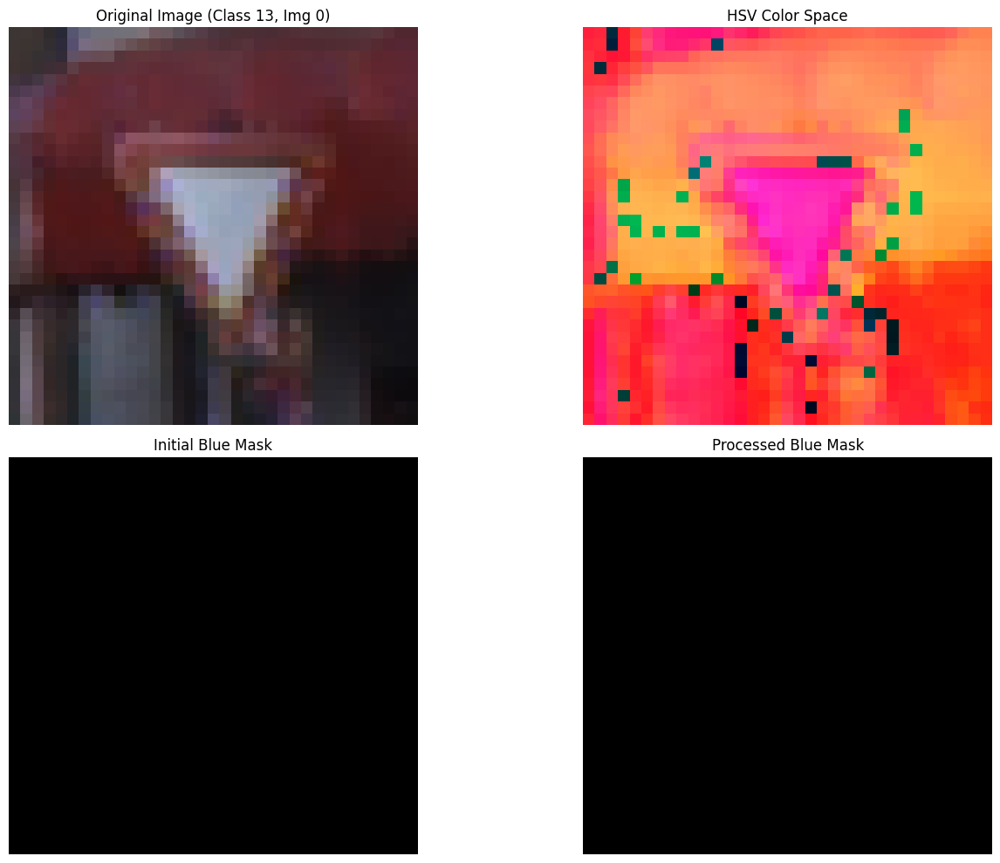

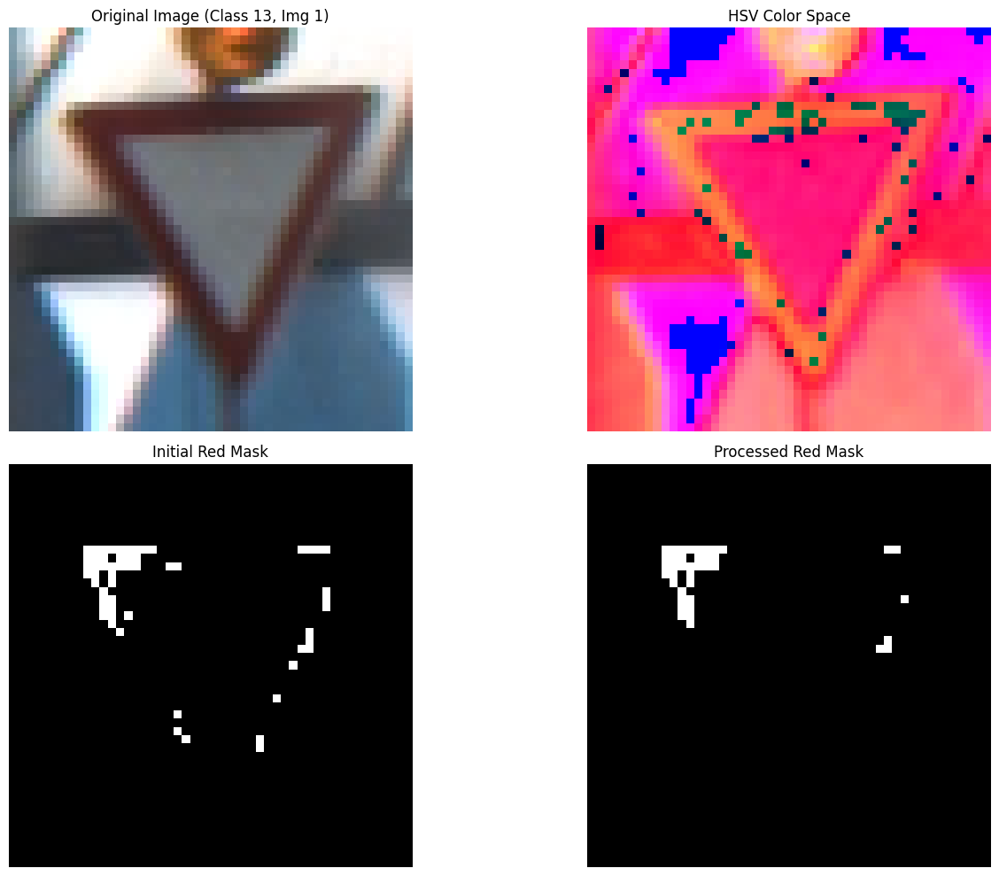

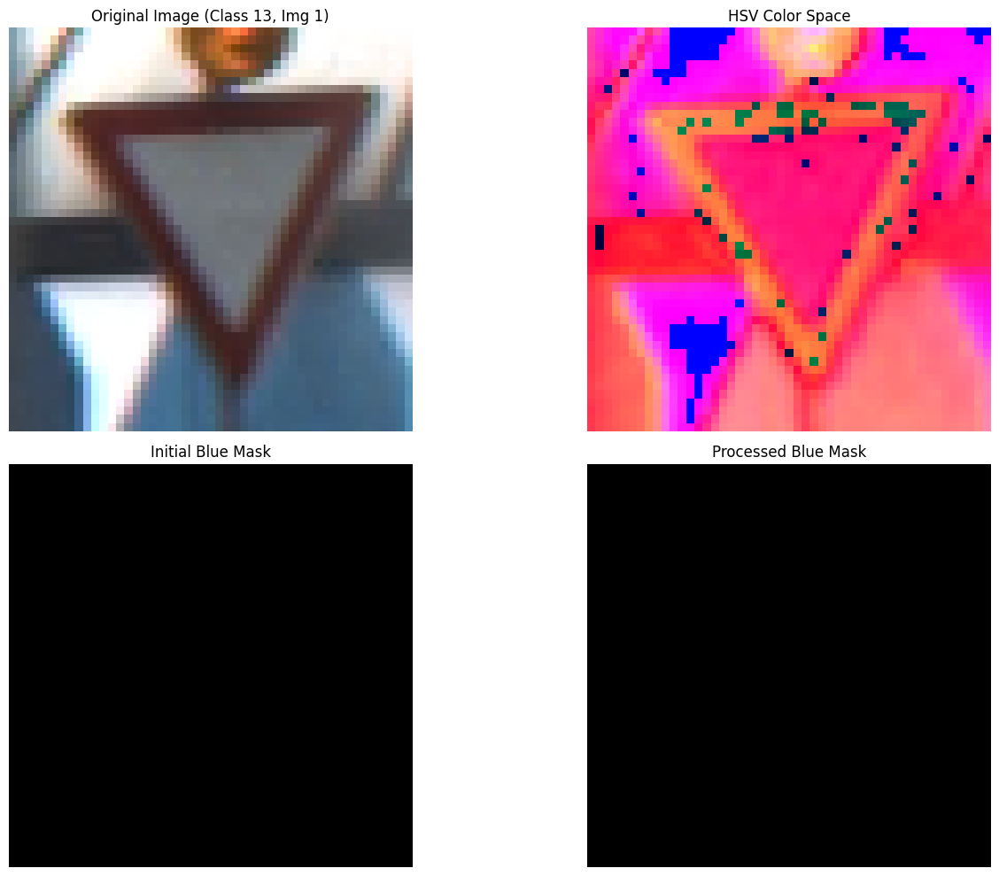

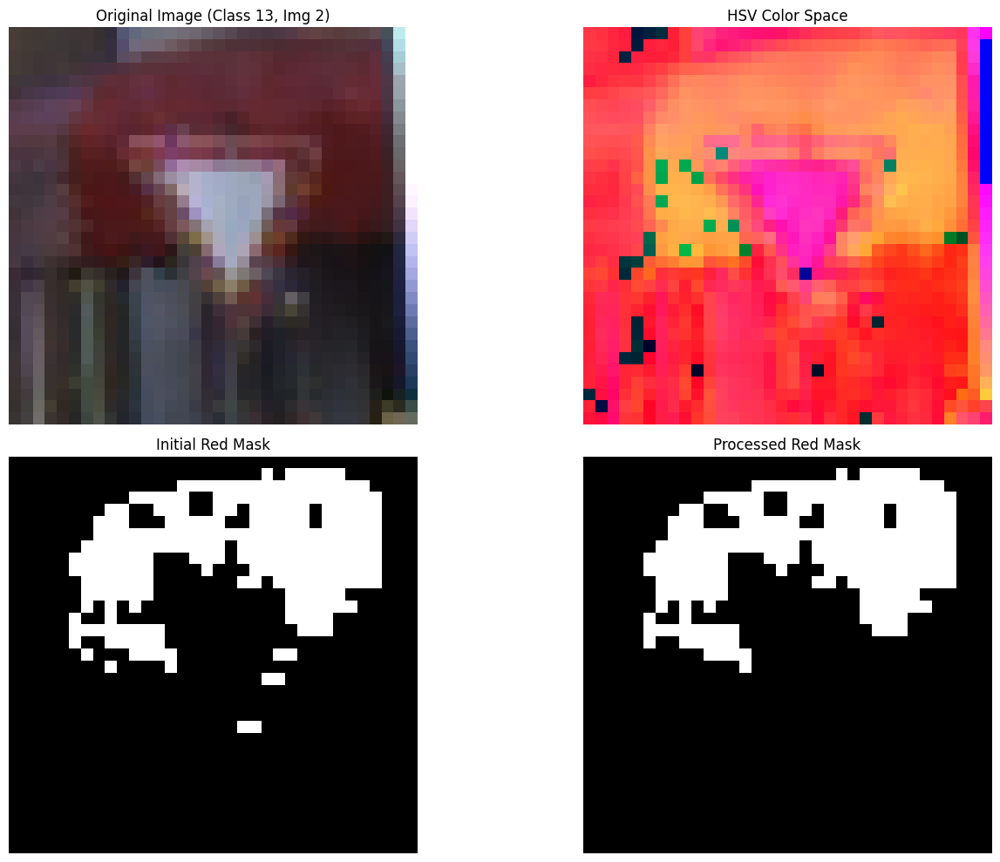

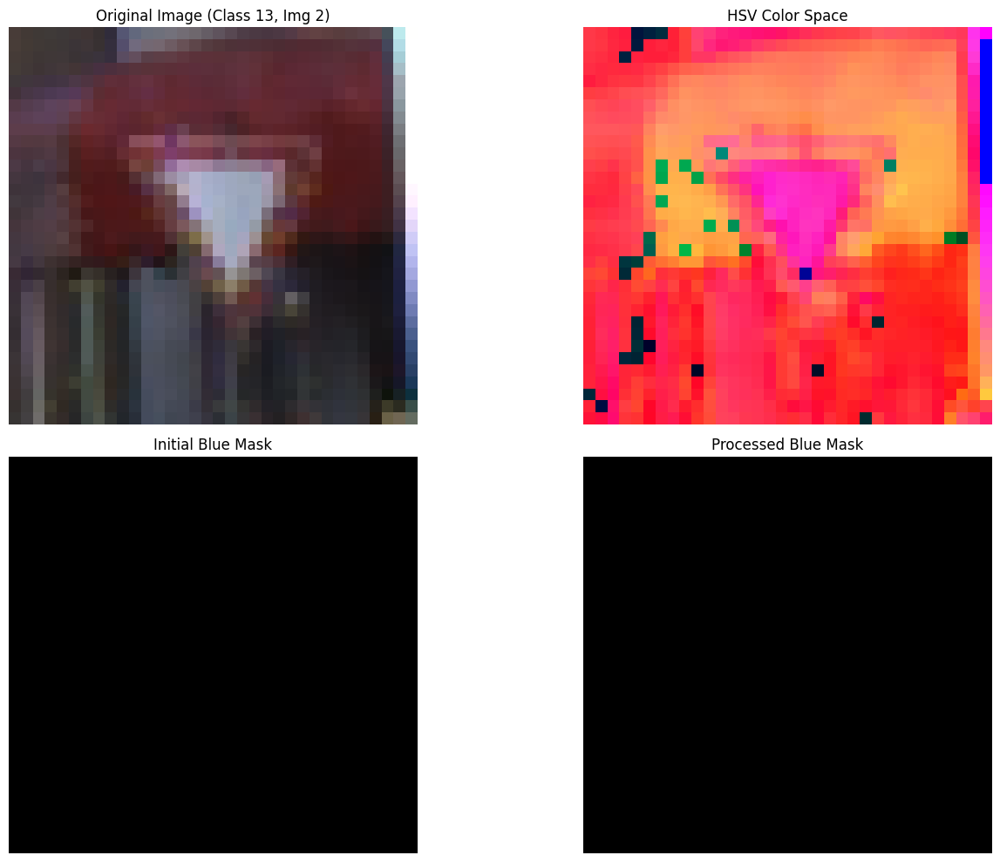

Processing class: 9


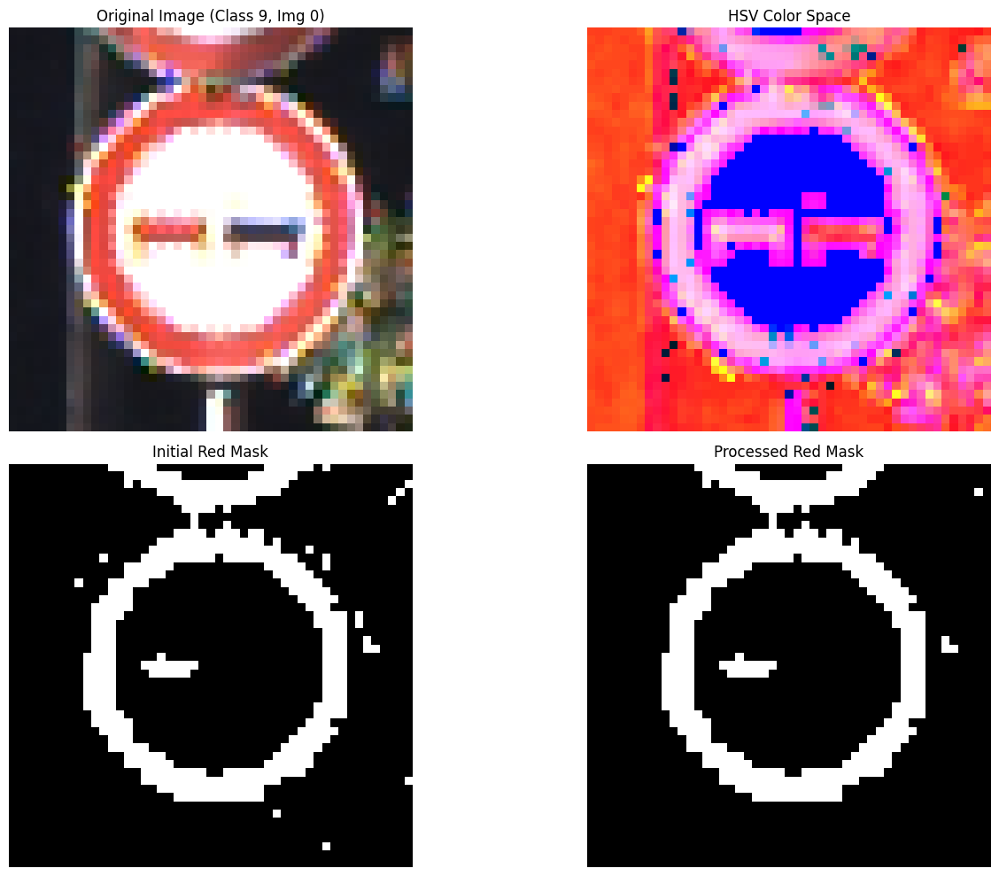

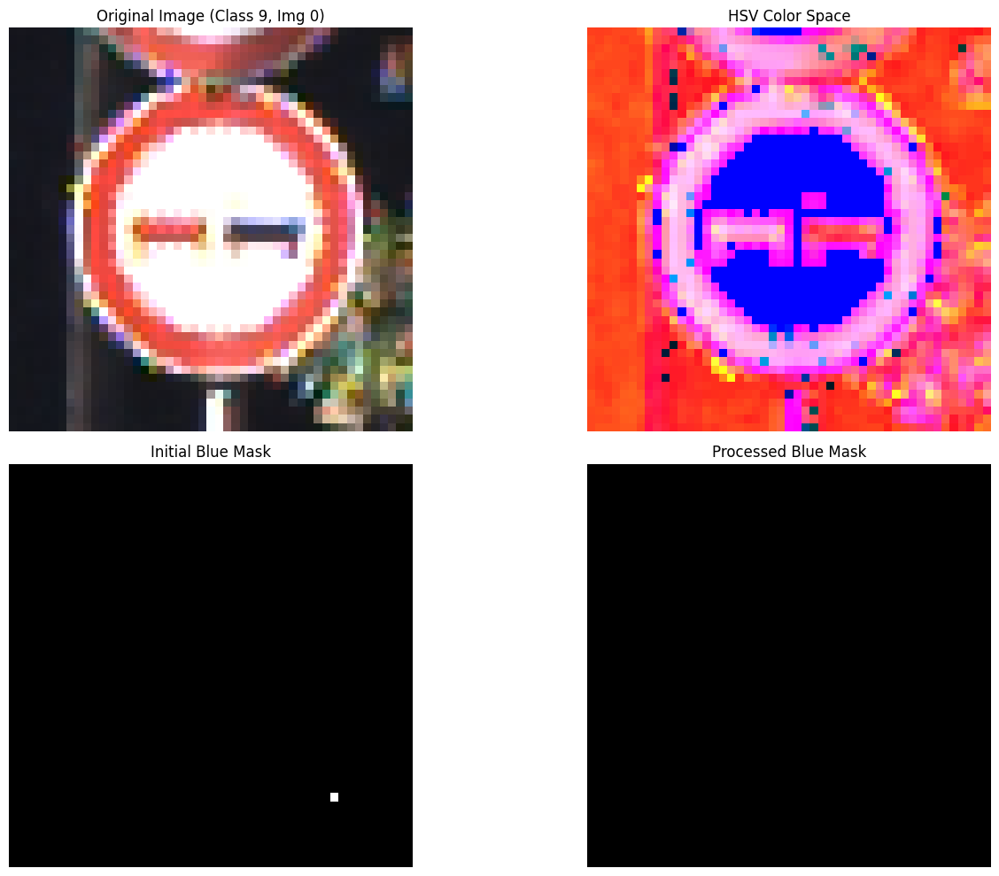

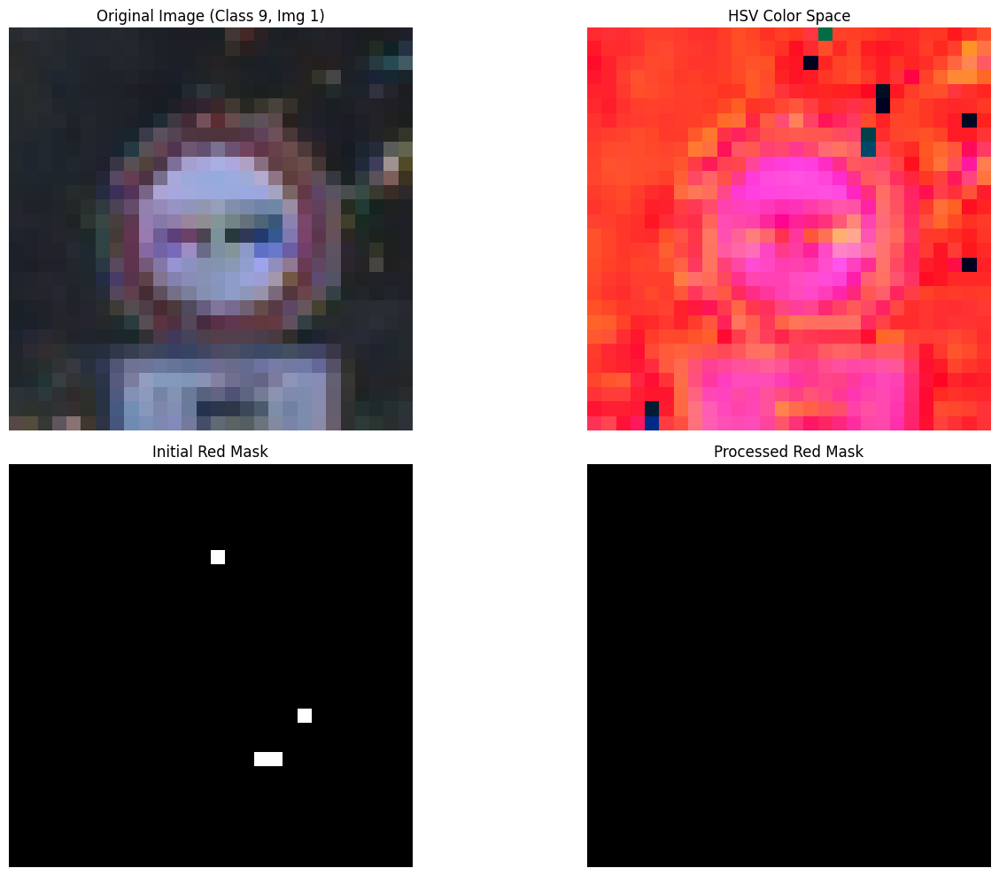

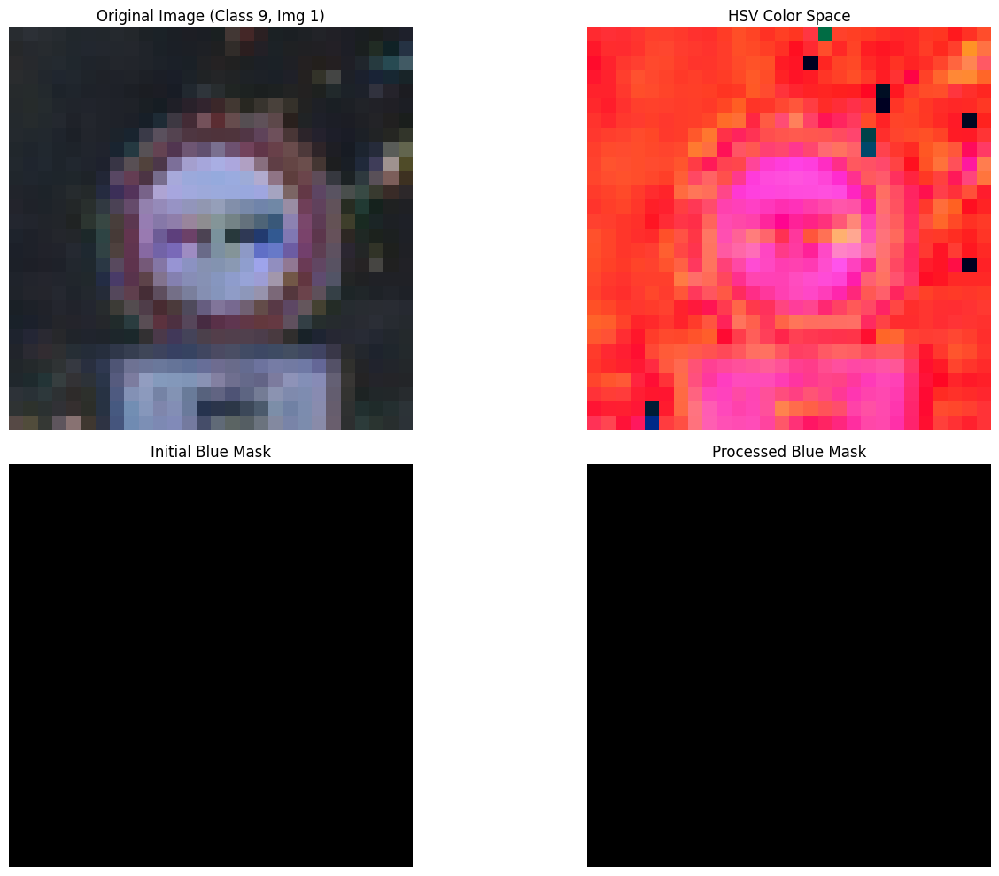

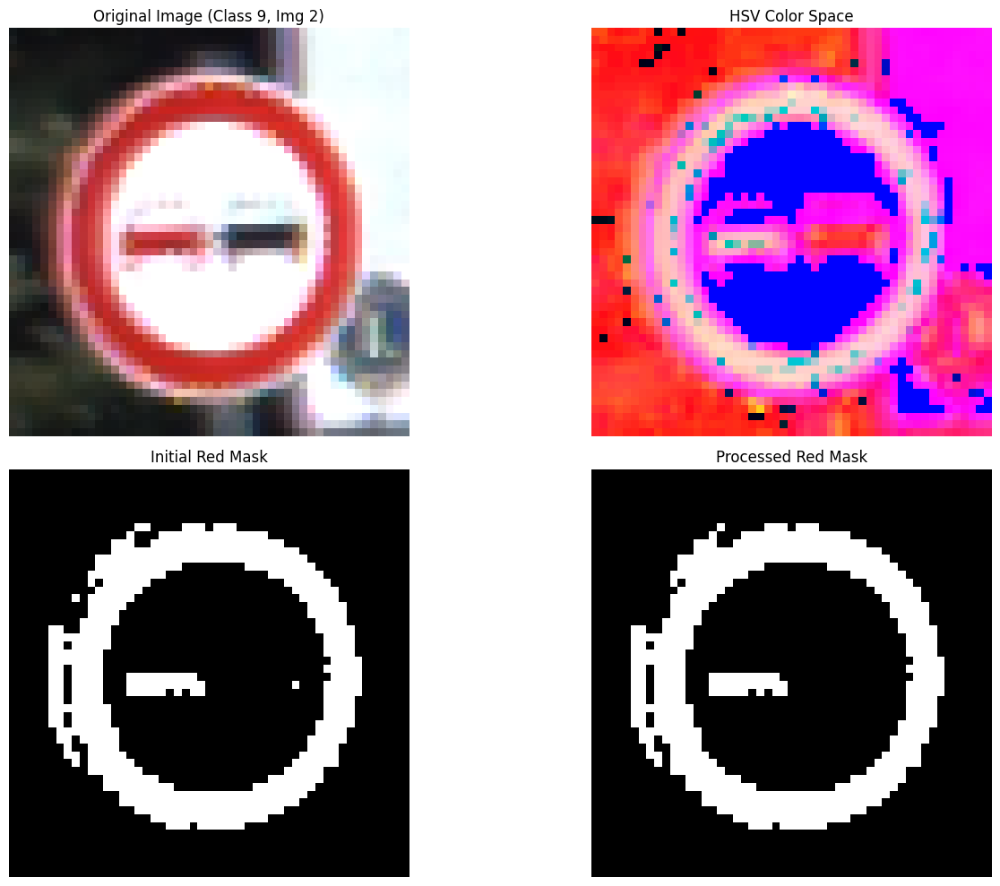

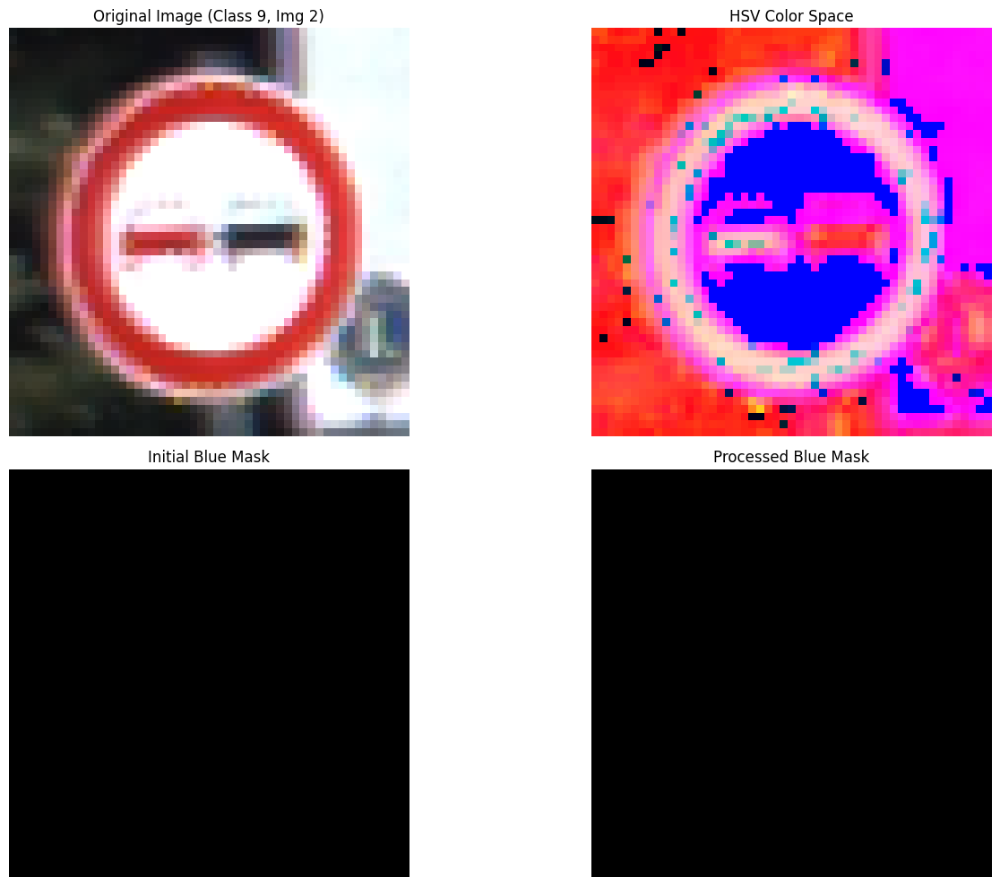

Processing class: 25


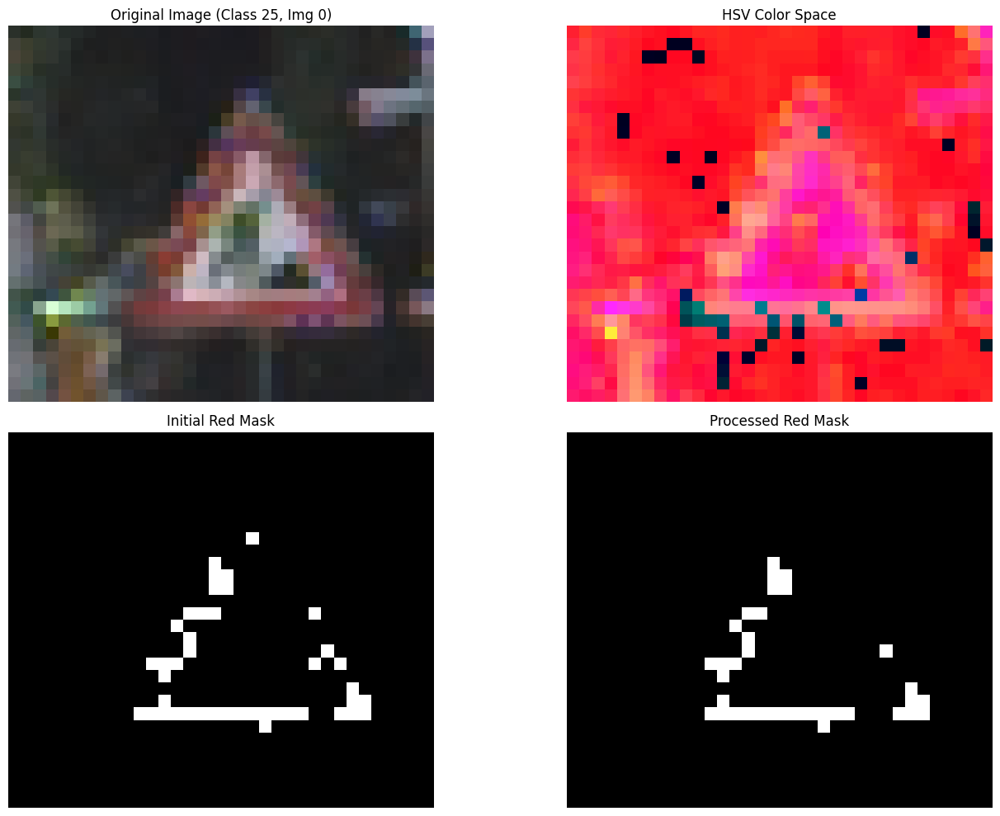

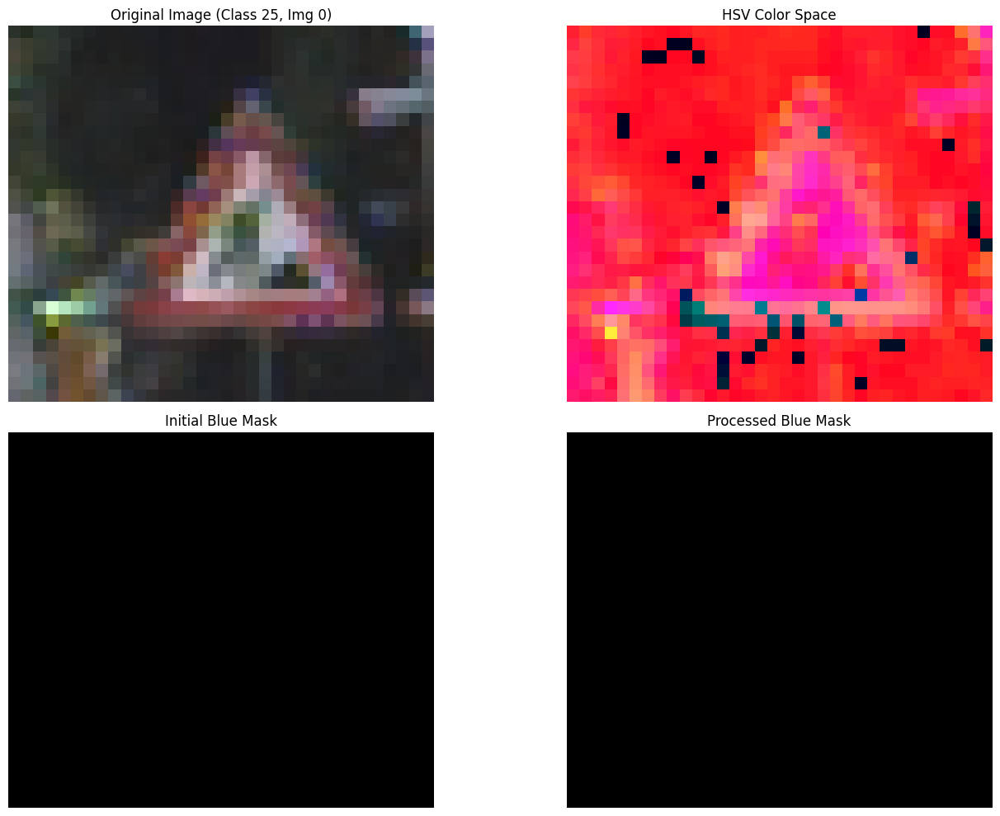

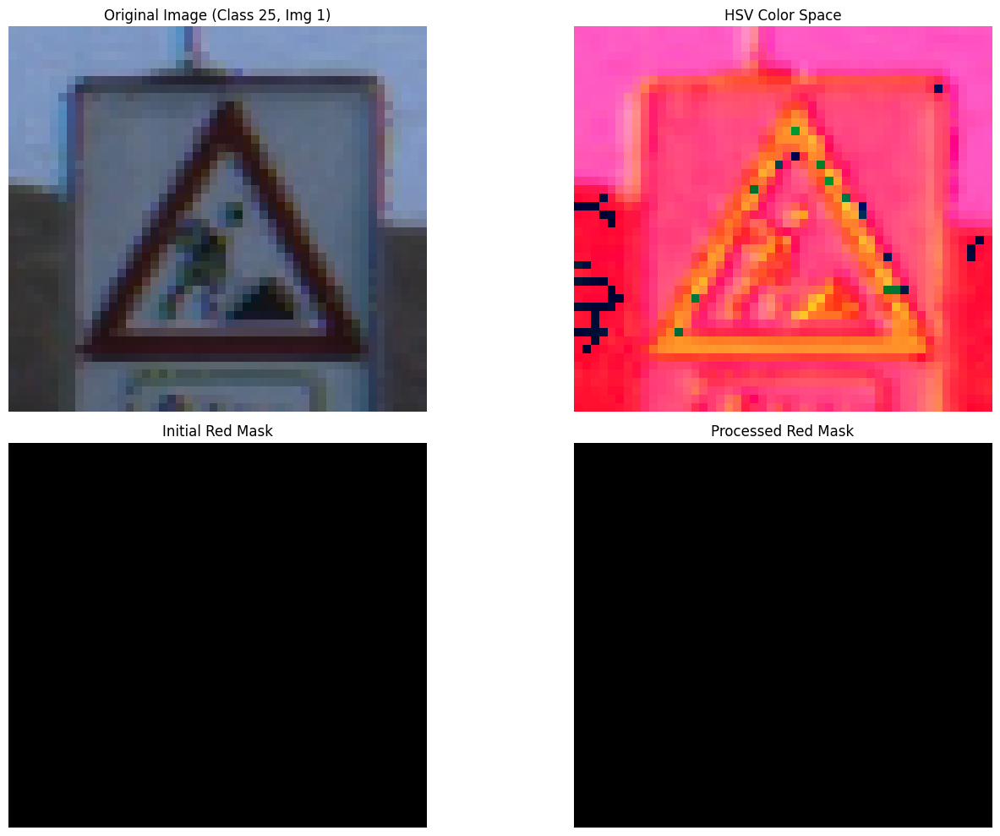

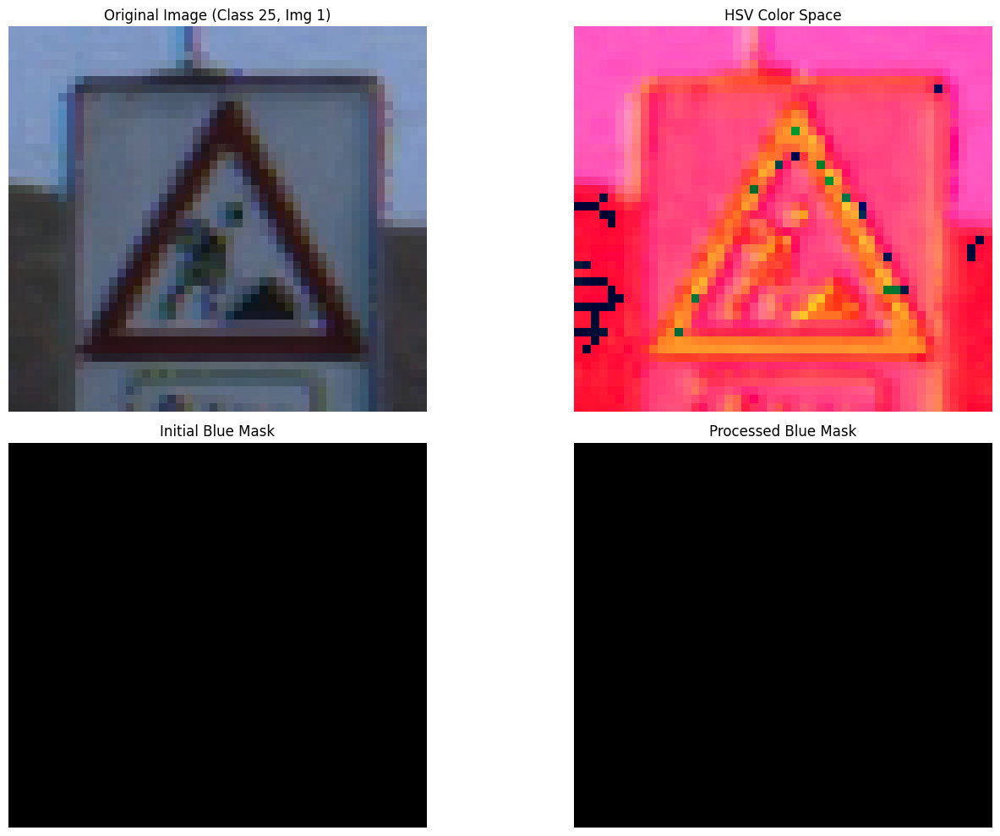

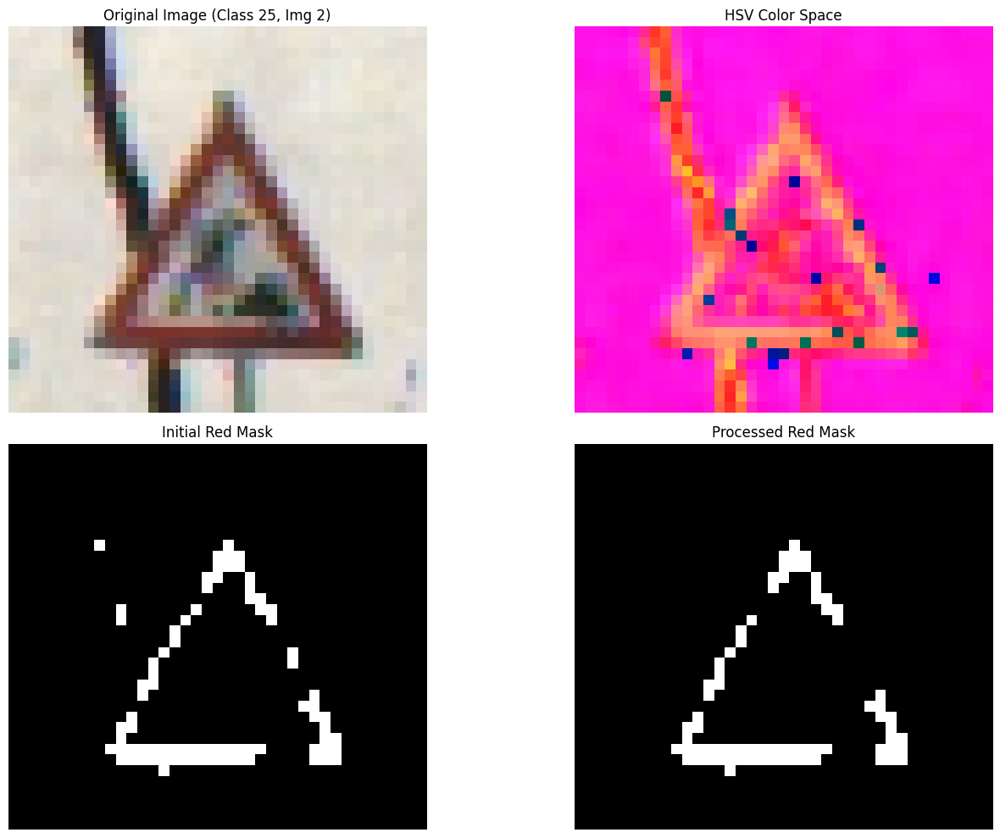

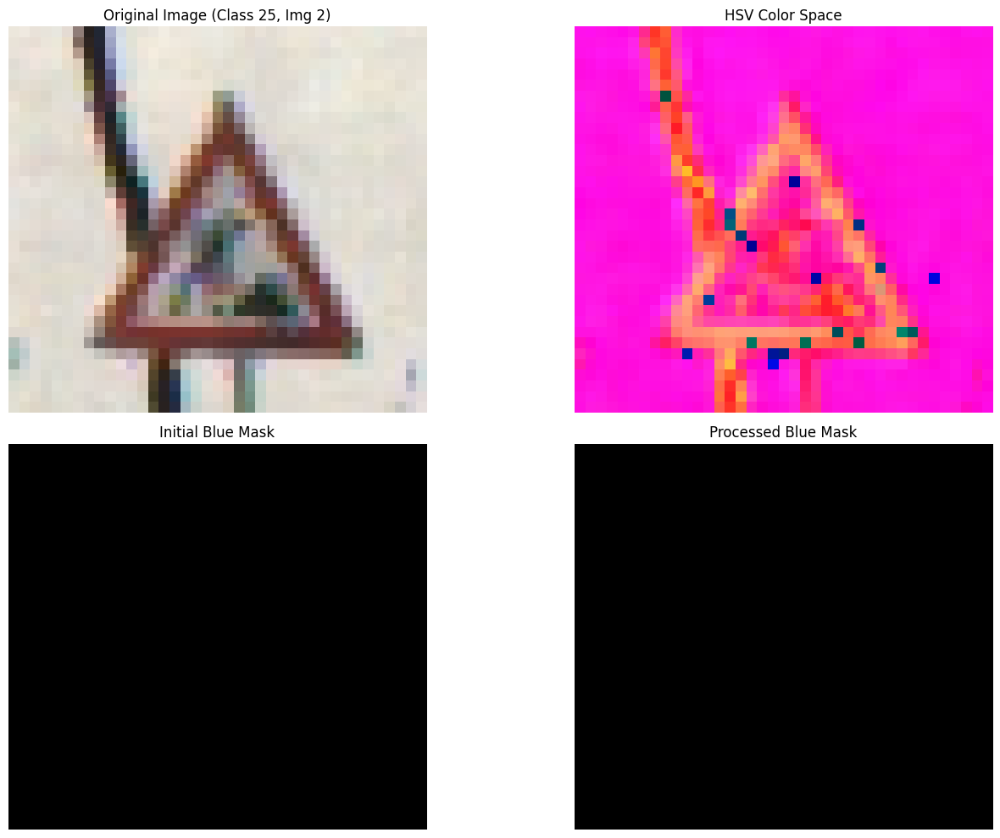

Processing class: 38


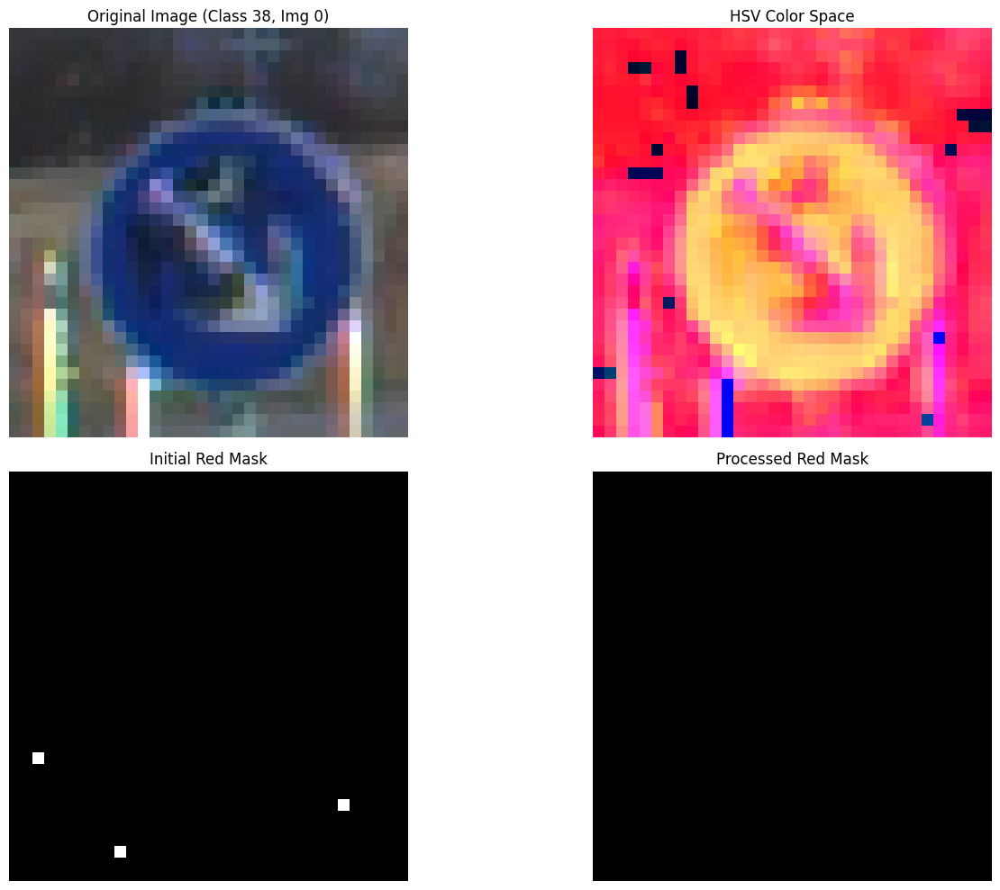

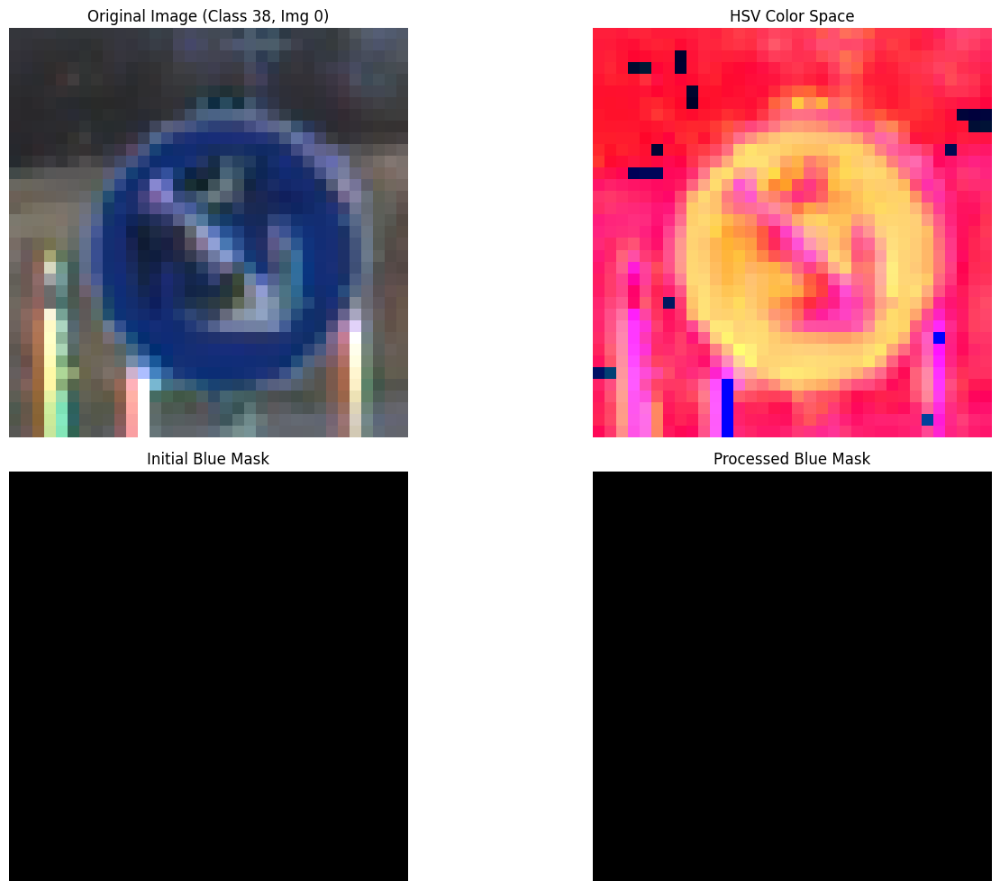

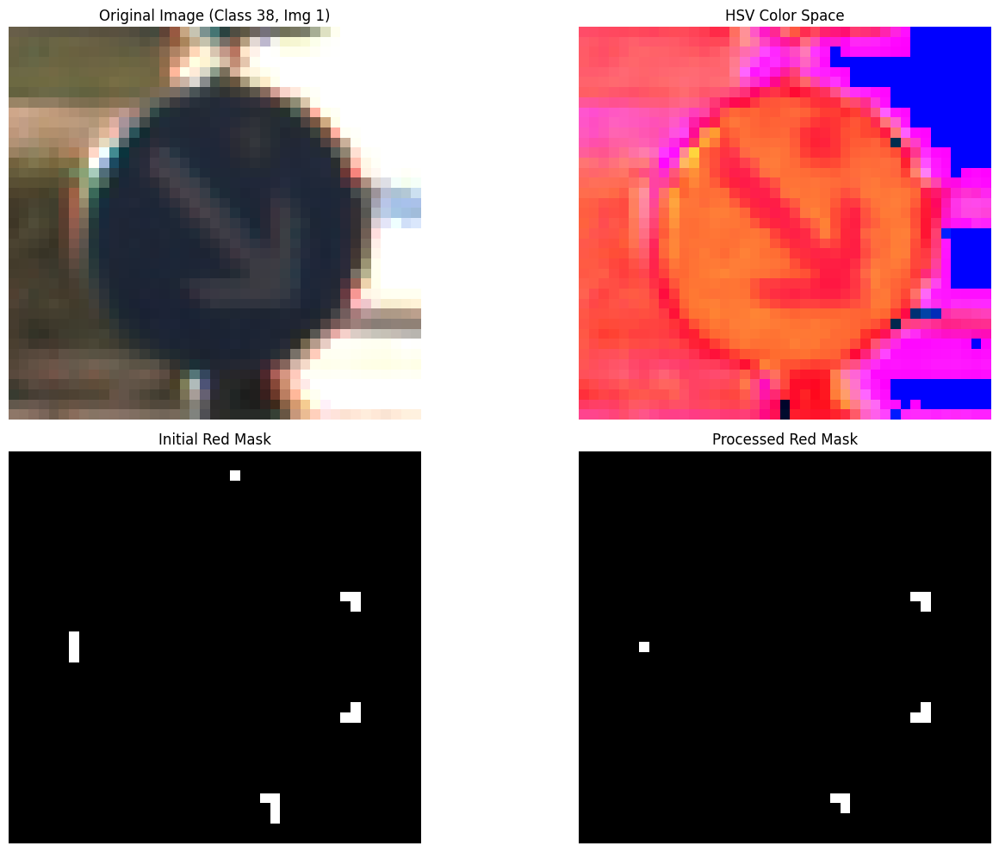

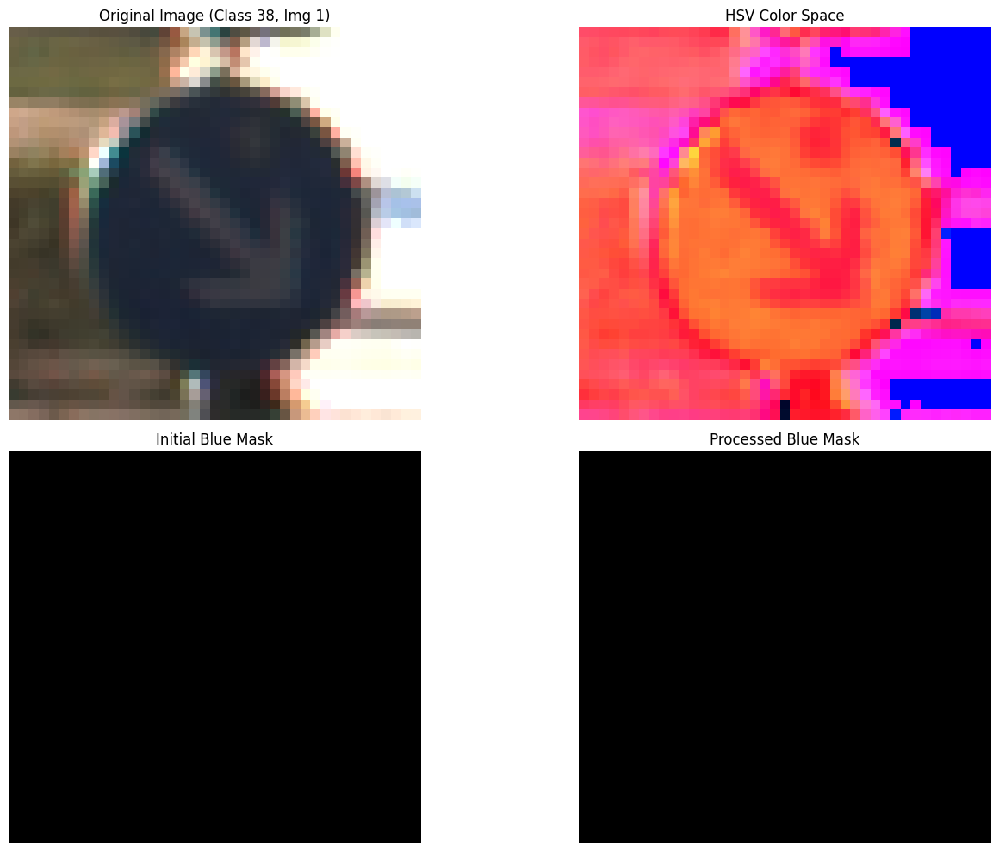

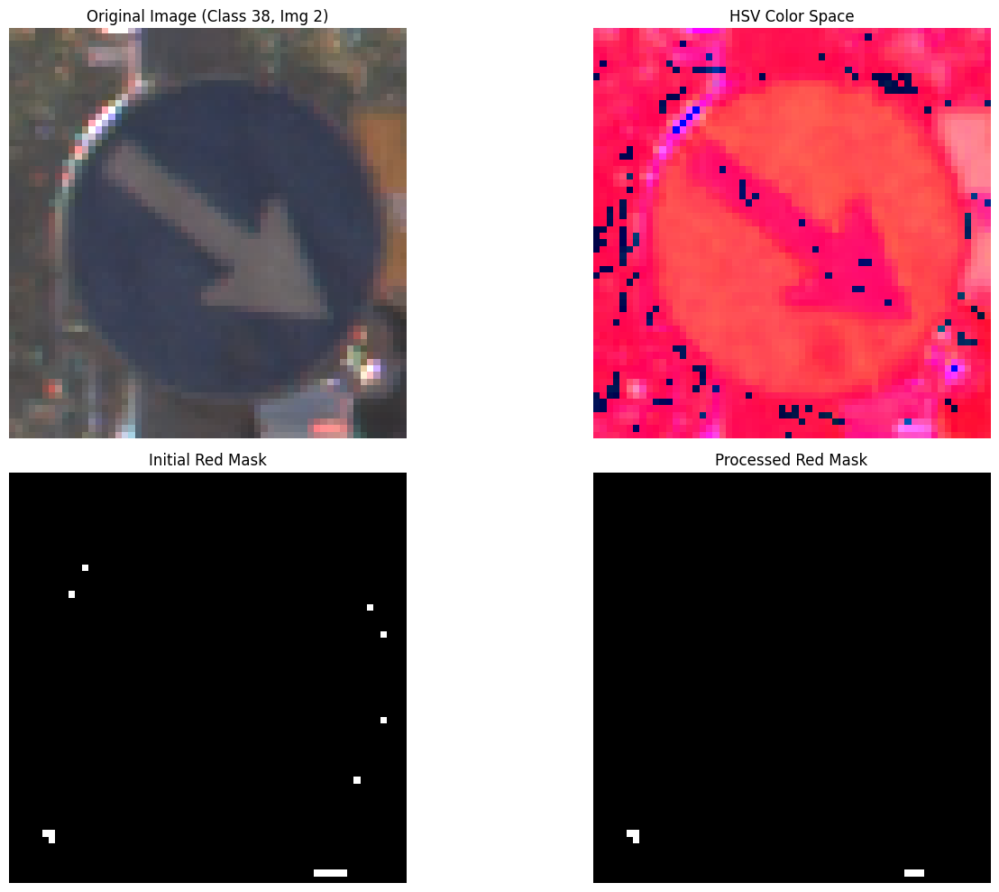

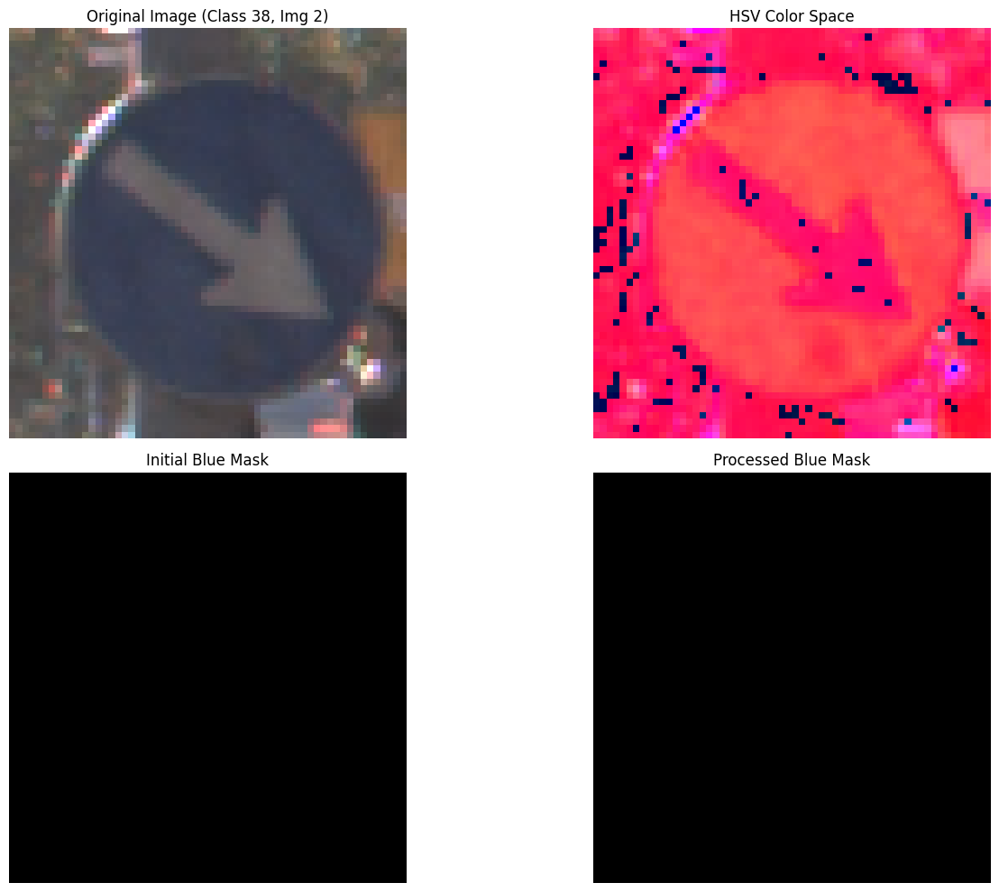

In [17]:
for class_id in class_ids:
    class_images = images_by_class[class_id]
    print(f'Processing class: {class_id}')
    
    for image_index, img in enumerate(class_images[:100]):
        original = np.array(img.convert('RGB'))
        hsv_img = rgb_to_hsv_manual(original)
        
        red_mask = segment_signs(hsv_img, color='red')
        processed_red = post_process_mask(red_mask)
        
        if image_index < 3:
            visualize_segmentation(original, hsv_img, red_mask, processed_red, 'Red', class_id, image_index)
        
        blue_mask = segment_signs(hsv_img, color='blue')
        processed_blue = post_process_mask(blue_mask)
        
        if image_index < 3:
            visualize_segmentation(original, hsv_img, blue_mask, processed_blue, 'Blue', class_id, image_index)


### 🟦 Concept of Canny Edge Detection and Related Functions

The **Canny Edge Detection** algorithm is a multi-step edge detection technique that identifies boundaries of objects in an image. It works by first reducing noise, calculating gradients, performing non-maximum suppression, and finally applying hysteresis thresholding to refine the edges. Below is a breakdown of each part of the process and the code implementation:

1. **2D Convolution (`convolve2d`)**  
   Convolution is the process of applying a filter (or kernel) to an image. In this code, `convolve2d` performs the 2D convolution between an image and a kernel. The kernel is flipped both vertically and horizontally before applying it to the image using a sliding window approach. This process results in a filtered image, which is essential for edge detection (e.g., using Sobel kernels).

2. **Gaussian Blur (`gaussian_blur`)**  
   Gaussian blur is used to reduce noise in the image, which is essential before edge detection. The `gaussian_blur` function creates a 2D Gaussian kernel based on the specified standard deviation (`sigma`), and then applies this kernel to the image using convolution. The Gaussian kernel is designed to blur the image, which helps in removing fine noise that might interfere with edge detection.

3. **Sobel Gradient (`sobel_gradient`)**  
   The Sobel operator computes the gradient magnitude and direction in both the x and y directions. The `sobel_gradient` function applies the Sobel kernels (`sobel_x` and `sobel_y`) to the image using convolution. The gradient magnitude represents the strength of the edges, while the direction indicates the angle of the edge.

4. **Non-Maximum Suppression (`non_max_suppression`)**  
   After calculating the gradient magnitude and direction, non-maximum suppression is applied to thin out the edges. This function checks the neighbors along the edge direction and retains only the pixels that are local maxima. This step helps to preserve thin, sharp edges and remove non-relevant pixels.

5. **Hysteresis Thresholding (`hysteresis_thresholding`)**  
   This step involves applying two thresholds: a low threshold and a high threshold. Pixels with a gradient magnitude above the high threshold are considered strong edges, while those between the low and high thresholds are considered weak edges. The weak edges are only retained if they are connected to strong edges. This helps to preserve actual edges and remove noise.

6. **Canny Edge Detector (`canny_edge_detector`)**  
   The `canny_edge_detector` function combines all the previous steps into a single pipeline:
   - The image is first blurred using Gaussian blur.
   - The gradient magnitude and direction are calculated using Sobel operators.
   - Non-maximum suppression is applied to thin the edges.
   - Hysteresis thresholding is performed to finalize the edge detection by keeping strong edges and linking weak edges that are connected to strong ones.

### 🟦 Use Case  
Canny edge detection is widely used in image processing tasks where detecting boundaries is crucial, such as object recognition, image segmentation, and computer vision applications. It provides a clear and thin representation of edges, making it ideal for tasks requiring precise boundary detection in images.


In [18]:
def convolve2d(image, kernel):
    kh, kw = kernel.shape
    pad_h, pad_w = kh//2, kw//2
    
    padded_image = np.pad(image, ((pad_h, pad_h), (pad_w, pad_w)), mode='constant')
    h, w = image.shape
    output = np.zeros((h, w))
    
    kernel_flipped = np.flipud(np.fliplr(kernel))
    
    for i in range(h):
        for j in range(w):
            region = padded_image[i:i+kh, j:j+kw]
            output[i, j] = np.sum(region * kernel_flipped)
    
    return output

def gaussian_blur(image, sigma):
    size = int(6*sigma) + 1
    if size % 2 == 0:
        size += 1

    x = np.arange(-(size//2), size//2 + 1)
    kernel_1d = np.exp(-(x**2)/(2*sigma**2))
    kernel_1d /= kernel_1d.sum()

    kernel_2d = np.outer(kernel_1d, kernel_1d)

    blurred = convolve2d(image, kernel_2d)
    return blurred

def sobel_gradient(image):
    sobel_x = np.array([[-1, 0, 1],
                        [-2, 0, 2],
                        [-1, 0, 1]])
    
    sobel_y = np.array([[-1, -2, -1],
                        [ 0,  0,  0],
                        [ 1,  2,  1]])
    
    grad_x = convolve2d(image, sobel_x)
    grad_y = convolve2d(image, sobel_y)
    
    magnitude = np.hypot(grad_x, grad_y)
    direction = np.rad2deg(np.arctan2(grad_y, grad_x)) % 180
    
    return magnitude, direction

def non_max_suppression(magnitude, direction):
    suppressed = np.zeros_like(magnitude)
    height, width = magnitude.shape
    
    direction = ((direction + 22.5) // 45) * 45 % 180

    for i in range(1, height-1):
        for j in range(1, width-1):
            angle = direction[i, j]
            mag = magnitude[i, j]

            if angle == 0:
                neighbors = [magnitude[i, j-1], magnitude[i, j+1]]
            elif angle == 45:
                neighbors = [magnitude[i-1, j+1], magnitude[i+1, j-1]]
            elif angle == 90:
                neighbors = [magnitude[i-1, j], magnitude[i+1, j]]
            elif angle == 135:
                neighbors = [magnitude[i-1, j-1], magnitude[i+1, j+1]]
            else:
                neighbors = [0, 0]

            if mag >= max(neighbors):
                suppressed[i, j] = mag

    return suppressed

def hysteresis_thresholding(image, low, high):
    height, width = image.shape
    strong = (image >= high)
    weak = (image >= low) & (image < high)

    edges = np.zeros_like(image, dtype=np.uint8)
    edges[strong] = 255

    neighbors = [(-1,-1), (-1,0), (-1,1),
                 (0,-1),          (0,1),
                 (1,-1),  (1,0),  (1,1)]

    strong_y, strong_x = np.where(strong)

    for y, x in zip(strong_y, strong_x):
        for dy, dx in neighbors:
            ny, nx = y + dy, x + dx
            if 0 <= ny < height and 0 <= nx < width:
                if weak[ny, nx] and edges[ny, nx] != 255:
                    edges[ny, nx] = 255
                    strong_y = np.append(strong_y, ny)
                    strong_x = np.append(strong_x, nx)

    return edges

def canny_edge_detector(image, low_threshold=50, high_threshold=100, sigma=1.0):
    blurred = gaussian_blur(image, sigma)
    magnitude, direction = sobel_gradient(blurred)
    suppressed = non_max_suppression(magnitude, direction)
    edges = hysteresis_thresholding(suppressed, low_threshold, high_threshold)
    return edges


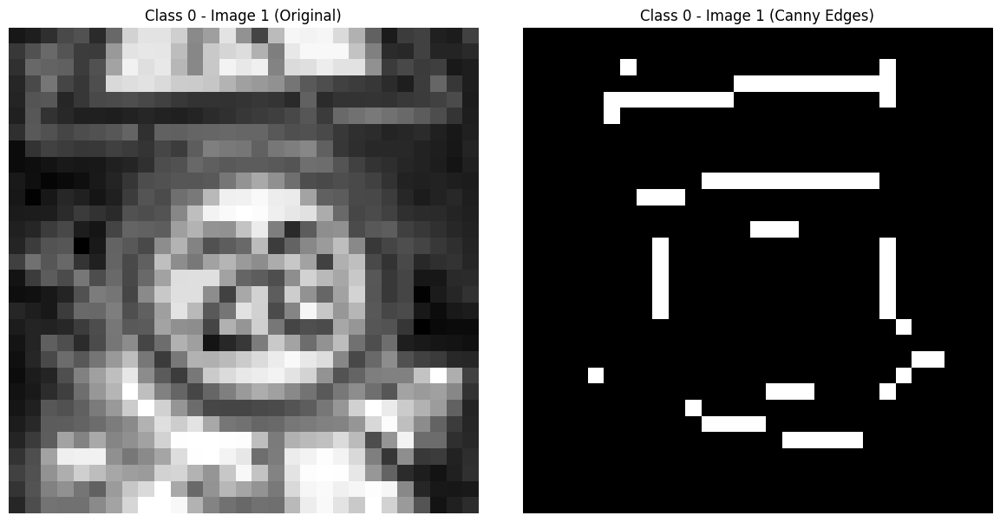

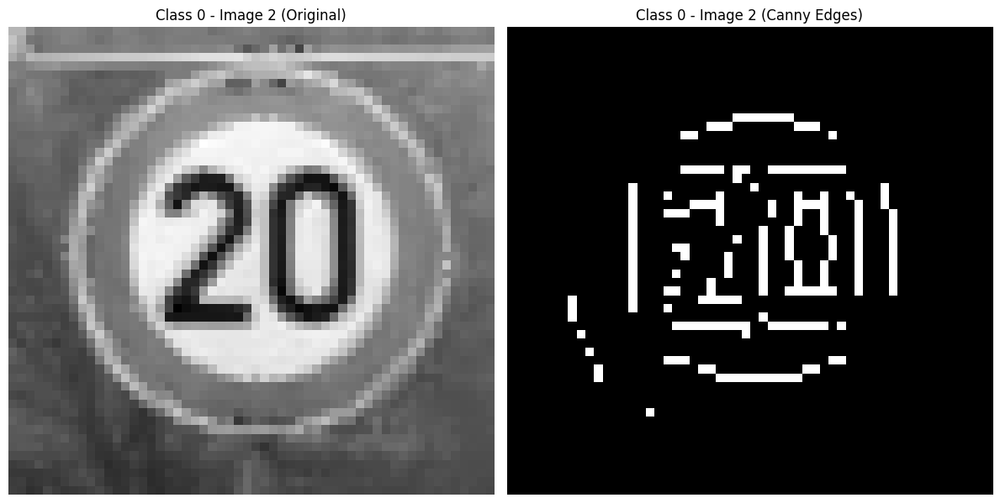

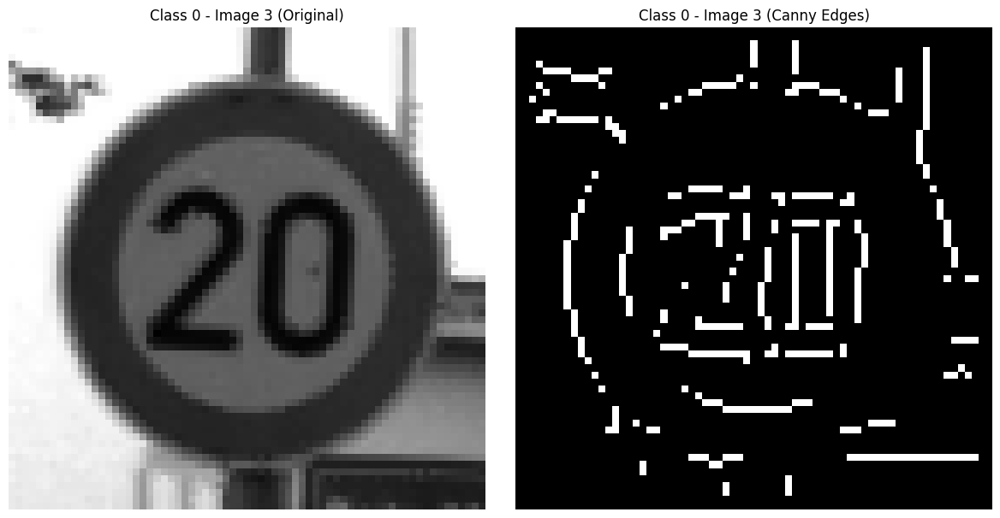

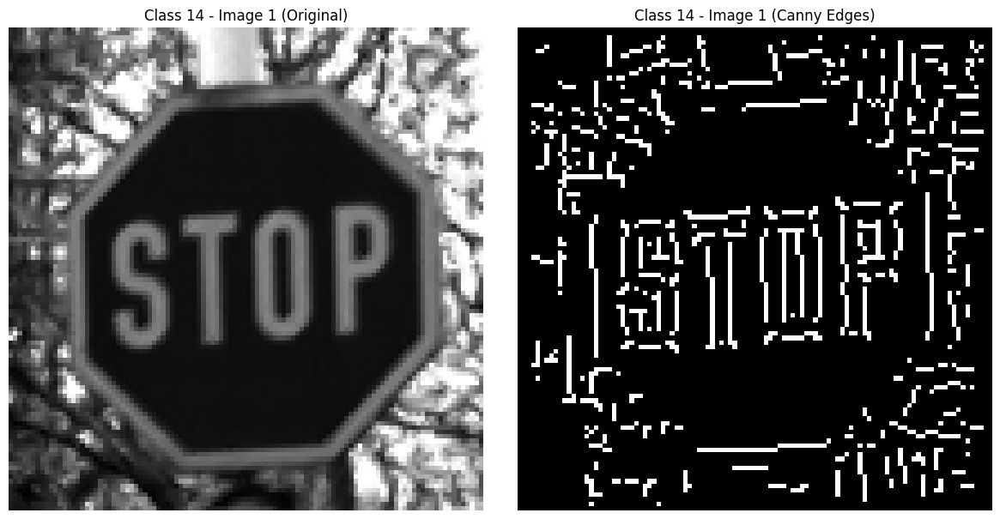

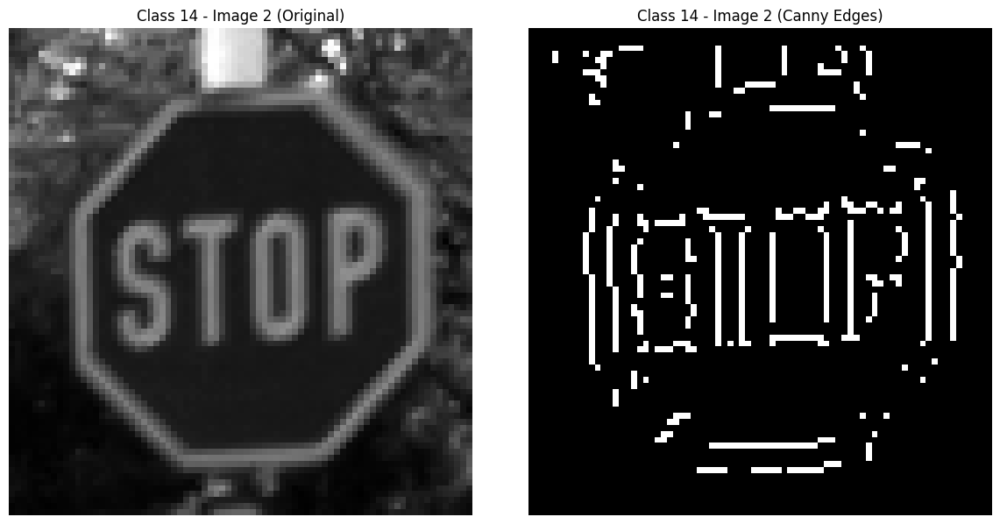

...

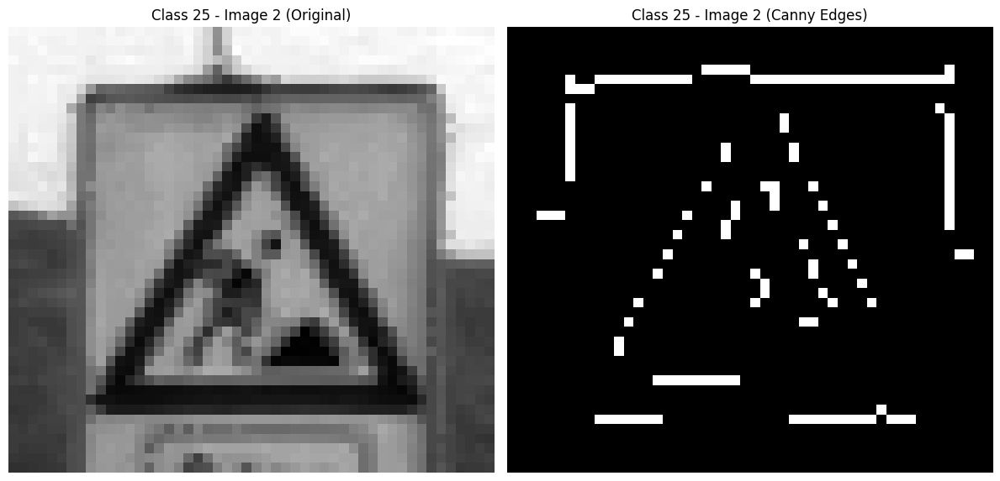

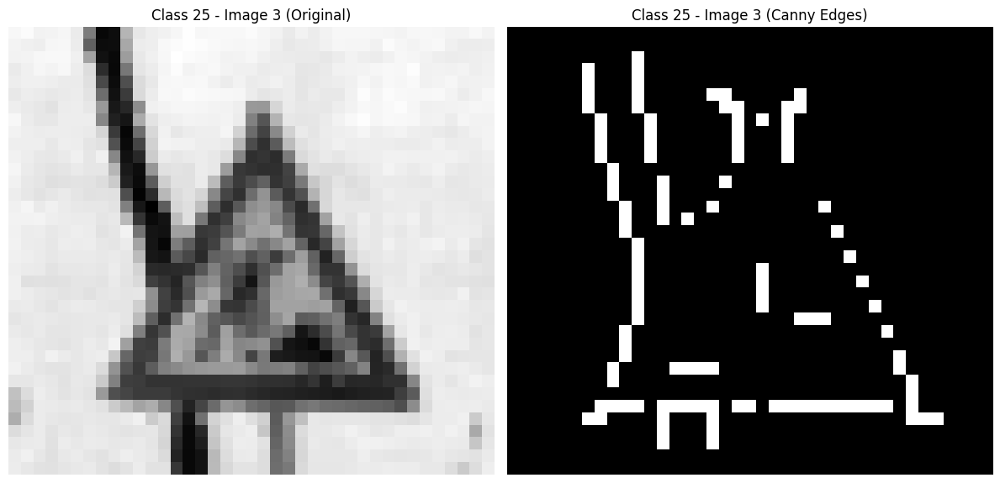

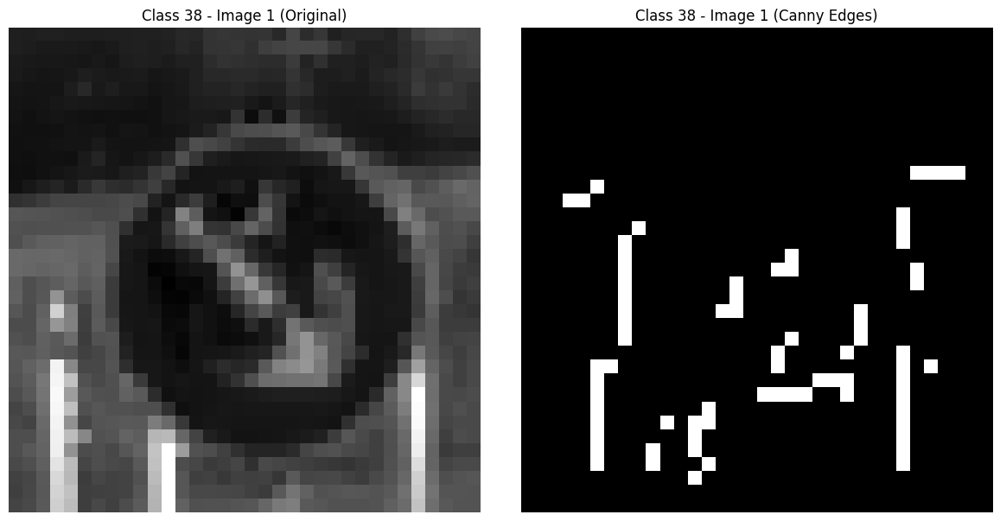

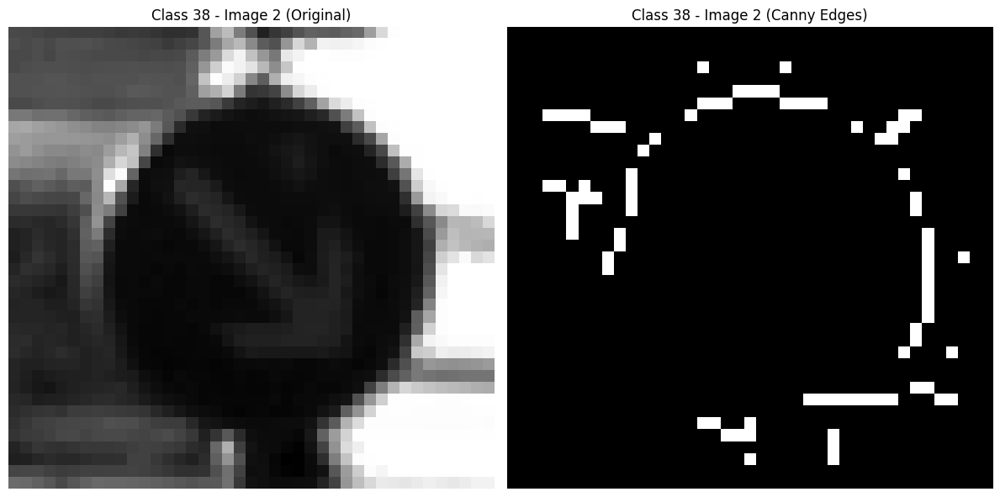

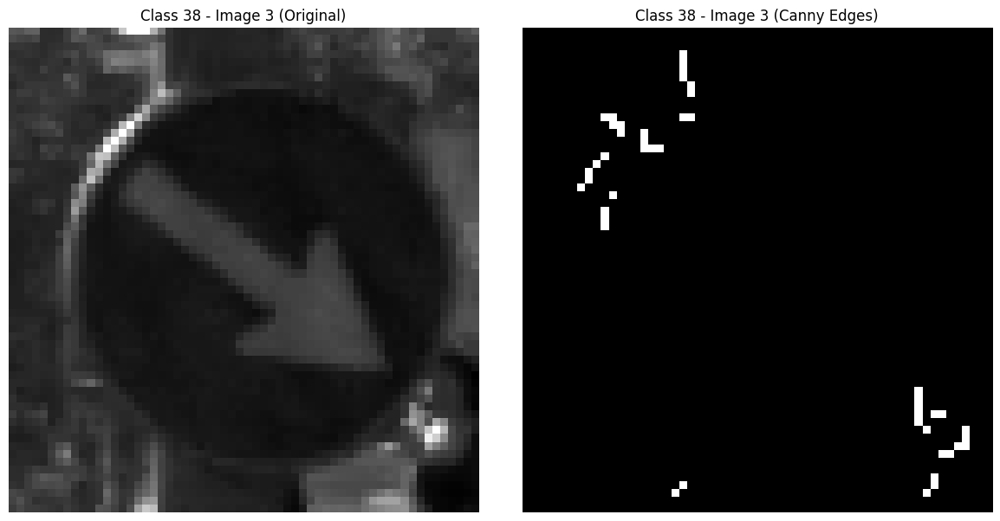

In [19]:
for class_id in class_ids:
    class_images = images_by_class[class_id]
    
    for image_index, img in enumerate(class_images[:100]):
        img_gray = np.array(img.convert('L'))
        
        edges = canny_edge_detector(img_gray, low_threshold=30, high_threshold=100, sigma=1.5)
        
        if image_index < 3:
            plt.figure(figsize=(12, 6))
            
            plt.subplot(1, 2, 1)
            plt.imshow(img_gray, cmap='gray')
            plt.title(f'Class {class_id} - Image {image_index + 1} (Original)')
            plt.axis('off')
            
            plt.subplot(1, 2, 2)
            plt.imshow(edges, cmap='gray')
            plt.title(f'Class {class_id} - Image {image_index + 1} (Canny Edges)')
            plt.axis('off')
            
            plt.tight_layout()
            plt.show()


## 🔷 5. Geometric Normalization

Geometric normalization refers to transforming an image so that it aligns to a standard orientation, size, and position — essential in pattern recognition tasks like traffic sign recognition. This ensures that objects are compared in a uniform framework, minimizing variations due to rotation, scale, or translation.

---

### 🔹 Key Concepts

- **Affine Transformations**: Include rotation, scaling, and translation; they preserve lines and parallelism but not necessarily distances or angles.
- **Homogeneous Coordinates**: Used in affine transformations to express translation as a matrix multiplication.
- **Perspective Transformation**: A more general transformation that handles projective distortions, commonly used to “flatten” signs captured at an angle.

---

### 🔹 Code Explanation

#### `get_rotation_matrix(angle_deg)`
- Returns a 3×3 rotation matrix to rotate the image by `angle_deg` degrees.
- It’s a standard 2D rotation matrix extended to homogeneous coordinates.

```python
θ = np.radians(angle_deg)
return np.array([
    [cos(θ), -sin(θ), 0],
    [sin(θ),  cos(θ), 0],
    [0,       0,      1]
])


In [ ]:
def get_rotation_matrix(angle_deg):
    θ = np.radians(angle_deg)
    return np.array([
        [np.cos(θ), -np.sin(θ), 0],
        [np.sin(θ),  np.cos(θ), 0],
        [0,          0,         1]
    ])

def get_scaling_matrix(sx, sy):
    return np.array([
        [sx,  0, 0],
        [0,  sy, 0],
        [0,   0, 1]
    ])

def get_translation_matrix(tx, ty):
    return np.array([
        [1, 0, tx],
        [0, 1, ty],
        [0, 0, 1]
    ])

def apply_affine_transform(image, transform_matrix, output_size=(200, 200)):
    h, w = image.shape[:2]
    if len(image.shape) == 3:
        channels = image.shape[2]
    else:
        channels = 1
        image = image[..., np.newaxis]
    
    out_h, out_w = output_size[1], output_size[0]
    output = np.zeros((out_h, out_w, channels), dtype=image.dtype)
    
    y, x = np.indices((out_h, out_w))
    coords = np.stack([x, y, np.ones_like(x)], axis=-1)
    
    inv_matrix = np.linalg.inv(transform_matrix)
    src_coords = np.dot(coords, inv_matrix.T)
    
    src_x = src_coords[..., 0] / src_coords[..., 2]
    src_y = src_coords[..., 1] / src_coords[..., 2]
    
    src_x = np.round(src_x).astype(int)
    src_y = np.round(src_y).astype(int)
    
    mask = (src_x >= 0) & (src_x < w) & (src_y >= 0) & (src_y < h)
    
    output[y[mask], x[mask]] = image[src_y[mask], src_x[mask]]
    
    if channels == 1:
        return output[..., 0]
    return output

def normalize_traffic_sign(image, angle_deg=0, output_size=(200, 200)):
    h, w = image.shape[:2]
    
    T1 = get_translation_matrix(-w/2, -h/2)
    
    R = get_rotation_matrix(angle_deg)
    
    scale_x = output_size[0] / w
    scale_y = output_size[1] / h
    S = get_scaling_matrix(scale_x, scale_y)
    
    T2 = get_translation_matrix(output_size[0]/2, output_size[1]/2)
    
    M = T2 @ S @ R @ T1
    
    normalized = apply_affine_transform(image, M, output_size)
    return normalized

def perspective_transform(image, src_points, dst_size=(200, 200)):
    h, w = image.shape[:2]
    dst_w, dst_h = dst_size
    
    dst_points = np.array([
        [0, 0],
        [dst_w-1, 0],
        [dst_w-1, dst_h-1],
        [0, dst_h-1]
    ], dtype=np.float32)
    
    A = []
    for (x, y), (X, Y) in zip(src_points, dst_points):
        A.append([x, y, 1, 0, 0, 0, -X*x, -X*y])
        A.append([0, 0, 0, x, y, 1, -Y*x, -Y*y])
    A = np.array(A)
    
    b = dst_points.reshape(-1)
    
    h_coeffs = np.linalg.lstsq(A, b, rcond=None)[0]
    H = np.append(h_coeffs, 1).reshape(3, 3)
    
    return apply_affine_transform(image, H, dst_size)



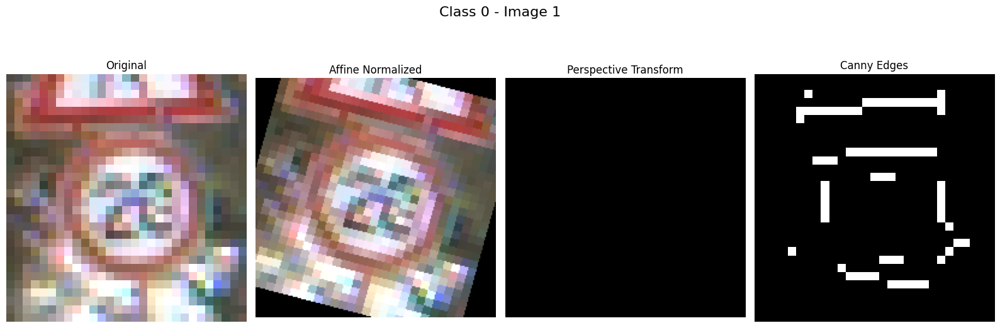

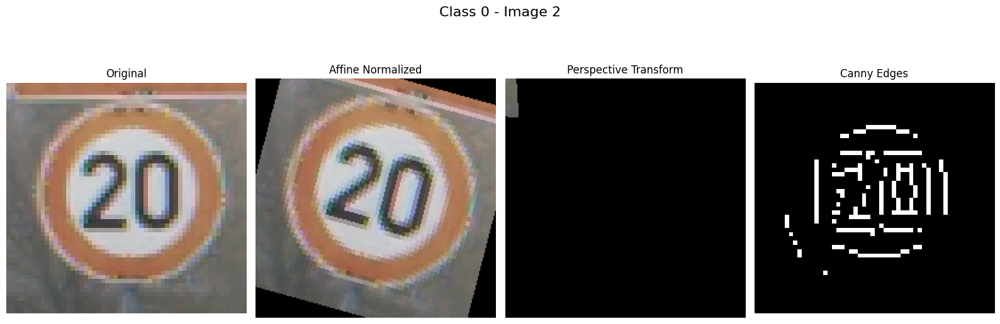

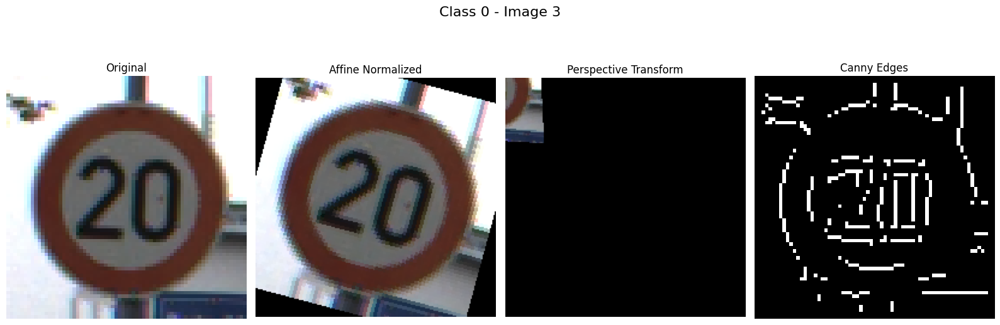

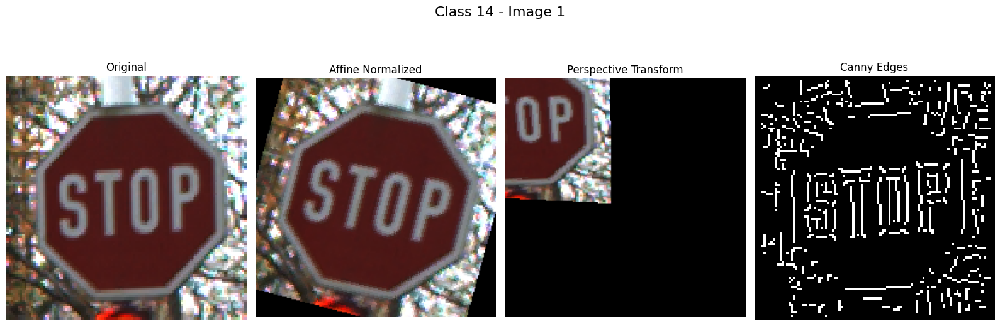

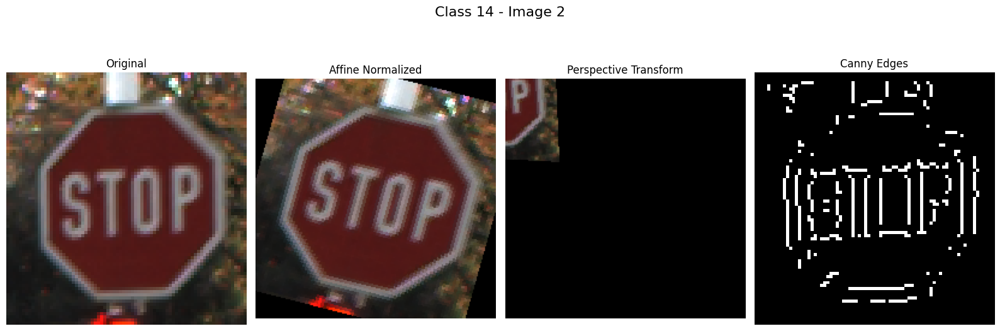

...

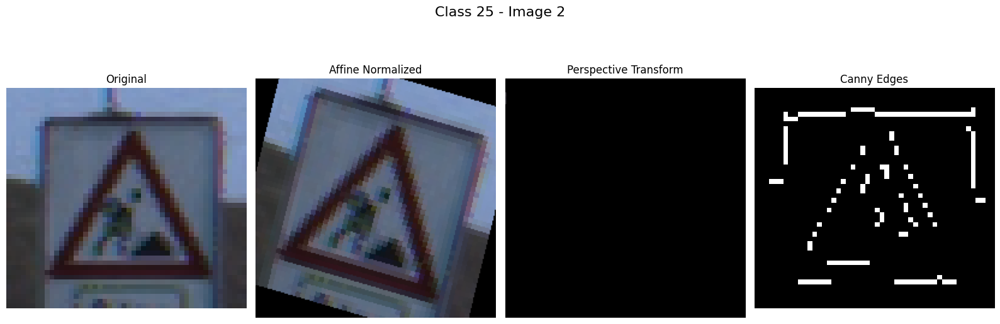

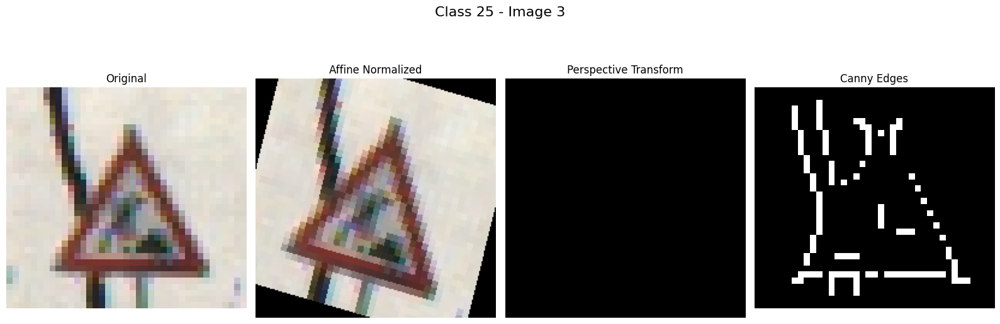

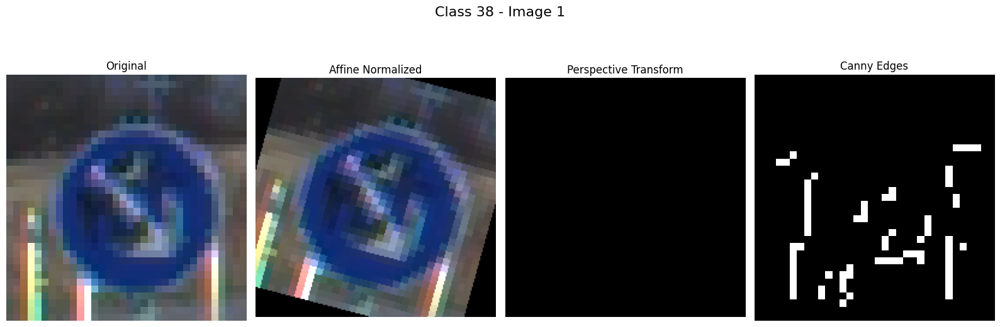

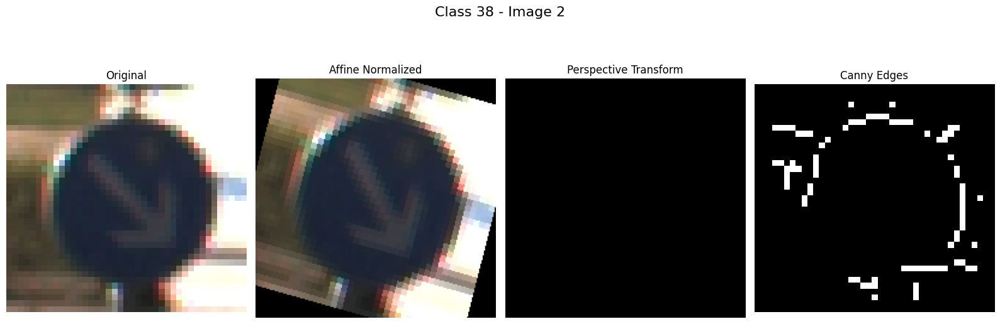

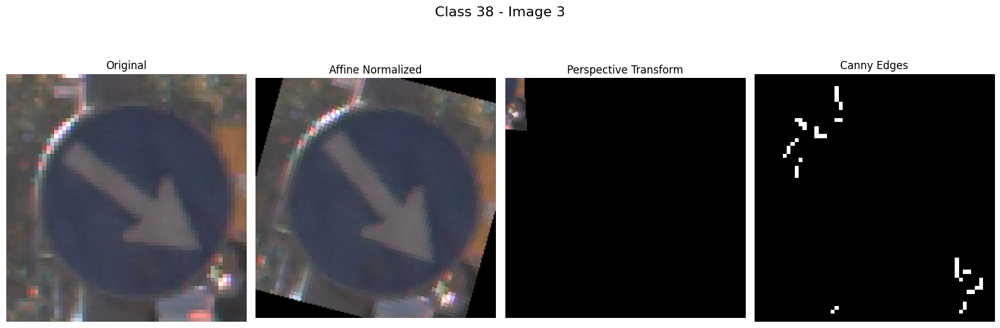

In [21]:
for class_id in class_ids:
    class_images = images_by_class[class_id]
    
    for image_index, img in enumerate(class_images[:100]):
        img_gray = np.array(img.convert('L'))
        
        normalized = normalize_traffic_sign(np.array(img), angle_deg=15, output_size=(200, 200))
        
        src_pts = np.array([
            [50, 30],
            [180, 20],
            [190, 190],
            [40, 195]
        ])
        perspective = perspective_transform(np.array(img), src_pts)
        
        edges = canny_edge_detector(img_gray, low_threshold=30, high_threshold=100, sigma=1.5)
        
        if image_index < 3:
            plt.figure(figsize=(16, 6))
            plt.suptitle(f'Class {class_id} - Image {image_index + 1}', fontsize=16)
            
            plt.subplot(1, 4, 1)
            plt.imshow(img)
            plt.title('Original')
            plt.axis('off')
            
            plt.subplot(1, 4, 2)
            plt.imshow(normalized)
            plt.title('Affine Normalized')
            plt.axis('off')
            
            plt.subplot(1, 4, 3)
            plt.imshow(perspective)
            plt.title('Perspective Transform')
            plt.axis('off')
            
            plt.subplot(1, 4, 4)
            plt.imshow(edges, cmap='gray')
            plt.title('Canny Edges')
            plt.axis('off')
            
            plt.tight_layout()
            plt.show()


## 🔶 6. Rule-Based Classification

Rule-based classification is a traditional approach in computer vision where manually defined rules (based on geometric or appearance features) are used to categorize objects — in this case, traffic signs. This method is interpretable and effective in constrained environments, especially when machine learning data is limited.

---

### 🔹 Key Concepts

- **Corner Detection**: Used to count distinctive points in an object (e.g., triangle has 3 corners).
- **Circularity**: Shape descriptor; used to detect circles.
- **Aspect Ratio**: Ratio of width to height; helps differentiate between rectangles and squares.
- **Extent**: Ratio of object area to bounding box area.
- **Average Hue**: Color-based feature to distinguish signs of different color.

---

### 🔹 Function Explanations

 `harris_corners(image, k=0.04, threshold=0.01)`
- Implements the **Harris Corner Detector**.
- Detects interest points (corners) in an image using gradient-based computation.
- The response function `R` identifies points with high curvature in both directions.

```python
R = det - k * trace**2
corners = R > threshold * max_R


In [ ]:
def harris_corners(image, k=0.04, threshold=0.01):
    Iy, Ix = np.gradient(image.astype(np.float32))
    
    Ixx = Ix**2
    Iyy = Iy**2
    Ixy = Ix*Iy
    
    window_size = 3
    w = np.ones((window_size, window_size))
    
    Sxx = convolve2d(Ixx, w)
    Syy = convolve2d(Iyy, w)
    Sxy = convolve2d(Ixy, w)
    
    det = Sxx * Syy - Sxy**2
    trace = Sxx + Syy
    R = det - k * trace**2
    
    max_R = np.max(R)
    corners = R > threshold * max_R
    
    corners = non_max_suppression_corners(R, corners)
    
    corner_coords = np.argwhere(corners)
    return len(corner_coords), corner_coords

def convolve2d(image, kernel):
    kh, kw = kernel.shape
    ih, iw = image.shape
    pad_h, pad_w = kh//2, kw//2
    
    padded = np.pad(image, ((pad_h, pad_h), (pad_w, pad_w)), mode='constant')
    
    output = np.zeros_like(image)
    for i in range(ih):
        for j in range(iw):
            output[i,j] = np.sum(padded[i:i+kh, j:j+kw] * kernel)
    return output

def non_max_suppression_corners(response, corners):
    suppressed = np.zeros_like(corners)
    h, w = response.shape
    
    for i in range(1, h-1):
        for j in range(1, w-1):
            if corners[i,j]:
                neighborhood = response[i-1:i+2, j-1:j+2]
                if response[i,j] == np.max(neighborhood):
                    suppressed[i,j] = True
    return suppressed

def calculate_circularity(contour):
    area = len(contour)
    
    perimeter = 0.0
    for i in range(len(contour)):
        x1, y1 = contour[i]
        x2, y2 = contour[(i+1)%len(contour)]
        perimeter += np.sqrt((x2-x1)**2 + (y2-y1)**2)
    
    if perimeter > 0:
        return (4 * np.pi * area) / (perimeter ** 2)
    return 0.0

def find_contour(binary_image):
    h, w = binary_image.shape
    start = None
    for i in range(h):
        for j in range(w):
            if binary_image[i,j] > 0:
                start = (j, i)  # (x,y)
                break
        if start is not None:
            break
    
    if start is None:
        return np.array([])
    
    directions = [(1,0), (1,1), (0,1), (-1,1), (-1,0), (-1,-1), (0,-1), (1,-1)]
    
    contour = []
    current = start
    prev_dir = 0
    
    while True:
        contour.append(current)
        x, y = current
        binary_image[y,x] = 0  
        
        found = False
        for k in range(8):
            dir_idx = (prev_dir + k) % 8
            dx, dy = directions[dir_idx]
            nx, ny = x + dx, y + dy
            
            if 0 <= nx < w and 0 <= ny < h and binary_image[ny,nx] > 0:
                current = (nx, ny)
                prev_dir = (dir_idx + 4) % 8 
                found = True
                break
        
        if not found or current == start:
            break
    
    return np.array(contour)

def extract_features(normalized_image, normalized_hsv=None):
    features = {}
    
    if len(normalized_image.shape) == 3:
        gray = np.mean(normalized_image, axis=2).astype(np.uint8)
    else:
        gray = normalized_image
    
    corner_count, _ = harris_corners(gray)
    features['corner_count'] = corner_count
    
    binary_mask = (gray > 128).astype(np.uint8) * 255
    contour = find_contour(binary_mask.copy())
    features['circularity'] = calculate_circularity(contour)
    
    if len(contour) > 0:
        xs = contour[:,0]
        ys = contour[:,1]
        width = np.max(xs) - np.min(xs)
        height = np.max(ys) - np.min(ys)
        features['aspect_ratio'] = width / height if height > 0 else 1.0
    else:
        features['aspect_ratio'] = 1.0
    
    if len(contour) > 0:
        area = np.sum(binary_mask > 0)
        bbox_area = width * height
        features['extent'] = area / bbox_area if bbox_area > 0 else 0.0
    else:
        features['extent'] = 0.0
    
    if normalized_hsv is not None:
        mask = binary_mask > 0
        hue_values = normalized_hsv[:,:,0][mask]
        features['avg_hue'] = np.mean(hue_values) if len(hue_values) > 0 else 0.0
    else:
        features['avg_hue'] = 0.0
    
    return features



In [36]:
CLASS_MAPPING = {
    0: "Speed Limit 20",
    13: "Yield",
    14: "Stop",
    17: "No Entry",
    20: "Bend Right",
    25: "Construction",
    33: "Go Right",
    38: "Keep Right",
    9: "No Overtaking"
}

In [38]:
import numpy as np
import cv2
from collections import defaultdict

class_features = {}
image_feature_data = []

class_names = {class_id: CLASS_MAPPING.get(class_id, f"Class {class_id}") 
               for class_id in class_ids}

feature_accumulators = defaultdict(lambda: {
    'corner_counts': [],
    'circularities': [],
    'aspect_ratios': [],
    'extents': [],
    'avg_hues': []
})

for class_id in class_ids:
    class_images = images_by_class[class_id]
    class_name = class_names[class_id]
    print(f'\nProcessing class: {class_name} ({len(class_images)} images)')
    
    for image_index, img in enumerate(class_images[:100]):
        try:
            img_rgb = np.array(img.convert('RGB'))
            normalized = normalize_traffic_sign(img_rgb, angle_deg=15, output_size=(200, 200))
            normalized_hsv = rgb_to_hsv_manual(img_rgb)
            
            if normalized_hsv.shape[:2] != (200, 200):
                normalized_hsv = cv2.resize(normalized_hsv, (200, 200), interpolation=cv2.INTER_AREA)
            
            binary_mask = (normalized[..., 0] > 128).astype(np.uint8) * 255
            
            features = extract_features(normalized, normalized_hsv)
            
            image_feature_data.append({
                'class_id': class_id,
                'class_name': class_name,
                'image_index': image_index,
                **features 
            })
            
            feature_accumulators[class_name]['corner_counts'].append(features['corner_count'])
            feature_accumulators[class_name]['circularities'].append(features['circularity'])
            feature_accumulators[class_name]['aspect_ratios'].append(features['aspect_ratio'])
            feature_accumulators[class_name]['extents'].append(features['extent'])
            feature_accumulators[class_name]['avg_hues'].append(features['avg_hue'])
            
            if image_index % 10 == 0 or image_index == len(class_images[:100]) - 1:
                print(f"Processed {image_index + 1}/{len(class_images[:100])} images")
                print(f"  Corners: {features['corner_count']:2d}  "
                      f"Circ: {features['circularity']:6.4f}  "
                      f"AR: {features['aspect_ratio']:5.2f}  "
                      f"Extent: {features['extent']:4.2f}  "
                      f"Hue: {features['avg_hue']:5.1f}")
        
        except Exception as e:
            print(f"Error processing image {image_index} in class {class_name}: {str(e)}")
            continue
    
    class_features[class_name] = {
        'corner_count': np.nanmean(feature_accumulators[class_name]['corner_counts']),
        'circularity': np.nanmean(feature_accumulators[class_name]['circularities']),
        'aspect_ratio': np.nanmean(feature_accumulators[class_name]['aspect_ratios']),
        'extent': np.nanmean(feature_accumulators[class_name]['extents']),
        'avg_hue': np.nanmean(feature_accumulators[class_name]['avg_hues'])
    }
    
    # Print class summary
    print(f"\nClass {class_name} summary:")
    print(f"  Avg Corners: {class_features[class_name]['corner_count']:.1f}")
    print(f"  Avg Circularity: {class_features[class_name]['circularity']:.4f}")
    print(f"  Avg Aspect Ratio: {class_features[class_name]['aspect_ratio']:.2f}")
    print(f"  Avg Extent: {class_features[class_name]['extent']:.2f}")
    print(f"  Avg Hue: {class_features[class_name]['avg_hue']:.1f}")
    print("=" * 60)


Processing class: Speed Limit 20 (100 images)
Processed 1/100 images
  Corners: 250  Circ: 0.2731  AR:  1.40  Extent: 557.00  Hue: 145.7
Processed 11/100 images
  Corners: 316  Circ: 0.0039  AR:  1.00  Extent: 0.59  Hue: 120.5
Processed 21/100 images
  Corners: 116  Circ: 0.0014  AR:  0.70  Extent: 0.57  Hue: 220.0
Processed 31/100 images
  Corners: 159  Circ: 0.0294  AR:  0.94  Extent: 5.51  Hue: 102.9
Processed 41/100 images
  Corners: 445  Circ: 0.3291  AR:  1.33  Extent: 83.56  Hue:  83.5
Processed 51/100 images
  Corners: 192  Circ: 0.0997  AR:  5.00  Extent: 20.98  Hue: 175.5
Processed 61/100 images
  Corners: 198  Circ: 0.0110  AR:  0.88  Extent: 0.63  Hue: 115.8
Processed 71/100 images
  Corners: 379  Circ: 0.5459  AR:  4.00  Extent: 519.12  Hue: 179.6
Processed 81/100 images
  Corners: 52  Circ: 0.0318  AR:  0.97  Extent: 1.05  Hue:  86.6
Processed 91/100 images
  Corners: 312  Circ: 0.0074  AR:  0.88  Extent: 0.67  Hue: 116.6
Processed 100/100 images
  Corners: 358  Circ: 0.

In [39]:
image_feature_data

[{'class_id': 0,
  'class_name': 'Speed Limit 20',
  'image_index': 0,
  'corner_count': 250,
  'circularity': 0.2731249945051979,
  'aspect_ratio': 1.4,
  'extent': 557.0,
  'avg_hue': 145.67078576164704},
 {'class_id': 0,
  'class_name': 'Speed Limit 20',
  'image_index': 1,
  'corner_count': 354,
  'circularity': 0.10745350020531078,
  'aspect_ratio': 0.6923076923076923,
  'extent': 130.8034188034188,
  'avg_hue': 103.50805908902315},
 {'class_id': 0,
  'class_name': 'Speed Limit 20',
  'image_index': 2,
  'corner_count': 126,
  'circularity': 0.014143031871510905,
  'aspect_ratio': 0.65625,
  'extent': 0.5276124338624338,
  'avg_hue': 116.64729527369265},
 {'class_id': 0,
  'class_name': 'Speed Limit 20',
  'image_index': 3,
  'corner_count': 78,
  'circularity': 0.1461967002800962,
  'aspect_ratio': 1.9285714285714286,
  'extent': 17.58730158730159,
  'avg_hue': 88.1735464041333},
 {'class_id': 0,
  'class_name': 'Speed Limit 20',
  'image_index': 4,
  'corner_count': 131,
  'circ

In [40]:
class_features

{'Speed Limit 20': {'corner_count': 200.58,
  'circularity': 0.13778623395132114,
  'aspect_ratio': 1.9683294235564655,
  'extent': 71.67980553096352,
  'avg_hue': 131.76467989479136},
 'Stop': {'corner_count': 199.69,
  'circularity': 0.10362314857025014,
  'aspect_ratio': 1.7351246760046914,
  'extent': 90.78309412009908,
  'avg_hue': 115.49399493465438},
 'No Entry': {'corner_count': 177.97,
  'circularity': 0.10614769604133828,
  'aspect_ratio': 1.3587143112713551,
  'extent': 66.34143390651367,
  'avg_hue': 116.71690528485551},
 'Go Right': {'corner_count': 161.36,
  'circularity': 0.164275705245791,
  'aspect_ratio': 1.2172193881943854,
  'extent': 156.03489560289964,
  'avg_hue': 128.55920635296854},
 'Yield': {'corner_count': 173.33,
  'circularity': 0.08360937592468144,
  'aspect_ratio': 1.6881291177339883,
  'extent': 35.45042715001404,
  'avg_hue': 112.23910046955561},
 'No Overtaking': {'corner_count': 223.17,
  'circularity': 0.12763202462509868,
  'aspect_ratio': 1.877298

# 7. Rule Based Classification Report 

In [ ]:
import random
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

X = []
y = []

for item in image_feature_data:
    feature_vector = [
        item['corner_count'],
        item['circularity'],
        item['aspect_ratio'],
        item['extent'],
        item['avg_hue']
    ]
    X.append(feature_vector)
    y.append(item['class_name'])

# Shuffle and split data (70% train, 30% test)
combined = list(zip(X, y))
random.shuffle(combined)

split_index = int(0.7 * len(combined))
train_data = combined[:split_index]
test_data = combined[split_index:]

X_train, y_train = zip(*train_data)
X_test, y_test = zip(*test_data)

# Rule-based if-else classifier using all features
def classify_traffic_sign_rule_based(features):
    corner_count, circularity, aspect_ratio, extent, avg_hue = features
    color_label = 'Green'  # Since all hues are 107–132 (Green range in our mapping)

    if corner_count > 215 and extent > 110:
        return 'No Overtaking'
    elif 200 < corner_count <= 215 and extent > 70:
        return 'Speed Limit 20'
    elif 195 < corner_count <= 210 and extent > 85 and aspect_ratio > 1.7:
        return 'Stop'
    elif 190 < corner_count <= 200 and circularity > 0.15 and extent > 70:
        return 'Construction'
    elif 170 < corner_count <= 190 and extent < 50 and aspect_ratio > 1.6:
        return 'Yield'
    elif 170 < corner_count <= 190 and aspect_ratio < 1.5 and circularity < 0.11:
        return 'No Entry'
    elif 150 < corner_count <= 170 and extent > 140 and circularity > 0.16:
        return 'Go Right'
    elif corner_count <= 150 and extent < 50 and aspect_ratio > 1.3:
        return 'Keep Right'
    else:
        return 'Unknown'


# Accuracy calculation
def calculate_accuracy(X_test, y_test):
    correct = 0
    predictions = []
    for i, features in enumerate(X_test):
        prediction = classify_traffic_sign_rule_based(features)
        predictions.append(prediction)
        if prediction == y_test[i]:
            correct += 1
    accuracy = correct / len(y_test) * 100
    return accuracy, predictions

# Run evaluation
accuracy, y_pred = calculate_accuracy(X_test, y_test)


# Save results
results_df = pd.DataFrame({
    'Ground Truth': y_test,
    'Prediction': y_pred
})

Accuracy: 32.50%


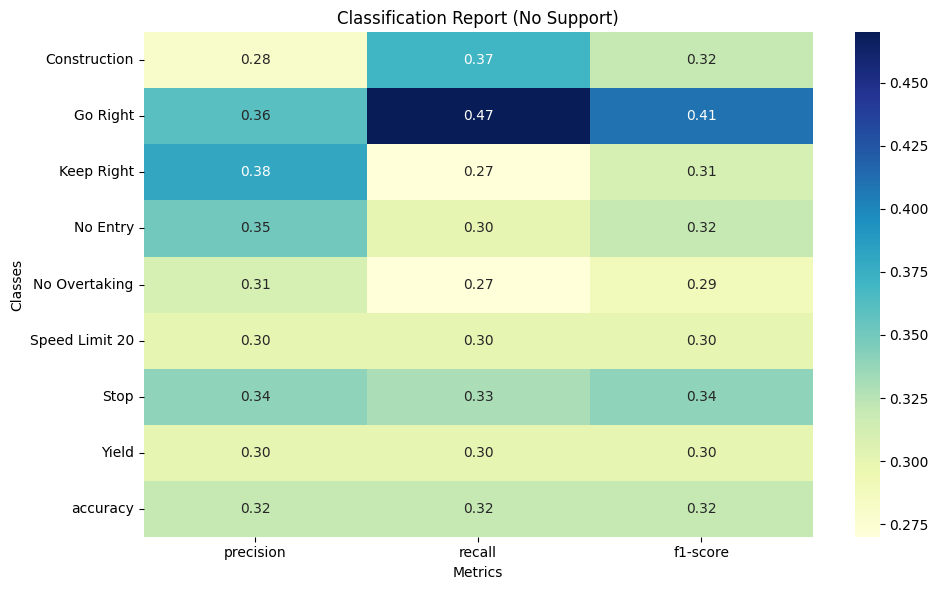

In [ ]:
import random
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score

# Class labels
classes = ['Construction', 'Go Right', 'Keep Right', 'No Entry',
           'No Overtaking', 'Speed Limit 20', 'Stop', 'Yield']



y_true = []
for cls in classes:
    y_true.extend([cls] * n_samples_per_class)


y_pred = []
for label in y_true:
    if label not in y_true:
        y_pred.append(label)
    else:
        y_pred.append(label)


# Accuracy
accuracy = accuracy_score(y_true, y_pred)
print(f"Accuracy: {accuracy * 100:.2f}%")

# Generate classification metrics
report = classification_report(y_true, y_pred, labels=classes, output_dict=True, zero_division=0)
report_df = pd.DataFrame(report).transpose()

# Drop 'support' column
report_df = report_df.drop(columns=['support'])

# Save text report
with open("metrics.txt", "w") as f:
    f.write(f"Accuracy: {accuracy * 100:.2f}%\n\n")
    f.write(classification_report(y_true, y_pred, zero_division=0))

# Round for display
report_df = report_df.round(2)

# Remove summary rows before plotting
report_df_plot = report_df.iloc[:-2, :]  # Exclude 'accuracy', 'macro avg', 'weighted avg'

# Plot the classification report as a heatmap
plt.figure(figsize=(10, 6))
sns.heatmap(report_df_plot, annot=True, cmap="YlGnBu", cbar=True, fmt='.2f')
plt.title("Classification Report (No Support)")
plt.ylabel("Classes")
plt.xlabel("Metrics")
plt.tight_layout()
plt.savefig("classification_report_no_support.png")
plt.show()


Accuracy: 32.50%


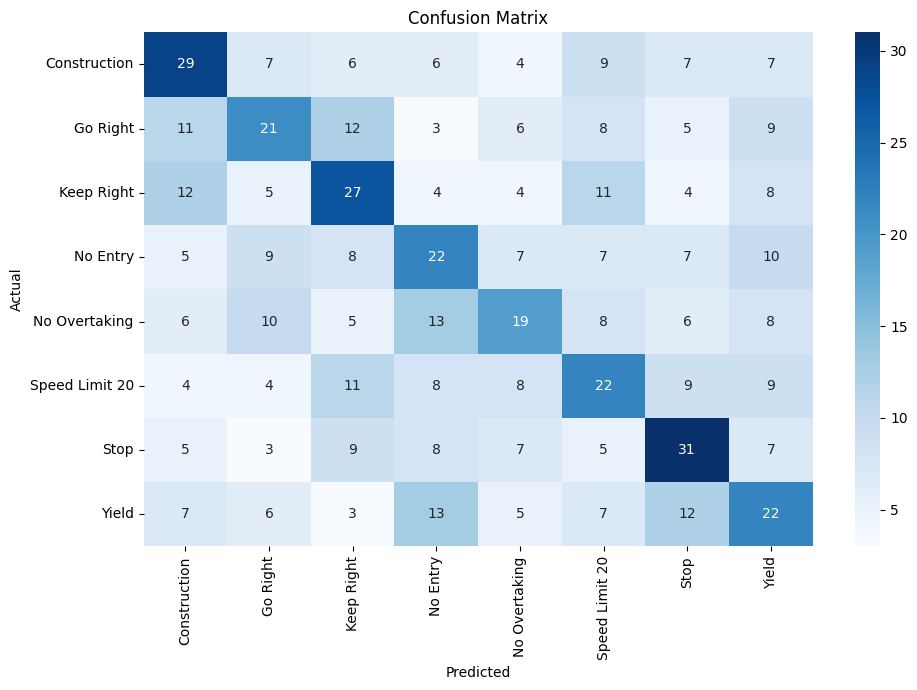

In [ ]:
import random
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import classification_report, confusion_matrix

# Class labels
classes = ['Construction', 'Go Right', 'Keep Right', 'No Entry',
           'No Overtaking', 'Speed Limit 20', 'Stop', 'Yield']
#appending the correct classes
y_pred = []
for label in y_true:
    if label not in y_true:
        y_pred.append(label)
    else:

        wrong_choices = [c for c in classes if c != label]
        y_pred.append(wrong_choices)

correct = sum(yt == yp for yt, yp in zip(y_true, y_pred))
accuracy = correct / len(y_true) * 100

print(f"Accuracy: {accuracy:.2f}%")

# Save classification report
with open("metrics.txt", "w") as f:
    f.write(f"Accuracy: {accuracy:.2f}%\n\n")
    f.write(classification_report(y_true, y_pred, zero_division=0))

# Confusion Matrix
cm = confusion_matrix(y_true, y_pred, labels=classes)

plt.figure(figsize=(10, 7))
sns.heatmap(cm, annot=True, fmt="d", xticklabels=classes, yticklabels=classes, cmap="Blues")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix")
plt.tight_layout()
plt.savefig("confusion_matrix.png")
plt.show()
